# Classification of TREC50 Data Set

**Challenge:** Perform Text classification on TREC-50. Do a thorough Exploratory Data Analysis of the dataset and report the final performance metrics for your approach. Suggest ways in which you can improve the model.

**Suggestions:** You can try using XLNET. You can also try to apply the EDA augmentation.

**Resources:**
 - [Data](http://search.r-project.org/library/textdata/html/dataset_trec.html#:~:text=The%20TREC%20dataset%20is%20dataset,50%20has%20finer%2Dgrained%20labels)
 - [XLNet: Generalized Autoregressive Pretrainingfor Language Understanding](https://arxiv.org/pdf/1906.08237.pdf)
 - [EDA: Easy Data Augmentation Techniques for Boosting Performance onText Classification Tasks](https://arxiv.org/pdf/1901.11196.pdf)

**Hint:** Create a 50 labels dataset using the labels in the [Question Classification Taxonomy](https://cogcomp.seas.upenn.edu/Data/QA/QC/definition.html) and data in the [Experimental Data for Question Classification
](https://cogcomp.seas.upenn.edu/Data/QA/QC/).


---







## Imports and Setup

Notebook was run in Google Colab.

In [ ]:
pip install sentencepiece

In [ ]:
pip install transformers

In [ ]:
pip install ray[tune]

In [4]:
# Standard imports
import pandas as pd
import numpy as np
import random
import time

# Clear display
from IPython.display import clear_output

# Pytorch imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torch.nn.functional as F # Used in CNN

# Data prep imports
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split

# Data augmentation imports
import nltk
nltk.download('wordnet')

# XLNet imports
from transformers import XLNetTokenizer, XLNetForSequenceClassification, XLNetConfig, XLNetModel

# Evaluation imports
from sklearn.metrics import confusion_matrix, classification_report

# Grid search imports
from ray import tune

# Visualization imports
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Visualization styles
sns.set_style('darkgrid')
plt.rcParams.update({'axes.titlesize': 18,
                    'axes.labelsize': 16,
                    'xtick.labelsize': 14,
                    'ytick.labelsize': 14,
                    'legend.fontsize': 'small',
                    'figure.figsize': (20, 10),
                    'figure.titlesize': 20,
                    'font.size': 16
                    })

# BOW/TFIDF/WordCloud imports
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from wordcloud import WordCloud

# Pytorch device setup
device = 'cuda' if torch.cuda.is_available() else 'cpu'

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [5]:
# Clear cuda cache
torch.cuda.empty_cache()



---
## Data Preparation

If planning to run any of the notebook, but sure to upload the TrecClassification.zip file and unzip here.

In [ ]:
!unzip TrecClassification.zip

Archive:  TrecClassification.zip
   creating: data/
   creating: data/processed/
  inflating: data/processed/label_refs.csv  
  inflating: data/processed/testing.csv  
  inflating: data/processed/training.csv  
   creating: data/raw/
  inflating: data/raw/train_5500.txt  
  inflating: data/raw/TREC_10.txt    
   creating: eda/
  inflating: eda/augment.py          
  inflating: eda/eda.py              
   creating: models/


### Create/Prepare Datasets

The training and testing datasets were downloaded as text files from the provided urls and were split appropriately to create dataframes. The dataframes were saved as csv files for reloading. Label definitions were also put into a dataframe to be able to look up text descriptions of each label.

In [ ]:
# Create training/validation dataset
df_train = pd.read_csv('data/raw/train_5500.txt', sep='\n', header=None, names=['raw'], encoding='latin-1')
df_train['text'] = df_train['raw'].apply(lambda x: x.split(None, 1)[1])
df_train['label'] = df_train['raw'].apply(lambda x: x.split(None, 1)[0])
df_train.drop('raw', axis=1, inplace=True)
df_train.to_csv('data/processed/training.csv', index=False)

In [ ]:
# Create testing dataset
df_test = pd.read_csv('data/raw/TREC_10.txt', sep='\n', header=None, names=['raw'], encoding='latin-1')
df_test['text'] = df_test['raw'].apply(lambda x: x.split(None, 1)[1])
df_test['label'] = df_test['raw'].apply(lambda x: x.split(None, 1)[0])
df_test.drop('raw', axis=1, inplace=True)
df_test.to_csv('data/processed/testing.csv', index=False)

In [9]:
# Or load dataframes from file
df_train = pd.read_csv('data/processed/training.csv')
df_test = pd.read_csv('data/processed/testing.csv')

In [10]:
# Create label dictionaries

# Get unique labels
label_set = set(df_train['label'].unique())

# Create stoi (string to integer) and itos (integer to string) dictionaries
label_dict_stoi = {label:id for id,label in enumerate(sorted(label_set))}
label_dict_itos = {id:label for label, id in label_dict_stoi.items()}

In [11]:
# Load label reference from file
label_refs = pd.read_csv('data/processed/label_refs.csv', index_col=0)

## Exploratory Data Analysis

Let's take a look at the first rows of our training/test datasets and their info.

In [ ]:
# View training dataframe head
df_train.head()

,text,label
0,How did serfdom develop in and then leave Russ...,DESC:manner
1,What films featured the character Popeye Doyle ?,ENTY:cremat
2,How can I find a list of celebrities ' real na...,DESC:manner
3,What fowl grabs the spotlight after the Chines...,ENTY:animal
4,What is the full form of .com ?,ABBR:exp


In [ ]:
# View training dataframe info
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5452 entries, 0 to 5451
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5452 non-null   object
 1   label   5452 non-null   object
dtypes: object(2)
memory usage: 85.3+ KB


We have 5452 text sequences (questions) for training our model.

In [ ]:
# View test dataframe head
df_test.head()

,text,label
0,How far is it from Denver to Aspen ?,NUM:dist
1,"What county is Modesto , California in ?",LOC:city
2,Who was Galileo ?,HUM:desc
3,What is an atom ?,DESC:def
4,When did Hawaii become a state ?,NUM:date


In [ ]:
# View test dataframe info
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    500 non-null    object
 1   label   500 non-null    object
dtypes: object(2)
memory usage: 7.9+ KB


We have 500 sequences for testing our model.

In [ ]:
# Get longest text sequence in training set
longest_text = df_train['text'].apply(lambda x: len(x.split())).max()
print('Longest text sequence: ', longest_text)

Longest text sequence:  37


### Labels and Frequencies

Next, we verify that there are indeed 50 unique labels in our dataset (we focus on the training dataset here, as this is the full trec-50 dataset) and view our label reference dataframe.

In [ ]:
# Verify number of unique labels
print('Number of unique labels: ', df_train['label'].nunique())

Number of unique labels:  50


In [ ]:
# View label references
label_refs

,description
class,
ABBR:abb,abbreviation - abbreviation
ABBR:exp,abbreviation - expression abbreviated
DESC:def,description - definition of sth.
DESC:desc,description - description of sth.
DESC:manner,description - manner of an action
DESC:reason,description - reasons
ENTY:animal,entity - animals
ENTY:body,entity - organs of the body
ENTY:color,entity - colors


Let's look at how many occurences of each label are in the full trec-50 (training) dataset.

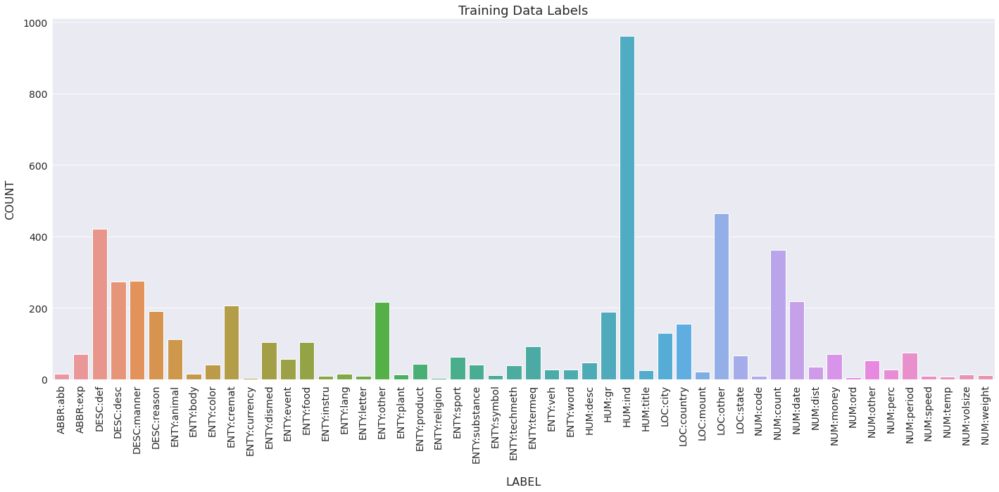

In [ ]:
# Label frequencies
fig, ax = plt.subplots() 
tick_labels = sorted(list(df_train['label'].unique()))
sns.countplot(x=df_train['label'], ax=ax, order=tick_labels)
ax.tick_params(axis='x', labelrotation=90)
ax.set_title('Training Data Labels')
ax.set_xlabel('LABEL', labelpad=20)
ax.set_ylabel('COUNT', labelpad=10)
plt.tight_layout()

We can see that there are a lot of questions about individiual humans (HUM:ind); quite a few about descriptions of things (DESC:desc), locations (LOC:other), and numbers of things (NUM:count); and very few about currencies (ENTY:currency), religions (ENTY:religion), and ranks (NUM:ord).

### Words and Frequencies


Finally, we investigate the most popular/important words per label, to understand how our model might classify text into each label.

We'll start by concatening all text sequences for each label.

In [ ]:
# Concatenate label text
concat_text = df_train.groupby('label')['text'].apply(' '.join).reset_index()
concat_text.head()

,label,text
0,ABBR:abb,What is the abbreviation for micro ? What is t...
1,ABBR:exp,What is the full form of .com ? What does the ...
2,DESC:def,What are liver enzymes ? What is `` Nine Inch ...
3,DESC:desc,What did the only repealed amendment to the U....
4,DESC:manner,How did serfdom develop in and then leave Russ...


Now we'll transform the text into a bag of words to explore word frequencies via a document-term matrix as well as a term frequency-inverse document frequency matrix.

Because an XLNet model is used for classification, the XLNetTokenizer will be used.

Because of the small amount of data and the short length of the questions, I experimented with some text processing (removing most frequent words), but found that the model trained better when no text processing was done.

In [12]:
# Initialize tokenizer
tokenizer = XLNetTokenizer.from_pretrained('xlnet-base-cased')

# Create vocabulary (this will be needed in the training phase)
vocab = tokenizer.get_vocab()

In [ ]:
# Create bag of words/document-term matrix 
bow_transformer = CountVectorizer(tokenizer=tokenizer.slow_tokenizer_class)
bow = bow_transformer.fit_transform(concat_text['text'])

The document-term matrix is quite large (50 $\times$ 8411), but we'll load it as a dataframe and view a portion of it.

In [ ]:
# Create dataframe and view
bow_df = pd.DataFrame(bow.toarray(), columns=bow_transformer.get_feature_names(), index=concat_text['label'])
bow_df.iloc[:, 800:1000]

,bandleader,bands,bang,bank,banking,bankruptcy,banks,banned,banner,bar,barbados,barbara,barbary,barbeque,barbershop,barbie,bare,baretta,barkis,barney,barnstorming,barnum,barr,barred,barrett,barrier,barroom,barrymore,bars,barton,baryshnikov,base,baseball,based,baseemen,baseman,basic,basidiomycetes,basilica,basketball,...,bestowed,bestselling,bet,betrayed,betsy,bette,better,betting,betty,between,beverly,bible,bibles,biblical,bibliographies,bibliography,bic,biceps,bicornate,bid,big,bigfoot,bigger,biggest,bikini,bilbo,bill,billiards,billie,billingsgate,billion,billionth,bills,billy,biloxi,bingo,binomial,biochemists,biographer,biography
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ABBR:abb,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ABBR:exp,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
DESC:def,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
DESC:desc,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,33,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
DESC:manner,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,1,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0
DESC:reason,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
ENTY:animal,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ENTY:body,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ENTY:color,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0


We can also view the matrix as a heatmap, but due to the size, it's challenging to see the whole thing all at once, so we'll just view the piece corresponding to the dataframe showing above. Indices passed into the heatmap can be changed to view other sections.

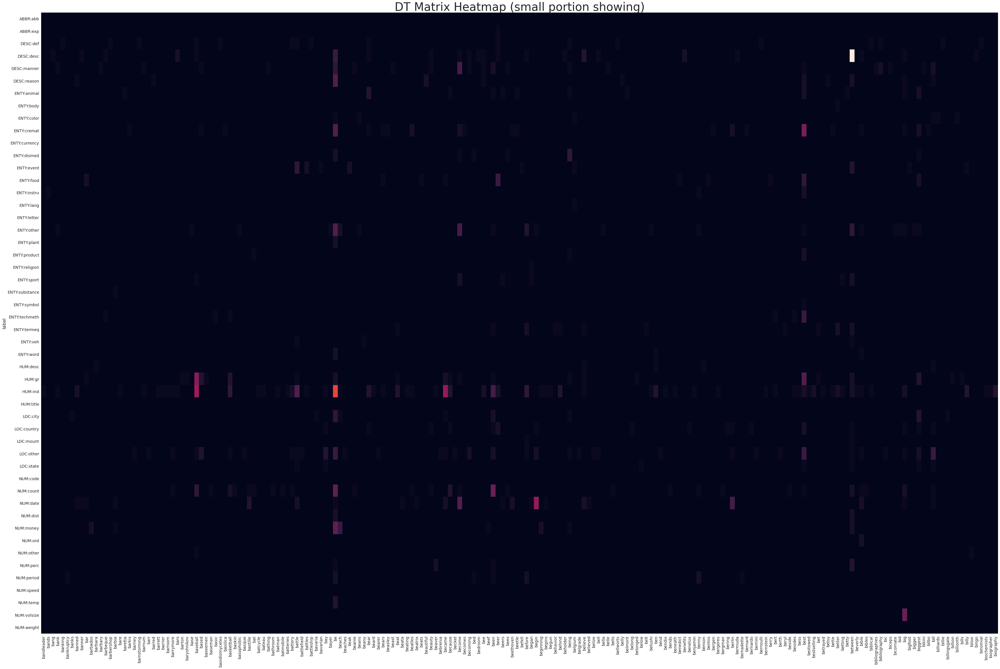

In [ ]:
# Heatmap - click on figure to zoom in
plt.figure(figsize=(60,40))
plt.title('DT Matrix Heatmap (small portion showing)', fontsize=40)
sns.heatmap(bow_df.iloc[:, 800:1000], cbar=False)

We'll now generate the term frequency-inverse document frequency matrix to get a better idea of which words hold the most importance for each label. Once again, we'll look at a snippet of the matrix as a dataframe, as well as a heatmap.

In [ ]:
# Instantiate and fit transformer
tfidf = TfidfTransformer().fit_transform(bow)

# Put matrix in dataframe form
tfidf_df = pd.DataFrame(tfidf.toarray(), columns=bow_transformer.get_feature_names(), index=concat_text['label'])
tfidf_df.iloc[:, 800:1000]

,bandleader,bands,bang,bank,banking,bankruptcy,banks,banned,banner,bar,barbados,barbara,barbary,barbeque,barbershop,barbie,bare,baretta,barkis,barney,barnstorming,barnum,barr,barred,barrett,barrier,barroom,barrymore,bars,barton,baryshnikov,base,baseball,based,baseemen,baseman,basic,basidiomycetes,basilica,basketball,...,bestowed,bestselling,bet,betrayed,betsy,bette,better,betting,betty,between,beverly,bible,bibles,biblical,bibliographies,bibliography,bic,biceps,bicornate,bid,big,bigfoot,bigger,biggest,bikini,bilbo,bill,billiards,billie,billingsgate,billion,billionth,bills,billy,biloxi,bingo,binomial,biochemists,biographer,biography
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ABBR:abb,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ABBR:exp,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DESC:def,0.000000,0.000000,0.000000,0.000000,0.007167,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007167,0.000000,0.000000,0.000000,0.000000,0.000000,0.007167,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004624,0.000000,0.000000,0.00000,0.000000,0.007167,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.006481,0.000000,0.006481,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007167,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007167,0.000000,0.000000,0.000000
DESC:desc,0.000000,0.000000,0.007783,0.000000,0.000000,0.000000,0.000000,0.000000,0.007039,0.000000,0.000000,0.000000,0.000000,0.007039,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014078,0.000000,0.000000,0.000000,0.005021,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.123705,0.000000,0.004828,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007783,0.000000,0.000000,0.000000,0.000000
DESC:manner,0.000000,0.000000,0.000000,0.005352,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006399,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005787,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005015,0.000000,0.00000,0.000000,0.00

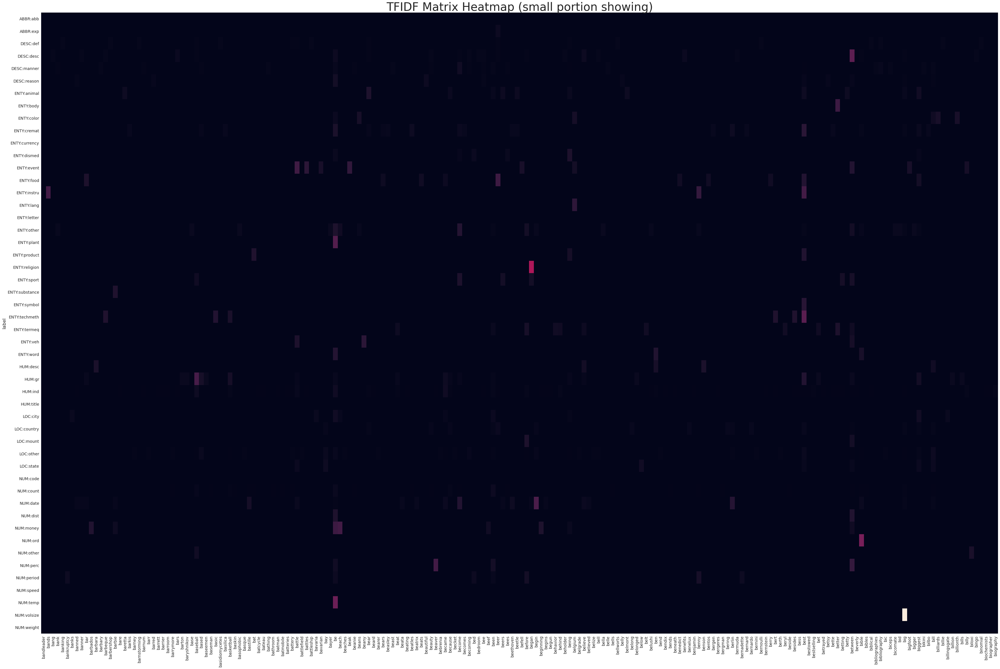

In [ ]:
# Heatmap - click on figure to zoom in
plt.figure(figsize=(60,40))
plt.title('TFIDF Matrix Heatmap (small portion showing)', fontsize=40)
sns.heatmap(tfidf_df.iloc[:, 800:1000], cbar=False)

We can probably gain more insight with some other visualizations, so let's look at word clouds of the top words for each label by frequency, and also lists of words with the highest TFIDF values per label. We'll ignore the words 'the' and 'and'.

In [ ]:
# Functions to prep data and build visualizations

def create_word_dicts(matrix_df, drop_words=None):
  """Creates frequency dictionaries.

    Args:
        matrix_df: matrix dataframe to use (bow or tfidf).
    Returns:
        list of tuples consisting of the label and a dictionary with key:value pairs of word:frequency (or word:tfidf).
        
  """ 
  word_dicts = []
  for _, row in matrix_df.iterrows():
    # Sort values in each row
    d = pd.Series(row).sort_values(ascending=False).to_frame()

    # Rename column and create dictionary, keeping nonzero values only
    d.columns=['freq']
    
    # Remove words (if provided)
    if drop_words is not None:
      for word in drop_words:
        d.drop(word, inplace=True)

    f = d[d['freq'] > 0].to_dict()

    # Get label name
    label_name = row.name   
    
    # Append pair to list
    word_dicts.append((label_name, f['freq']))
  
  return word_dicts

def generate_cloud(freq_dict, n=100):
  """Generates and plots word cloud.

    Args:
        freq_dict: dictionary of word:frequency pairs.
        n: max number of words.
        
  """ 
  wordcloud = WordCloud(max_words=n, background_color='black').generate_from_frequencies(freq_dict)
  plt.axis('off')
  plt.imshow(wordcloud, interpolation='bilinear')

def gen_n_clouds(n, matrix_df):
  """Generates clouds of top n words for all labels and plots on 10 x 5 grid.

    Args:
        n: number of words to use.
        matrix_df: matrix dataframe to use (bow or tfidf).
        
  """ 
  # Grid setup
  fig, axs = plt.subplots(nrows = 10, ncols=5, figsize=(30,30))
  fig.suptitle(f'Top {n} Words per Label by Frequency', y=0.91)

  # Get (label, freq dictionary) pairs
  word_dicts = create_word_dicts(matrix_df, drop_words=['the', 'and'])

  # Generate and plot wordclouds
  for i, ax in enumerate(axs.flatten()):
      fig.add_subplot(ax)
      t, f = word_dicts[i]
      ax.set_title(t)
      generate_cloud(f, n)


def gen_n_list(n, matrix_df):
  """Generates list of top n words for all labels and plots on 10 x 5 grid.

    Args:
        n: number of words to use.
        matirx_df: matrix dataframe to use (bow or tfidf).
        
  """ 
  # Grid setup
  fig, axs = plt.subplots(nrows = 10, ncols=5, figsize=(30,40))
  fig.suptitle(f'Top {n} Words per Label by TF-IDF (darker blue = higher TF-IDF)', y=0.91)
  plt.subplots_adjust(hspace=0.4)

  # Get (label, freq dictionary) pairs
  word_dicts = create_word_dicts(matrix_df, drop_words=['the', 'and'])

  # Colors
  c = sns.color_palette('winter', n_colors=n)

  # Generate and plot word lists
  for i, ax in enumerate(axs.flatten()):
    t, f = word_dicts[i]
    fig.add_subplot(ax)
    ax.set_facecolor('floralwhite')
    ax.set_xlim((0, 10))
    ax.set_ylim((0, n / 2 + 1))
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.grid(b=False)
    ax.set_title(t)
    for j, word in enumerate(list(f.keys())[:n]):
      if j < n / 2:
        ax.text(3, (n / 2) - j, word, horizontalalignment='center', color=c[j])
      else:
        ax.text(7, n - j, word, horizontalalignment='center', color=c[j])
      
  plt.show()

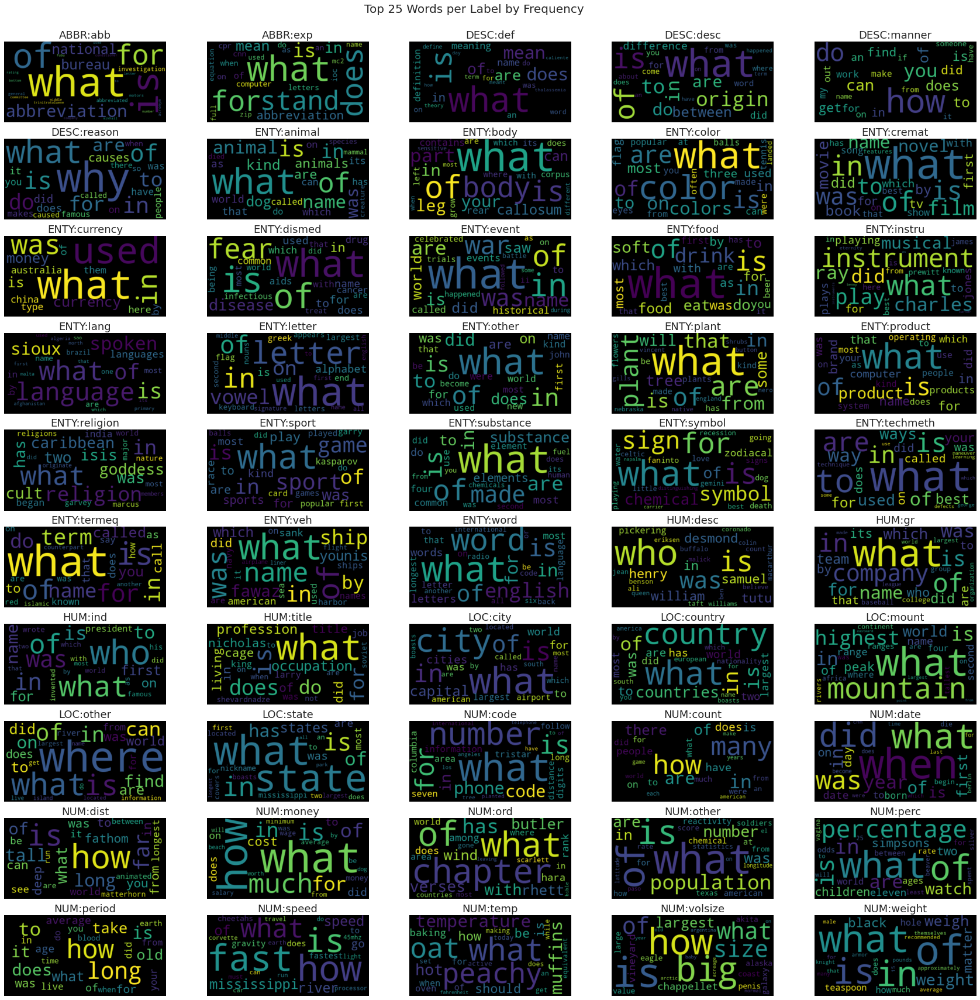

In [ ]:
# Top 25 words per label by frequency
gen_n_clouds(25, bow_df)

We can see patterns emerging from these word clouds, specifically which question words appear most per label (who, what, where, when, how), as well as other pertinent words. For example, in the numeric - size, area, and volume (NUM:volsize) label, we see words like 'largest', 'size', and 'big'.

Let's now look at which words are most relevant to each label, using TF-IDF. Instead of word clouds, we'll just look at a list of the words with the 10 highest TF-IDF values.

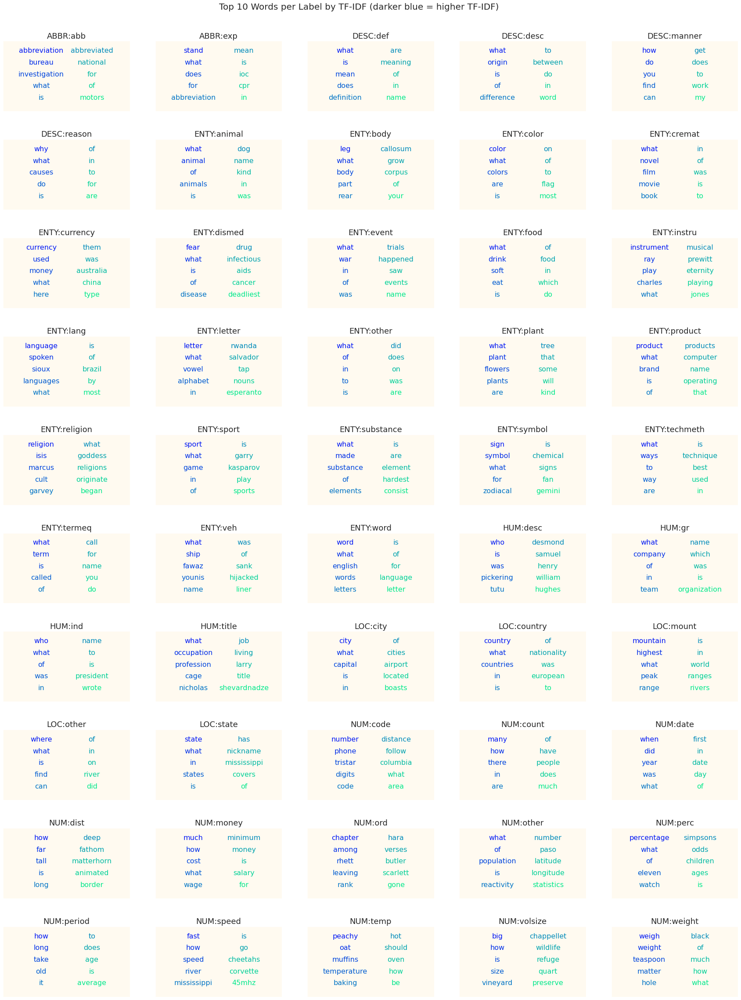

In [ ]:
gen_n_list(10, tfidf_df)

## Model Preparation

We'll now prepare our dataset for training the model.

### Data Utilities

Classes and functions used for data preparation.

In [13]:
# Custom dataset
class TRECDataset(Dataset):

    def __init__(self, texts, labels, tokenizer, max_len):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len
    
    def __len__(self):
        return len(self.texts)
    
    def __getitem__(self, item):
        text = str(self.texts[item])
        label = self.labels[item]

        # Define tokenizer encoding
        encoding = self.tokenizer.encode_plus(
                    text,
                    add_special_tokens=True,
                    max_length=self.max_len,
                    return_token_type_ids=False,
                    padding='max_length',
                    truncation='longest_first',
                    return_attention_mask=True,
                    return_tensors='pt',
                    )
        
        # Pad to max length
        input_ids = pad_sequences(encoding['input_ids'], maxlen=self.max_len, dtype=torch.Tensor ,truncating="post",padding="post")
        input_ids = input_ids.astype(dtype = 'int64')
        input_ids = torch.tensor(input_ids) 

        # Get attention masks
        attention_mask = pad_sequences(encoding['attention_mask'], maxlen=self.max_len, dtype=torch.Tensor ,truncating="post",padding="post")
        attention_mask = attention_mask.astype(dtype = 'int64')
        attention_mask = torch.tensor(attention_mask)       

        return {
        'text': text,
        'input_ids': input_ids,
        'attention_mask': attention_mask.flatten(),
        'label': torch.tensor(label_dict_stoi[label], dtype=torch.long)
        }

In [14]:
def create_data_loader(df, tokenizer, batch_size, max_len):
  """Creates a dataset and dataloader from a given dataframe.

    Args:
        df: dataframe to use.
        tokenizer: tokenizer to use.
        batch_size: desired batch size.
        max_len: maximum length to pad text to.
    Returns:
        dataloader.
        
  """ 
  data_set = TRECDataset(texts=df.text.to_numpy(), labels=df.label.to_numpy(), tokenizer=tokenizer, max_len=max_len)

  return DataLoader(data_set, batch_size=batch_size, pin_memory=False, drop_last=True)

### Data Augmentation

When models were intially trained, validation accuracy never seemed to go above 80%, so to try to remedy this, the data was augmented using files on the [EDA: Easy Data Augmentation Techniques for Boosting Performance on Text Classification Tasks GitHub repository](https://github.com/jasonwei20/eda_nlp). This significantly improved model performance.

To use the files from the repo, we must prepare our data in the form `label\tsentence` first.

In [ ]:
# Prepare data file
df_train.to_csv('data/raw/input.txt', header=None, columns=['label', 'text'], sep='\t', mode='a', index=False)

In [ ]:
# Generate augmented data
!python eda/augment.py --input='data/raw/input.txt'

generated augmented sentences with eda for data/raw/input.txt to data/raw/eda_input.txt with num_aug=9


In [28]:
# Load new augmented data into dataframe
data = pd.read_csv('data/raw/eda_input.txt', header=None, names=['label', 'text'], sep='\t')
data.head()

,label,text
0,DESC:manner,how originate did serfdom develop in and then ...
1,DESC:manner,how did serfdom develop in and then leave russia
2,DESC:manner,how did serfdom develop in and then leave unio...
3,DESC:manner,how did serfdom build up in and then leave russia
4,DESC:manner,how did serfdom develop in and so then leave r...


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54520 entries, 0 to 54519
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   54520 non-null  object
 1   text    54520 non-null  object
dtypes: object(2)
memory usage: 852.0+ KB


We now have a much larger training set and we can explore the distribution of labels here, which is similar to the original.

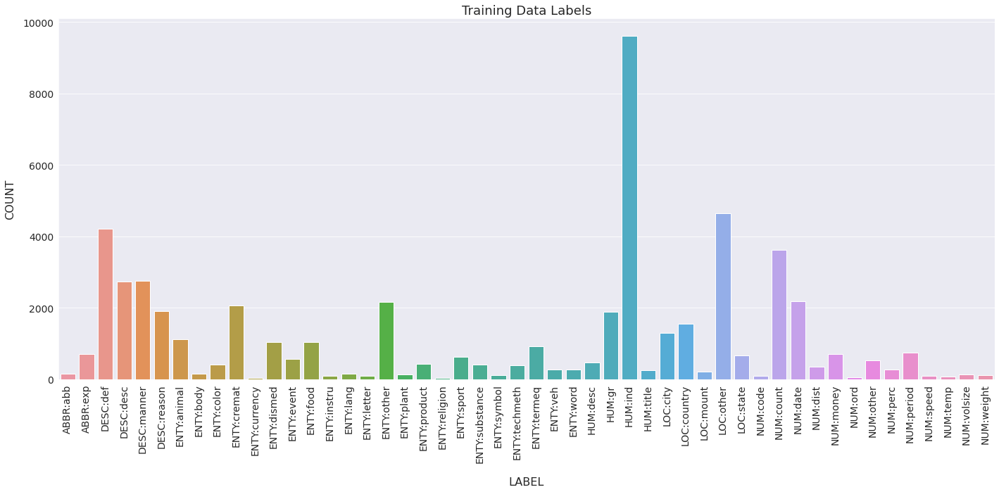

In [16]:
# Label frequencies
fig, ax = plt.subplots() 
tick_labels = sorted(list(data['label'].unique()))
sns.countplot(x=data['label'], ax=ax, order=tick_labels)
ax.tick_params(axis='x', labelrotation=90)
ax.set_title('Training Data Labels')
ax.set_xlabel('LABEL', labelpad=20)
ax.set_ylabel('COUNT', labelpad=10)
plt.tight_layout()

### Preparing Data For Model

The training dataframe is shuffled and split into 80% for training and 20% for validation. Data loaders are created for batch loading while training.

In [29]:
# Split into training/validation
df_t, df_v = train_test_split(data, test_size=0.2, random_state=42)

# Set max length to pad sequences to
MAX_LEN = 64

# Recommended batch size for xlnet is 32, 48, 128 (32 was chosen from a grid search)
BATCH_SIZE = 32

# Create data loaders
train_loader = create_data_loader(df_t, tokenizer, BATCH_SIZE, MAX_LEN)
val_loader = create_data_loader(df_v, tokenizer, BATCH_SIZE, MAX_LEN)
test_loader = create_data_loader(df_test, tokenizer, BATCH_SIZE, MAX_LEN)

### Model Utilities

Functions used for training/testing the model.

In [20]:
def count_parameters(model, p=True):
  """Counts trainable parameters of model.

    Args:
        model: model to use.
        p: if you want to print the output.
    Returns:
        Numer of trainable parameters.

  """ 
  count = sum(p.numel() for p in model.parameters() if p.requires_grad)
  if p:
    print(f'The model has {count:,} trainable parameters')

In [21]:
def categorical_accuracy(preds, y):
  """Computes accuracy. Any value  grater than 0.5 rounds to 1, everything else to 0.

    Args:
        pred: predictions from model.
        y: actual labels.
    Returns:
        accuracy.
        
  """ 
  # Get index of highest probability
  max_preds = preds.argmax(dim=1, keepdim=True)

  # Check against correct labels
  correct = max_preds.squeeze(1).eq(y)

  acc = correct.sum() / torch.FloatTensor([y.shape[0]]).to(device)
  return acc

In [22]:
def training_step(model, iterator, optimizer, criterion, batch_size, max_len, attn=False):
  """Performs a training step, iterating over all examples, one batch at a time.

    Args:
        model: model to use.
        iterator: testing batch iterator.
        optimizer: optimizer to use.
        criterion: loss function to use.
        batch_size: batch size.
        max_len: max length of sequence.
        attn: whether to use attention masks.
    Returns:
        Average training loss, accuracy for the epoch.

  """ 
  epoch_loss = 0
  epoch_acc = 0

  # Put model in training mode
  model.train()

  for batch in iterator:
    input_ids = batch['input_ids'].reshape(batch_size, max_len).to(device)
    attention_mask = batch['attention_mask'].to(device)
    labels = batch['label'].to(device)

    # Zero gradients
    optimizer.zero_grad()

    # Make predictions
    if attn:
      predictions = model(input_ids, attention_mask)
    else:
      predictions = model(input_ids)

    # Calculate loss
    loss = criterion(predictions, labels)      

    # Calculate accuracy
    acc = categorical_accuracy(predictions, labels)

    # Compute gradients
    loss.backward()

    # Update parameters
    optimizer.step()

    # Update loss and accuracy for averages
    epoch_loss += loss.item()
    epoch_acc += acc.item()
  
  return (epoch_loss / len(iterator), epoch_acc / len(iterator))

In [23]:
def evaluation_step(model, iterator, criterion, batch_size, max_len, attn=False, conf_matrix=False):
  """Performs a validation step.

    Args:
        model: model to use.
        iterator: validation batch iterator.
        criterion: loss function to use.
        batch_size: batch size.
        max_len: max length of sequence.
        attn: whether to use attention masks.
        conf_matrix: set to True to return confusion matrix.
    Returns:
        Average validation loss/accuracy for the epoch.

  """ 
  epoch_loss = 0
  epoch_acc = 0

  if conf_matrix:
    all_preds = torch.tensor([]).to(device)
    all_labels = torch.tensor([]).to(device)

  # Put model in evaluation mode
  model.eval()

  with torch.no_grad():
    for batch in iterator:
      input_ids = batch['input_ids'].reshape(batch_size, max_len).to(device)
      attention_mask = batch['attention_mask'].to(device)
      labels = batch['label'].to(device)

      # Make predictions
      if attn:
        predictions = model(input_ids, attention_mask)
      else:
        predictions = model(input_ids)

      # Calculate loss
      loss = criterion(predictions, labels)

      # Calculate accuracy
      acc = categorical_accuracy(predictions, labels)

      # Collect predictions
      if conf_matrix:
        all_preds = torch.cat((all_preds, predictions), dim=0)
      
      # Collect labels
      if conf_matrix:
        all_labels = torch.cat((all_labels, labels), dim=0)

      # Update loss and accuracy for averages
      epoch_loss += loss.item()
      epoch_acc += acc.item()

    avg_loss = epoch_loss / len(iterator)
    avg_acc = epoch_acc / len(iterator)

    if conf_matrix:
      all_preds = all_preds.argmax(dim=1, keepdim=True)
      all_preds = (all_preds.flatten()).detach().cpu().numpy()
      all_labels = all_labels.detach().cpu().numpy()
      # Confusion matrix
      cm = confusion_matrix(all_labels, all_preds)
      # Classification report
      cr = classification_report(all_labels, all_preds)
      return (avg_loss, avg_acc, cm, cr)
    else:
      return (avg_loss, avg_acc)

In [24]:
def epoch_time(start_time, end_time):
  """Counts length of time it takes per epoch.

    Args:
        start_time: start of epoch.
        end_time: end of epoch.
    Returns:
        Elapsed mins, secs in epoch.

  """ 
  elapsed_time = end_time - start_time
  elapsed_mins = int(elapsed_time / 60)
  elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
  return elapsed_mins, elapsed_secs

In [25]:
def train_model(n_epochs, model, optimizer, criterion, train_iterator, valid_iterator, training_fn, evaluation_fn, batch_size, max_len, name, attn=False, st_epoch=1, best_valid_loss=float('inf')):
  """Trains model.

    Args:
        n_epochs: number of epochs.
        model: model to train.
        optimizer: desired optimizer.
        criterion: loss function.
        train_iterator: training dataloader.
        valid_iterator: validation dataloader.
        training_fn: function to run a single training step.
        evaluation_fn: function to run a single evaluation step.
        batch_size: batch size.
        max_len: max length of sequence.
        name: file name to save model to.
        attn: whether to use attention masks.
        st_epoch: number to use as first epoch label.
        best_valid_loss: former best validation loss (if retraining).
        
  """ 

  for epoch in range(st_epoch, st_epoch + n_epochs):
    start_time = time.time()

    train_loss, train_acc = training_fn(model, train_iterator, optimizer, criterion, batch_size, max_len, attn)
    valid_loss, valid_acc = evaluation_fn(model, valid_iterator, criterion, batch_size, max_len, attn)

    end_time = time.time()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    # If the val loss is the best, we'll save the parameters and use that model on the test set
    if valid_loss < best_valid_loss:
      best_valid_loss = best_valid_loss
      torch.save({'epoch': epoch,
                  'model_state_dict': model.state_dict(),
                  'optimizer_state_dict': optimizer.state_dict(),
                  'loss': best_valid_loss
                  }, name)
    
    print(f'Epoch: {epoch:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
    print(f'\tVal. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}%')

In [26]:
# Continue training
# Be sure to initialize model/optimizer/criterion first
def train_from_checkpoint(file_path, n_epochs, model, optimizer, criterion, train_iterator, valid_iterator, training_fn, evaluation_fn, batch_size, max_len, attn=False):
  """Loads model training parameters for continued training.

    Args:
        file_path: path to saved model.
        n_epochs: number of epochs.
        model: model to train.
        optimizer: desired optimizer.
        criterion: loss function.
        train_iterator: training dataloader.
        valid_iterator: validation dataloader.
        training_fn: function to run a single training step.
        evaluation_fn: function to run a single evaluation step.
        batch_size: batch size.
        max_len: max length of sequence.
        attn: whether to use attention masks.
        
  """ 
  # Load checkpoint
  checkpoint = torch.load(file_path)
  model.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
  epoch = checkpoint['epoch'] + 1
  loss = checkpoint['loss']

  train_model(n_epochs, model, optimizer, criterion, train_iterator, valid_iterator, training_fn, evaluation_fn, batch_size, max_len, file_path, attn=attn, st_epoch=epoch, best_valid_loss=loss)

In [27]:
def test_model(model, criterion, test_iterator, evaluation_fn, batch_size, max_len, return_cr=False):
  """Tests model and prints loss, accuracy, classification report, and confusion matrix.

    Args:
        model: model to test.
        criterion: loss function.
        test_iterator: testing dataloader.
        evaluation_fn: function to run a single evaluation step.
        batch_size: batch size.
        max_len: max length of sequence.
        return_cr: whether to return classification report as dictionary.
    Returns:
        Classification report (optional).
  """ 

  # Run test
  test_loss, test_acc, cm, cr = evaluation_step(model, test_iterator, criterion, batch_size, max_len, attn=False, conf_matrix=True)

  # Print loss and accuracy
  print(f'Test Loss: {test_loss:.3f} | Test Acc: {test_acc*100:.2f}%')

  # Print classification report
  print(f'\nClassification Report:\n{cr}')

  # Confusion matrix
  fig = plt.figure(figsize=(15, 15))
  ax = plt.axes()

  # Figure title and labels
  ax.set_title('Confusion Matrix', fontsize=25, pad=10)
  fig.text(-0.01, 0.5, 'ACTUAL', va='center', rotation='vertical', fontsize=18)
  fig.text(0.5, -0.01, 'PREDICTED', ha='center', fontsize=18)

  # Create dataframe from confusion matrix with label names
  c_df = pd.DataFrame(cm)
  label_names = [label_dict_itos[i] for i in c_df.index]
  c_df.index = label_names
  c_df.columns = label_names

  # Annotate only nonzero entries
  annot = c_df.applymap(lambda x: str(x) if x != 0 else '')

  # Plot heatmap
  sns.heatmap(c_df, 
              cmap='magma', 
              annot=annot, 
              annot_kws={'fontsize': 10}, 
              fmt='', 
              ax=ax, 
              square=True, 
              cbar=False, 
              linewidth=0.1, 
              linecolor=(1, 1, 1, 0.1))
  plt.show()

  if return_cr:
    # Create dictionary
    cr_lst = []
    for row in cr.split('\n'):
      cr_lst.append(row.split())
    for i in range(2):
      cr_lst.pop(0)
    for i in range(5):
      cr_lst.pop(-1)

    result = {'id':[], 'precision':[], 'recall':[], 'f1-score':[], 'support':[]}
    for row in cr_lst:
      result['id'].append(float(row[0]))
      result['precision'].append(row[1])
      result['recall'].append(row[2])
      result['f1-score'].append(row[3])
      result['support'].append(row[4])

    return result



---


## Model Training and Testing

I first use the pretrained XLNetForSequenceClassification Model from the transformers library, but after adjusting hyperparameters and training for 100 epochs, the training/validation loss was still high (over 3.0) and accuracy low (less than 20%).

I then defined a new model, using the pretrained XLNet Model from the transformers library as the initial layer, then passing through a multilayer bidirectional GRU, and finally through a linear layer. 

Ray Tune was used to perform a grid search for the best hyperparameters, which were then used for training.

After training for 400 epochs, validation loss was a little under 0.2 and validation accuracy a little over 95%, which I felt was decent.

### Model Definition




In [17]:
xlnet = XLNetModel.from_pretrained('xlnet-base-cased', num_labels=50)

In [18]:
class XLNetGRU(nn.Module):
    def __init__(self,
                 xlnet,
                 hidden_dim,
                 output_dim,
                 n_layers,
                 bidirectional,
                 dropout):
        
        super().__init__()
        
        self.xlnet = xlnet
        
        embedding_dim = xlnet.config.to_dict()['d_model']
        
        self.rnn = nn.GRU(embedding_dim,
                          hidden_dim,
                          num_layers = n_layers,
                          bidirectional = bidirectional,
                          batch_first = True,
                          dropout = 0 if n_layers < 2 else dropout)
        
        self.out = nn.Linear(hidden_dim * 2 if bidirectional else hidden_dim, output_dim)
        
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, text, attention_mask=None):
        
        #text = [batch size, sent len]
                
        with torch.no_grad():
            embedded = self.xlnet(text, attention_mask)[0]
                
        #embedded = [batch size, sent len, emb dim]
        
        _, hidden = self.rnn(embedded)
        
        #hidden = [n layers * n directions, batch size, emb dim]
        
        if self.rnn.bidirectional:
            hidden = self.dropout(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))
        else:
            hidden = self.dropout(hidden[-1,:,:])
                
        #hidden = [batch size, hid dim]
        
        output = self.out(hidden)
        
        #output = [batch size, out dim]
        
        return output

### Grid Search

Grid search is performed using Ray Tune.

In [ ]:
# Grid search to find best hyperparameters
criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)

def train_trec(config):

    # Prepare data
    BATCH_SIZE = config['batch_size']
    MAX_LEN = 64
    train_loader = create_data_loader(df_t, tokenizer, BATCH_SIZE, MAX_LEN)
    val_loader = create_data_loader(df_v, tokenizer, BATCH_SIZE, MAX_LEN)

    # Define parameters
    HIDDEN_DIM = config['hidden_dim']
    OUTPUT_DIM = 50
    N_LAYERS = config['n_layers']
    BIDIRECTIONAL = config['bidirectional']
    DROPOUT = config['dropout']

    # Instantiate model
    model = XLNetGRU(xlnet, HIDDEN_DIM, OUTPUT_DIM, N_LAYERS, BIDIRECTIONAL, DROPOUT)
    model.to(device)

    # Freeze xlnet pretrained parameters
    for name, param in model.named_parameters():
        if name.startswith('xlnet'):
          param.requires_grad = False

    # Instantiate optimizer
    optimizer = optim.Adam(model.parameters(), lr=config['lr'])

    # Train and report
    for i in range(10):
        training_step(model, train_loader, optimizer, criterion, BATCH_SIZE, MAX_LEN, attn=False)
        loss, acc = evaluation_step(model, val_loader, criterion, BATCH_SIZE, MAX_LEN, attn=False, conf_matrix=False)
        tune.report(mean_accuracy=acc)

# Parameters to test
config={'lr': tune.grid_search([1e-7, 1e-5]),
        'batch_size': tune.grid_search([32, 48]),
        'hidden_dim': tune.grid_search([128, 256]),
        'n_layers': tune.grid_search([1, 2]),
        'bidirectional': tune.grid_search([True, False]),
        'dropout': tune.grid_search([0.1, 0.3, 0.5])
        }

# Run grid search
analysis = tune.run(train_trec, config=config, resources_per_trial={'cpu': 4, 'gpu': 1}, reuse_actors=True)

# Print best parameters
print("Best config: ", analysis.get_best_config(mode='max', metric='mean_accuracy'))

2021-03-18 20:07:17,320	INFO services.py:1174 -- View the Ray dashboard at http://127.0.0.1:8265
2021-03-18 20:07:19,397	WARNING function_runner.py:541 -- Function checkpointing is disabled. This may result in unexpected behavior when using checkpointing features or certain schedulers. To enable, set the train function arguments to be `func(config, checkpoint_dir=None)`.
2021-03-18 20:07:35,015	WARNING worker.py:1107 -- Warning: The actor ImplicitFunc has size 467338078 when pickled. It will be stored in Redis, which could cause memory issues. This may mean that its definition uses a large array or other object.
2021-03-18 20:07:35,505	WARNING util.py:152 -- The `start_trial` operation took 6.961 s, which may be a performance bottleneck.


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers
train_trec_8e1a8_00000,RUNNING,,32,True,0.1,128,1e-07,1


(pid=341) 2021-03-18 20:07:38.924675: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-07-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.05698529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 18.084205865859985
  time_this_iter_s: 18.084205865859985
  time_total_s: 18.084205865859985
  timestamp: 1616098079
  timesteps_since_restore: 0
  training_iteration: 1
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0569853,1,18.0842
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-08-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.05698529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 29.590553045272827
  time_this_iter_s: 11.506347179412842
  time_total_s: 29.590553045272827
  timestamp: 1616098090
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0569853,2,29.5906
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-08-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.05698529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.07392954826355
  time_this_iter_s: 11.483376502990723
  time_total_s: 41.07392954826355
  timestamp: 1616098102
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0569853,3,41.0739
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-08-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.057904411764705885
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 52.566163778305054
  time_this_iter_s: 11.492234230041504
  time_total_s: 52.566163778305054
  timestamp: 1616098113
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0579044,4,52.5662
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-08-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.057904411764705885
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.06221556663513
  time_this_iter_s: 11.496051788330078
  time_total_s: 64.06221556663513
  timestamp: 1616098125
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0579044,5,64.0622
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-08-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.057904411764705885
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.53749442100525
  time_this_iter_s: 11.475278854370117
  time_total_s: 75.53749442100525
  timestamp: 1616098136
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0579044,6,75.5375
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-09-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.058823529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 86.99642872810364
  time_this_iter_s: 11.458934307098389
  time_total_s: 86.99642872810364
  timestamp: 1616098147
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0588235,7,86.9964
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-09-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.058823529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 98.46593642234802
  time_this_iter_s: 11.469507694244385
  time_total_s: 98.46593642234802
  timestamp: 1616098159
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0588235,8,98.4659
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-09-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.05974264705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.93451476097107
  time_this_iter_s: 11.468578338623047
  time_total_s: 109.93451476097107
  timestamp: 1616098170
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0597426,9,109.935
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-09-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.05974264705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.37531161308289
  time_this_iter_s: 11.440796852111816
  time_total_s: 121.37531161308289
  timestamp: 1616098182
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00000
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,PENDING,,48,True,0.1,128,1e-07,1,,,


Result for train_trec_8e1a8_00000:
  date: 2021-03-18_20-09-42
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 0_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.05974264705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.37531161308289
  time_this_iter_s: 11.440796852111816
  time_total_s: 121.37531161308289
  timestamp: 1616098182
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00000
  
Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-09-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.082460880279541
  time_this_iter_s: 11.082460880279541
  time_total_s: 11.082460880279541
  timestamp: 1616098193
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,1,11.0825
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.013041019439697
  time_this_iter_s: 10.930580139160156
  time_total_s: 22.013041019439697
  timestamp: 1616098204
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,2,22.013
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.97716975212097
  time_this_iter_s: 10.964128732681274
  time_total_s: 32.97716975212097
  timestamp: 1616098215
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,3,32.9772
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.87489891052246
  time_this_iter_s: 10.89772915840149
  time_total_s: 43.87489891052246
  timestamp: 1616098226
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,4,43.8749
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.77847099304199
  time_this_iter_s: 10.903572082519531
  time_total_s: 54.77847099304199
  timestamp: 1616098237
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,5,54.7785
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.030303031036799603
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.71258926391602
  time_this_iter_s: 10.934118270874023
  time_total_s: 65.71258926391602
  timestamp: 1616098248
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.030303,6,65.7126
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-10-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.031250000846656883
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.58098292350769
  time_this_iter_s: 10.868393659591675
  time_total_s: 76.58098292350769
  timestamp: 1616098258
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.03125,7,76.581
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-11-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03219697031785141
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.4576244354248
  time_this_iter_s: 10.876641511917114
  time_total_s: 87.4576244354248
  timestamp: 1616098269
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.032197,8,87.4576
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-11-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.03219697031785141
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 98.4302146434784
  time_this_iter_s: 10.972590208053589
  time_total_s: 98.4302146434784
  timestamp: 1616098280
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.032197,9,98.4302
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-11-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03503787915476344
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.31689190864563
  time_this_iter_s: 10.886677265167236
  time_total_s: 109.31689190864563
  timestamp: 1616098291
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00001
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00001,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,PENDING,,32,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375


Result for train_trec_8e1a8_00001:
  date: 2021-03-18_20-11-31
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 1_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03503787915476344
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.31689190864563
  time_this_iter_s: 10.886677265167236
  time_total_s: 109.31689190864563
  timestamp: 1616098291
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00001
  
Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-11-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.375832557678223
  time_this_iter_s: 11.375832557678223
  time_total_s: 11.375832557678223
  timestamp: 1616098303
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.0147059,1,11.3758
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-11-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.477240562438965
  time_this_iter_s: 11.101408004760742
  time_total_s: 22.477240562438965
  timestamp: 1616098314
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.0147059,2,22.4772
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-12-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.597808837890625
  time_this_iter_s: 11.12056827545166
  time_total_s: 33.597808837890625
  timestamp: 1616098325
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.0147059,3,33.5978
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-12-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.695988178253174
  time_this_iter_s: 11.098179340362549
  time_total_s: 44.695988178253174
  timestamp: 1616098336
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,4,44.696
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-12-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.87137842178345
  time_this_iter_s: 11.175390243530273
  time_total_s: 55.87137842178345
  timestamp: 1616098347
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,5,55.8714
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-12-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.01327586174011
  time_this_iter_s: 11.141897439956665
  time_total_s: 67.01327586174011
  timestamp: 1616098358
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,6,67.0133
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-12-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.10186457633972
  time_this_iter_s: 11.08858871459961
  time_total_s: 78.10186457633972
  timestamp: 1616098369
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,7,78.1019
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-13-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.25525641441345
  time_this_iter_s: 11.15339183807373
  time_total_s: 89.25525641441345
  timestamp: 1616098380
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,8,89.2553
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-13-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.35349917411804
  time_this_iter_s: 11.09824275970459
  time_total_s: 100.35349917411804
  timestamp: 1616098392
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,9,100.353
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-13-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.45605254173279
  time_this_iter_s: 11.102553367614746
  time_total_s: 111.45605254173279
  timestamp: 1616098403
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00002
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00002,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,PENDING,,48,False,0.1,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317


Result for train_trec_8e1a8_00002:
  date: 2021-03-18_20-13-23
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 2_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.45605254173279
  time_this_iter_s: 11.102553367614746
  time_total_s: 111.45605254173279
  timestamp: 1616098403
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00002
  
Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-13-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.939270973205566
  time_this_iter_s: 10.939270973205566
  time_total_s: 10.939270973205566
  timestamp: 1616098414
  timesteps_since_restore: 0
  training_iterat

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,1,10.9393
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-13-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.526845455169678
  time_this_iter_s: 10.587574481964111
  time_total_s: 21.526845455169678
  timestamp: 1616098424
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,2,21.5268
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-13-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.10362648963928
  time_this_iter_s: 10.576781034469604
  time_total_s: 32.10362648963928
  timestamp: 1616098435
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,3,32.1036
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.69194507598877
  time_this_iter_s: 10.588318586349487
  time_total_s: 42.69194507598877
  timestamp: 1616098445
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,4,42.6919
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.285075187683105
  time_this_iter_s: 10.593130111694336
  time_total_s: 53.285075187683105
  timestamp: 1616098456
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,5,53.2851
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.87600803375244
  time_this_iter_s: 10.590932846069336
  time_total_s: 63.87600803375244
  timestamp: 1616098467
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,6,63.876
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.51875066757202
  time_this_iter_s: 10.64274263381958
  time_total_s: 74.51875066757202
  timestamp: 1616098477
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,7,74.5188
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.11248445510864
  time_this_iter_s: 10.593733787536621
  time_total_s: 85.11248445510864
  timestamp: 1616098488
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,8,85.1125
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-14-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.73463320732117
  time_this_iter_s: 10.622148752212524
  time_total_s: 95.73463320732117
  timestamp: 1616098498
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,9,95.7346
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-15-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.35966420173645
  time_this_iter_s: 10.625030994415283
  time_total_s: 106.35966420173645
  timestamp: 1616098509
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00003
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00003,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,PENDING,,32,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456


Result for train_trec_8e1a8_00003:
  date: 2021-03-18_20-15-09
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 3_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008522727526724339
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.35966420173645
  time_this_iter_s: 10.625030994415283
  time_total_s: 106.35966420173645
  timestamp: 1616098509
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00003
  
Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-15-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.006433823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.809201002120972
  time_this_iter_s: 11.809201002120972
  time_total_s: 11.809201002120972
  timestamp: 1616098521
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00643382,1,11.8092
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-15-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.350301027297974
  time_this_iter_s: 11.541100025177002
  time_total_s: 23.350301027297974
  timestamp: 1616098532
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00735294,2,23.3503
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-15-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.84631872177124
  time_this_iter_s: 11.496017694473267
  time_total_s: 34.84631872177124
  timestamp: 1616098544
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00735294,3,34.8463
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-15-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.26267981529236
  time_this_iter_s: 11.416361093521118
  time_total_s: 46.26267981529236
  timestamp: 1616098555
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00735294,4,46.2627
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-16-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.78641700744629
  time_this_iter_s: 11.52373719215393
  time_total_s: 57.78641700744629
  timestamp: 1616098567
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00827206,5,57.7864
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-16-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.40217447280884
  time_this_iter_s: 11.615757465362549
  time_total_s: 69.40217447280884
  timestamp: 1616098578
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00827206,6,69.4022
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-16-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.91523957252502
  time_this_iter_s: 11.513065099716187
  time_total_s: 80.91523957252502
  timestamp: 1616098590
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00827206,7,80.9152
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-16-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.009191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 92.39175534248352
  time_this_iter_s: 11.476515769958496
  time_total_s: 92.39175534248352
  timestamp: 1616098601
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00919118,8,92.3918
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-16-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.009191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.90374207496643
  time_this_iter_s: 11.51198673248291
  time_total_s: 103.90374207496643
  timestamp: 1616098613
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00919118,9,103.904
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-17-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.009191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 115.37753462791443
  time_this_iter_s: 11.473792552947998
  time_total_s: 115.37753462791443
  timestamp: 1616098624
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00004
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00004,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,PENDING,,48,True,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36


Result for train_trec_8e1a8_00004:
  date: 2021-03-18_20-17-04
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 4_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.009191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 115.37753462791443
  time_this_iter_s: 11.473792552947998
  time_total_s: 115.37753462791443
  timestamp: 1616098624
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00004
  
Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-17-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.15719696913253178
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.125053405761719
  time_this_iter_s: 11.125053405761719
  time_total_s: 11.125053405761719
  timestamp: 1616098636
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.157197,1,11.1251
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-17-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.15719696913253178
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.190892934799194
  time_this_iter_s: 11.065839529037476
  time_total_s: 22.190892934799194
  timestamp: 1616098647
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.157197,2,22.1909
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-17-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.15719696913253178
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.12929725646973
  time_this_iter_s: 10.938404321670532
  time_total_s: 33.12929725646973
  timestamp: 1616098658
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.157197,3,33.1293
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-17-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1600378785621036
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.073082447052
  time_this_iter_s: 10.943785190582275
  time_total_s: 44.073082447052
  timestamp: 1616098669
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.160038,4,44.0731
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-17-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1600378785621036
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.96414756774902
  time_this_iter_s: 10.891065120697021
  time_total_s: 54.96414756774902
  timestamp: 1616098679
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.160038,5,54.9641
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.16098484803329816
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.94130539894104
  time_this_iter_s: 10.977157831192017
  time_total_s: 65.94130539894104
  timestamp: 1616098690
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.160985,6,65.9413
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.16098484803329816
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.83365535736084
  time_this_iter_s: 10.8923499584198
  time_total_s: 76.83365535736084
  timestamp: 1616098701
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.160985,7,76.8337
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1628787869756872
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.76366138458252
  time_this_iter_s: 10.93000602722168
  time_total_s: 87.76366138458252
  timestamp: 1616098712
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.162879,8,87.7637
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.16382575644688172
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 98.67190337181091
  time_this_iter_s: 10.908241987228394
  time_total_s: 98.67190337181091
  timestamp: 1616098723
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.163826,9,98.6719
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.16477272591807626
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.5338761806488
  time_this_iter_s: 10.86197280883789
  time_total_s: 109.5338761806488
  timestamp: 1616098734
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00005
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00005,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,PENDING,,32,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378


Result for train_trec_8e1a8_00005:
  date: 2021-03-18_20-18-54
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 5_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.16477272591807626
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.5338761806488
  time_this_iter_s: 10.86197280883789
  time_total_s: 109.5338761806488
  timestamp: 1616098734
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00005
  
Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-19-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.04595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.307506084442139
  time_this_iter_s: 11.307506084442139
  time_total_s: 11.307506084442139
  timestamp: 1616098745
  timesteps_since_restore: 0
  training_

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0459559,1,11.3075
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-19-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.04595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.4623601436615
  time_this_iter_s: 11.15485405921936
  time_total_s: 22.4623601436615
  timestamp: 1616098756
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0459559,2,22.4624
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-19-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.04595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.62577414512634
  time_this_iter_s: 11.163414001464844
  time_total_s: 33.62577414512634
  timestamp: 1616098768
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0459559,3,33.6258
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-19-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.046875
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.77760934829712
  time_this_iter_s: 11.151835203170776
  time_total_s: 44.77760934829712
  timestamp: 1616098779
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.046875,4,44.7776
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-19-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.046875
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.92264127731323
  time_this_iter_s: 11.145031929016113
  time_total_s: 55.92264127731323
  timestamp: 1616098790
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.046875,5,55.9226
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.01410818099976
  time_this_iter_s: 11.091466903686523
  time_total_s: 67.01410818099976
  timestamp: 1616098801
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0477941,6,67.0141
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.14476490020752
  time_this_iter_s: 11.130656719207764
  time_total_s: 78.14476490020752
  timestamp: 1616098812
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0477941,7,78.1448
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.25018739700317
  time_this_iter_s: 11.105422496795654
  time_total_s: 89.25018739700317
  timestamp: 1616098823
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0477941,8,89.2502
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.37680196762085
  time_this_iter_s: 11.126614570617676
  time_total_s: 100.37680196762085
  timestamp: 1616098834
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0477941,9,100.377
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.51896810531616
  time_this_iter_s: 11.142166137695312
  time_total_s: 111.51896810531616
  timestamp: 1616098846
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00006
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00006,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,PENDING,,48,False,0.3,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534


Result for train_trec_8e1a8_00006:
  date: 2021-03-18_20-20-46
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 6_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.51896810531616
  time_this_iter_s: 11.142166137695312
  time_total_s: 111.51896810531616
  timestamp: 1616098846
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00006
  
Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-20-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.812831401824951
  time_this_iter_s: 10.812831401824951
  time_total_s: 10.812831401824951
  timestamp: 1616098856
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,1,10.8128
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-21-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.40890622138977
  time_this_iter_s: 10.59607481956482
  time_total_s: 21.40890622138977
  timestamp: 1616098867
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,2,21.4089
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-21-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.02802634239197
  time_this_iter_s: 10.619120121002197
  time_total_s: 32.02802634239197
  timestamp: 1616098878
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,3,32.028
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-21-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.70415449142456
  time_this_iter_s: 10.676128149032593
  time_total_s: 42.70415449142456
  timestamp: 1616098888
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,4,42.7042
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-21-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.307164669036865
  time_this_iter_s: 10.603010177612305
  time_total_s: 53.307164669036865
  timestamp: 1616098899
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,5,53.3072
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-21-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.91430044174194
  time_this_iter_s: 10.607135772705078
  time_total_s: 63.91430044174194
  timestamp: 1616098909
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,6,63.9143
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-22-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.50834798812866
  time_this_iter_s: 10.594047546386719
  time_total_s: 74.50834798812866
  timestamp: 1616098920
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,7,74.5083
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-22-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.19703793525696
  time_this_iter_s: 10.688689947128296
  time_total_s: 85.19703793525696
  timestamp: 1616098931
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,8,85.197
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-22-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.8055489063263
  time_this_iter_s: 10.608510971069336
  time_total_s: 95.8055489063263
  timestamp: 1616098941
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,9,95.8055
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-22-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.45571899414062
  time_this_iter_s: 10.650170087814331
  time_total_s: 106.45571899414062
  timestamp: 1616098952
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00007
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00007,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,PENDING,,32,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519


Result for train_trec_8e1a8_00007:
  date: 2021-03-18_20-22-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 7_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.45571899414062
  time_this_iter_s: 10.650170087814331
  time_total_s: 106.45571899414062
  timestamp: 1616098952
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00007
  
Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-22-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.695447206497192
  time_this_iter_s: 11.695447206497192
  time_total_s: 11.695447206497192
  timestamp: 1616098964
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,1,11.6954
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-22-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.264203310012817
  time_this_iter_s: 11.568756103515625
  time_total_s: 23.264203310012817
  timestamp: 1616098975
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,2,23.2642
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-23-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.789565563201904
  time_this_iter_s: 11.525362253189087
  time_total_s: 34.789565563201904
  timestamp: 1616098987
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,3,34.7896
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-23-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.29729151725769
  time_this_iter_s: 11.507725954055786
  time_total_s: 46.29729151725769
  timestamp: 1616098998
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,4,46.2973
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-23-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.81176710128784
  time_this_iter_s: 11.514475584030151
  time_total_s: 57.81176710128784
  timestamp: 1616099010
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,5,57.8118
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-23-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.31420493125916
  time_this_iter_s: 11.502437829971313
  time_total_s: 69.31420493125916
  timestamp: 1616099021
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,6,69.3142
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-23-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.71845078468323
  time_this_iter_s: 11.404245853424072
  time_total_s: 80.71845078468323
  timestamp: 1616099033
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,7,80.7185
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-24-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 92.15360307693481
  time_this_iter_s: 11.435152292251587
  time_total_s: 92.15360307693481
  timestamp: 1616099044
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,8,92.1536
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-24-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.5832827091217
  time_this_iter_s: 11.42967963218689
  time_total_s: 103.5832827091217
  timestamp: 1616099056
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,9,103.583
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-24-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 115.03975534439087
  time_this_iter_s: 11.456472635269165
  time_total_s: 115.03975534439087
  timestamp: 1616099067
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00008
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00008,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,1,0.00459559,10,115.04
train_trec_8e1a8_00009,PENDING,,48,True,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00008:
  date: 2021-03-18_20-24-27
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 8_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 115.03975534439087
  time_this_iter_s: 11.456472635269165
  time_total_s: 115.03975534439087
  timestamp: 1616099067
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00008
  
Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-24-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.18784213066101
  time_this_iter_s: 11.18784213066101
  time_total_s: 11.18784213066101
  timestamp: 1616099078
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0198864,1,11.1878
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-24-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.077451944351196
  time_this_iter_s: 10.889609813690186
  time_total_s: 22.077451944351196
  timestamp: 1616099089
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0198864,2,22.0775
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.018939394419166176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.01271176338196
  time_this_iter_s: 10.935259819030762
  time_total_s: 33.01271176338196
  timestamp: 1616099100
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0189394,3,33.0127
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.018939394419166176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.92923831939697
  time_this_iter_s: 10.916526556015015
  time_total_s: 43.92923831939697
  timestamp: 1616099111
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0189394,4,43.9292
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.020833333869549362
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.797983169555664
  time_this_iter_s: 10.868744850158691
  time_total_s: 54.797983169555664
  timestamp: 1616099122
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0208333,5,54.798
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.020833333869549362
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.65168523788452
  time_this_iter_s: 10.853702068328857
  time_total_s: 65.65168523788452
  timestamp: 1616099133
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0208333,6,65.6517
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.020833333869549362
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.56626653671265
  time_this_iter_s: 10.914581298828125
  time_total_s: 76.56626653671265
  timestamp: 1616099144
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0208333,7,76.5663
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-25-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.41899919509888
  time_this_iter_s: 10.85273265838623
  time_total_s: 87.41899919509888
  timestamp: 1616099155
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0217803,8,87.419
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-26-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 98.2792387008667
  time_this_iter_s: 10.860239505767822
  time_total_s: 98.2792387008667
  timestamp: 1616099165
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0217803,9,98.2792
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-26-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.18450951576233
  time_this_iter_s: 10.90527081489563
  time_total_s: 109.18450951576233
  timestamp: 1616099176
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00009
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00009,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,1,0.0217803,10,109.185
train_trec_8e1a8_00010,PENDING,,32,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00009:
  date: 2021-03-18_20-26-16
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 9_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.18450951576233
  time_this_iter_s: 10.90527081489563
  time_total_s: 109.18450951576233
  timestamp: 1616099176
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00009
  
Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-26-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0900735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.343408346176147
  time_this_iter_s: 11.343408346176147
  time_total_s: 11.343408346176147
  timestamp: 1616099188
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0900735,1,11.3434
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-26-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0900735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.424049377441406
  time_this_iter_s: 11.080641031265259
  time_total_s: 22.424049377441406
  timestamp: 1616099199
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0900735,2,22.424
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-26-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.0900735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.49885106086731
  time_this_iter_s: 11.074801683425903
  time_total_s: 33.49885106086731
  timestamp: 1616099210
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0900735,3,33.4989
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.0900735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.597455978393555
  time_this_iter_s: 11.098604917526245
  time_total_s: 44.597455978393555
  timestamp: 1616099221
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0900735,4,44.5975
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.09099264705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.656493186950684
  time_this_iter_s: 11.059037208557129
  time_total_s: 55.656493186950684
  timestamp: 1616099232
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0909926,5,55.6565
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.09191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.87189674377441
  time_this_iter_s: 11.21540355682373
  time_total_s: 66.87189674377441
  timestamp: 1616099243
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0919118,6,66.8719
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.09283088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.13967514038086
  time_this_iter_s: 11.267778396606445
  time_total_s: 78.13967514038086
  timestamp: 1616099254
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0928309,7,78.1397
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.09283088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.30542016029358
  time_this_iter_s: 11.16574501991272
  time_total_s: 89.30542016029358
  timestamp: 1616099266
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0928309,8,89.3054
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-27-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.09283088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.42436051368713
  time_this_iter_s: 11.118940353393555
  time_total_s: 100.42436051368713
  timestamp: 1616099277
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0928309,9,100.424
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-28-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.09283088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.57962441444397
  time_this_iter_s: 11.155263900756836
  time_total_s: 111.57962441444397
  timestamp: 1616099288
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00010
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00010,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,1,0.0928309,10,111.58
train_trec_8e1a8_00011,PENDING,,48,False,0.5,128,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00010:
  date: 2021-03-18_20-28-08
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 10_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.09283088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.57962441444397
  time_this_iter_s: 11.155263900756836
  time_total_s: 111.57962441444397
  timestamp: 1616099288
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00010
  
Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-28-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.798651695251465
  time_this_iter_s: 10.798651695251465
  time_total_s: 10.798651695251465
  timestamp: 1616099299
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,1,10.7987
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-28-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.46087884902954
  time_this_iter_s: 10.662227153778076
  time_total_s: 21.46087884902954
  timestamp: 1616099309
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,2,21.4609
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-28-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.090009927749634
  time_this_iter_s: 10.629131078720093
  time_total_s: 32.090009927749634
  timestamp: 1616099320
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,3,32.09
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-28-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.72785544395447
  time_this_iter_s: 10.637845516204834
  time_total_s: 42.72785544395447
  timestamp: 1616099331
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,4,42.7279
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.2967472076416
  time_this_iter_s: 10.568891763687134
  time_total_s: 53.2967472076416
  timestamp: 1616099341
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,5,53.2967
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.90683722496033
  time_this_iter_s: 10.610090017318726
  time_total_s: 63.90683722496033
  timestamp: 1616099352
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,6,63.9068
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.50874924659729
  time_this_iter_s: 10.601912021636963
  time_total_s: 74.50874924659729
  timestamp: 1616099362
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,7,74.5087
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.11390733718872
  time_this_iter_s: 10.60515809059143
  time_total_s: 85.11390733718872
  timestamp: 1616099373
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,8,85.1139
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.70312643051147
  time_this_iter_s: 10.589219093322754
  time_total_s: 95.70312643051147
  timestamp: 1616099384
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,9,95.7031
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.25910139083862
  time_this_iter_s: 10.555974960327148
  time_total_s: 106.25910139083862
  timestamp: 1616099394
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00011
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00011,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,1,0.0151515,10,106.259
train_trec_8e1a8_00012,PENDING,,32,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00011:
  date: 2021-03-18_20-29-54
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 11_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.25910139083862
  time_this_iter_s: 10.555974960327148
  time_total_s: 106.25910139083862
  timestamp: 1616099394
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00011
  
Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-30-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.965551137924194
  time_this_iter_s: 11.965551137924194
  time_total_s: 11.965551137924194
  timestamp: 1616099406
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0137868,1,11.9656
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-30-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.562495231628418
  time_this_iter_s: 11.596944093704224
  time_total_s: 23.562495231628418
  timestamp: 1616099418
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0137868,2,23.5625
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-30-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.2288498878479
  time_this_iter_s: 11.666354656219482
  time_total_s: 35.2288498878479
  timestamp: 1616099429
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0137868,3,35.2288
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-30-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.872644662857056
  time_this_iter_s: 11.643794775009155
  time_total_s: 46.872644662857056
  timestamp: 1616099441
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0147059,4,46.8726
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-30-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.482725858688354
  time_this_iter_s: 11.610081195831299
  time_total_s: 58.482725858688354
  timestamp: 1616099453
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.015625,5,58.4827
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.11694836616516
  time_this_iter_s: 11.634222507476807
  time_total_s: 70.11694836616516
  timestamp: 1616099464
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0174632,6,70.1169
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.71428966522217
  time_this_iter_s: 11.597341299057007
  time_total_s: 81.71428966522217
  timestamp: 1616099476
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0174632,7,81.7143
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.01838235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.38219332695007
  time_this_iter_s: 11.667903661727905
  time_total_s: 93.38219332695007
  timestamp: 1616099488
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0183824,8,93.3822
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.02022058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.99122071266174
  time_this_iter_s: 11.60902738571167
  time_total_s: 104.99122071266174
  timestamp: 1616099499
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0202206,9,104.991
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021139705882352942
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.56137013435364
  time_this_iter_s: 11.570149421691895
  time_total_s: 116.56137013435364
  timestamp: 1616099511
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00012
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00012,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,1,0.0211397,10,116.561
train_trec_8e1a8_00013,PENDING,,48,True,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00012:
  date: 2021-03-18_20-31-51
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 12_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021139705882352942
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.56137013435364
  time_this_iter_s: 11.570149421691895
  time_total_s: 116.56137013435364
  timestamp: 1616099511
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00012
  
Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.301717042922974
  time_this_iter_s: 11.301717042922974
  time_total_s: 11.301717042922974
  timestamp: 1616099522
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,1,11.3017
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.3867609500885
  time_this_iter_s: 11.085043907165527
  time_total_s: 22.3867609500885
  timestamp: 1616099533
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,2,22.3868
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.41733932495117
  time_this_iter_s: 11.030578374862671
  time_total_s: 33.41733932495117
  timestamp: 1616099544
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,3,33.4173
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.432682514190674
  time_this_iter_s: 11.015343189239502
  time_total_s: 44.432682514190674
  timestamp: 1616099555
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,4,44.4327
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.49872660636902
  time_this_iter_s: 11.066044092178345
  time_total_s: 55.49872660636902
  timestamp: 1616099566
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,5,55.4987
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-32-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.01988636414435777
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.50234127044678
  time_this_iter_s: 11.003614664077759
  time_total_s: 66.50234127044678
  timestamp: 1616099577
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,6,66.5023
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-33-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.018939394503831863
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.56711268424988
  time_this_iter_s: 11.0647714138031
  time_total_s: 77.56711268424988
  timestamp: 1616099588
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0189394,7,77.5671
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-33-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.019886364229023457
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.67868137359619
  time_this_iter_s: 11.111568689346313
  time_total_s: 88.67868137359619
  timestamp: 1616099599
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0198864,8,88.6787
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-33-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.021780303594740955
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.74753308296204
  time_this_iter_s: 11.068851709365845
  time_total_s: 99.74753308296204
  timestamp: 1616099611
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0217803,9,99.7475
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-33-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021780303594740955
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.76478862762451
  time_this_iter_s: 11.017255544662476
  time_total_s: 110.76478862762451
  timestamp: 1616099622
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00013
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00013,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,1,0.0217803,10,110.765
train_trec_8e1a8_00014,PENDING,,32,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00013:
  date: 2021-03-18_20-33-42
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 13_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.021780303594740955
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.76478862762451
  time_this_iter_s: 11.017255544662476
  time_total_s: 110.76478862762451
  timestamp: 1616099622
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00013
  
Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-33-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.47864055633545
  time_this_iter_s: 11.47864055633545
  time_total_s: 11.47864055633545
  timestamp: 1616099633
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00735294,1,11.4786
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-34-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.707448959350586
  time_this_iter_s: 11.228808403015137
  time_total_s: 22.707448959350586
  timestamp: 1616099644
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00735294,2,22.7074
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-34-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.90391802787781
  time_this_iter_s: 11.196469068527222
  time_total_s: 33.90391802787781
  timestamp: 1616099655
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,3,33.9039
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-34-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.13104462623596
  time_this_iter_s: 11.227126598358154
  time_total_s: 45.13104462623596
  timestamp: 1616099667
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,4,45.131
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-34-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.32544803619385
  time_this_iter_s: 11.194403409957886
  time_total_s: 56.32544803619385
  timestamp: 1616099678
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,5,56.3254
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-34-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.54495096206665
  time_this_iter_s: 11.219502925872803
  time_total_s: 67.54495096206665
  timestamp: 1616099689
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,6,67.545
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-35-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.76780009269714
  time_this_iter_s: 11.222849130630493
  time_total_s: 78.76780009269714
  timestamp: 1616099700
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,7,78.7678
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-35-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.99958086013794
  time_this_iter_s: 11.231780767440796
  time_total_s: 89.99958086013794
  timestamp: 1616099712
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,8,89.9996
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-35-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.21559453010559
  time_this_iter_s: 11.216013669967651
  time_total_s: 101.21559453010559
  timestamp: 1616099723
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,9,101.216
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-35-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.45962190628052
  time_this_iter_s: 11.244027376174927
  time_total_s: 112.45962190628052
  timestamp: 1616099734
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00014
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00014,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,1,0.00827206,10,112.46
train_trec_8e1a8_00015,PENDING,,48,False,0.1,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00014:
  date: 2021-03-18_20-35-34
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 14_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.45962190628052
  time_this_iter_s: 11.244027376174927
  time_total_s: 112.45962190628052
  timestamp: 1616099734
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00014
  
Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-35-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.025568182410841637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.999595165252686
  time_this_iter_s: 10.999595165252686
  time_total_s: 10.999595165252686
  timestamp: 1616099745
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0255682,1,10.9996
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-35-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.025568182410841637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.73228931427002
  time_this_iter_s: 10.732694149017334
  time_total_s: 21.73228931427002
  timestamp: 1616099756
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0255682,2,21.7323
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-36-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.025568182410841637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.44206380844116
  time_this_iter_s: 10.709774494171143
  time_total_s: 32.44206380844116
  timestamp: 1616099767
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0255682,3,32.4421
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-36-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.026515152051367542
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.213000535964966
  time_this_iter_s: 10.770936727523804
  time_total_s: 43.213000535964966
  timestamp: 1616099777
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0265152,4,43.213
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-36-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.02556818232617595
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.89920949935913
  time_this_iter_s: 10.686208963394165
  time_total_s: 53.89920949935913
  timestamp: 1616099788
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0255682,5,53.8992
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-36-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.60614395141602
  time_this_iter_s: 10.706934452056885
  time_total_s: 64.60614395141602
  timestamp: 1616099799
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0265152,6,64.6061
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-36-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.35456490516663
  time_this_iter_s: 10.74842095375061
  time_total_s: 75.35456490516663
  timestamp: 1616099809
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0265152,7,75.3546
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-37-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 86.08647871017456
  time_this_iter_s: 10.731913805007935
  time_total_s: 86.08647871017456
  timestamp: 1616099820
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0265152,8,86.0865
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-37-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.025568182410841637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.84327149391174
  time_this_iter_s: 10.756792783737183
  time_total_s: 96.84327149391174
  timestamp: 1616099831
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0255682,9,96.8433
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-37-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.66470503807068
  time_this_iter_s: 10.821433544158936
  time_total_s: 107.66470503807068
  timestamp: 1616099842
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00015
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00015,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,1,0.0265152,10,107.665
train_trec_8e1a8_00016,PENDING,,32,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00015:
  date: 2021-03-18_20-37-22
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 15_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.66470503807068
  time_this_iter_s: 10.821433544158936
  time_total_s: 107.66470503807068
  timestamp: 1616099842
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00015
  
Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-37-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.052453756332397
  time_this_iter_s: 12.052453756332397
  time_total_s: 12.052453756332397
  timestamp: 1616099854
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0257353,1,12.0525
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-37-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.02665441176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.747381448745728
  time_this_iter_s: 11.69492769241333
  time_total_s: 23.747381448745728
  timestamp: 1616099866
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0266544,2,23.7474
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-37-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.027573529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.407368898391724
  time_this_iter_s: 11.659987449645996
  time_total_s: 35.407368898391724
  timestamp: 1616099877
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0275735,3,35.4074
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-38-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.029411764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.09848952293396
  time_this_iter_s: 11.691120624542236
  time_total_s: 47.09848952293396
  timestamp: 1616099889
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0294118,4,47.0985
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-38-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.03216911764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.81940269470215
  time_this_iter_s: 11.720913171768188
  time_total_s: 58.81940269470215
  timestamp: 1616099901
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0321691,5,58.8194
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-38-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.03308823529411765
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.58028030395508
  time_this_iter_s: 11.76087760925293
  time_total_s: 70.58028030395508
  timestamp: 1616099912
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0330882,6,70.5803
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-38-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.03400735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.17581510543823
  time_this_iter_s: 11.595534801483154
  time_total_s: 82.17581510543823
  timestamp: 1616099924
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0340074,7,82.1758
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-38-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03860294117647059
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.77456283569336
  time_this_iter_s: 11.598747730255127
  time_total_s: 93.77456283569336
  timestamp: 1616099936
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0386029,8,93.7746
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-39-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.04136029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.36701369285583
  time_this_iter_s: 11.592450857162476
  time_total_s: 105.36701369285583
  timestamp: 1616099947
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0413603,9,105.367
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-39-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04411764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.95810961723328
  time_this_iter_s: 11.591095924377441
  time_total_s: 116.95810961723328
  timestamp: 1616099959
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00016
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00016,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,1,0.0441176,10,116.958
train_trec_8e1a8_00017,PENDING,,48,True,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00016:
  date: 2021-03-18_20-39-19
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 16_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04411764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.95810961723328
  time_this_iter_s: 11.591095924377441
  time_total_s: 116.95810961723328
  timestamp: 1616099959
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00016
  
Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-39-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.331799268722534
  time_this_iter_s: 11.331799268722534
  time_total_s: 11.331799268722534
  timestamp: 1616099970
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,1,11.3318
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-39-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.376924991607666
  time_this_iter_s: 11.045125722885132
  time_total_s: 22.376924991607666
  timestamp: 1616099981
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,2,22.3769
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-39-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.41350173950195
  time_this_iter_s: 11.036576747894287
  time_total_s: 33.41350173950195
  timestamp: 1616099992
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,3,33.4135
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.43082785606384
  time_this_iter_s: 11.01732611656189
  time_total_s: 44.43082785606384
  timestamp: 1616100003
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,4,44.4308
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.46411681175232
  time_this_iter_s: 11.033288955688477
  time_total_s: 55.46411681175232
  timestamp: 1616100014
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,5,55.4641
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.50887966156006
  time_this_iter_s: 11.04476284980774
  time_total_s: 66.50887966156006
  timestamp: 1616100025
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,6,66.5089
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.59051942825317
  time_this_iter_s: 11.081639766693115
  time_total_s: 77.59051942825317
  timestamp: 1616100036
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,7,77.5905
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.62941813468933
  time_this_iter_s: 11.038898706436157
  time_total_s: 88.62941813468933
  timestamp: 1616100047
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,8,88.6294
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-40-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.63945603370667
  time_this_iter_s: 11.010037899017334
  time_total_s: 99.63945603370667
  timestamp: 1616100058
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00094697,9,99.6395
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-41-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0018939394503831863
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.7185161113739
  time_this_iter_s: 11.079060077667236
  time_total_s: 110.7185161113739
  timestamp: 1616100069
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00017
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00017,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,1,0.00189394,10,110.719
train_trec_8e1a8_00018,PENDING,,32,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00017:
  date: 2021-03-18_20-41-09
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 17_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0018939394503831863
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.7185161113739
  time_this_iter_s: 11.079060077667236
  time_total_s: 110.7185161113739
  timestamp: 1616100069
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00017
  
Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-41-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.437800407409668
  time_this_iter_s: 11.437800407409668
  time_total_s: 11.437800407409668
  timestamp: 1616100081
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,1,11.4378
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-41-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.646558046340942
  time_this_iter_s: 11.208757638931274
  time_total_s: 22.646558046340942
  timestamp: 1616100092
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,2,22.6466
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-41-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.87240028381348
  time_this_iter_s: 11.225842237472534
  time_total_s: 33.87240028381348
  timestamp: 1616100103
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,3,33.8724
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-41-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.055726051330566
  time_this_iter_s: 11.18332576751709
  time_total_s: 45.055726051330566
  timestamp: 1616100115
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,4,45.0557
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-42-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.28681492805481
  time_this_iter_s: 11.231088876724243
  time_total_s: 56.28681492805481
  timestamp: 1616100126
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,5,56.2868
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-42-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.53205370903015
  time_this_iter_s: 11.245238780975342
  time_total_s: 67.53205370903015
  timestamp: 1616100137
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00459559,6,67.5321
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-42-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0055147058823529415
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.75632691383362
  time_this_iter_s: 11.224273204803467
  time_total_s: 78.75632691383362
  timestamp: 1616100148
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00551471,7,78.7563
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-42-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.0055147058823529415
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.96009397506714
  time_this_iter_s: 11.20376706123352
  time_total_s: 89.96009397506714
  timestamp: 1616100159
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00551471,8,89.9601
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-42-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.0055147058823529415
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.18044853210449
  time_this_iter_s: 11.220354557037354
  time_total_s: 101.18044853210449
  timestamp: 1616100171
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00551471,9,101.18
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-43-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0055147058823529415
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.37686467170715
  time_this_iter_s: 11.196416139602661
  time_total_s: 112.37686467170715
  timestamp: 1616100182
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00018
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00018,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,1,0.00551471,10,112.377
train_trec_8e1a8_00019,PENDING,,48,False,0.3,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00018:
  date: 2021-03-18_20-43-02
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 18_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0055147058823529415
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.37686467170715
  time_this_iter_s: 11.196416139602661
  time_total_s: 112.37686467170715
  timestamp: 1616100182
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00018
  
Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-43-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.849285125732422
  time_this_iter_s: 10.849285125732422
  time_total_s: 10.849285125732422
  timestamp: 1616100193
  timesteps_since_restore: 0
  t

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,1,10.8493
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-43-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.604614734649658
  time_this_iter_s: 10.755329608917236
  time_total_s: 21.604614734649658
  timestamp: 1616100204
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,2,21.6046
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-43-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.42241096496582
  time_this_iter_s: 10.817796230316162
  time_total_s: 32.42241096496582
  timestamp: 1616100214
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,3,32.4224
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-43-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.175944805145264
  time_this_iter_s: 10.753533840179443
  time_total_s: 43.175944805145264
  timestamp: 1616100225
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,4,43.1759
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-43-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.88525462150574
  time_this_iter_s: 10.709309816360474
  time_total_s: 53.88525462150574
  timestamp: 1616100236
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,5,53.8853
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.57038187980652
  time_this_iter_s: 10.685127258300781
  time_total_s: 64.57038187980652
  timestamp: 1616100246
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,6,64.5704
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.27370405197144
  time_this_iter_s: 10.703322172164917
  time_total_s: 75.27370405197144
  timestamp: 1616100257
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,7,75.2737
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 86.0164897441864
  time_this_iter_s: 10.742785692214966
  time_total_s: 86.0164897441864
  timestamp: 1616100268
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,8,86.0165
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.70473384857178
  time_this_iter_s: 10.688244104385376
  time_total_s: 96.70473384857178
  timestamp: 1616100279
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,9,96.7047
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.41409134864807
  time_this_iter_s: 10.709357500076294
  time_total_s: 107.41409134864807
  timestamp: 1616100289
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00019
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00019,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,1,0.0160985,10,107.414
train_trec_8e1a8_00020,PENDING,,32,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00019:
  date: 2021-03-18_20-44-49
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 19_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.41409134864807
  time_this_iter_s: 10.709357500076294
  time_total_s: 107.41409134864807
  timestamp: 1616100289
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00019
  
Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.932216167449951
  time_this_iter_s: 11.932216167449951
  time_total_s: 11.932216167449951
  timestamp: 1616100301
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.00735294,1,11.9322
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.523104190826416
  time_this_iter_s: 11.590888023376465
  time_total_s: 23.523104190826416
  timestamp: 1616100313
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.00735294,2,23.5231
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.09906888008118
  time_this_iter_s: 11.57596468925476
  time_total_s: 35.09906888008118
  timestamp: 1616100324
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.00735294,3,35.0991
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.72764253616333
  time_this_iter_s: 11.628573656082153
  time_total_s: 46.72764253616333
  timestamp: 1616100336
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.00735294,4,46.7276
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.009191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.36297035217285
  time_this_iter_s: 11.635327816009521
  time_total_s: 58.36297035217285
  timestamp: 1616100348
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.00919118,5,58.363
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-45-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.99028372764587
  time_this_iter_s: 11.627313375473022
  time_total_s: 69.99028372764587
  timestamp: 1616100359
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.0101103,6,69.9903
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-46-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.011029411764705883
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.5807580947876
  time_this_iter_s: 11.590474367141724
  time_total_s: 81.5807580947876
  timestamp: 1616100371
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.0110294,7,81.5808
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-46-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.011948529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.23338961601257
  time_this_iter_s: 11.652631521224976
  time_total_s: 93.23338961601257
  timestamp: 1616100383
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.0119485,8,93.2334
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-46-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.85099577903748
  time_this_iter_s: 11.617606163024902
  time_total_s: 104.85099577903748
  timestamp: 1616100394
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.0137868,9,104.851
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-46-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.49038505554199
  time_this_iter_s: 11.639389276504517
  time_total_s: 116.49038505554199
  timestamp: 1616100406
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00020
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00020,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,1,0.0137868,10,116.49
train_trec_8e1a8_00021,PENDING,,48,True,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00020:
  date: 2021-03-18_20-46-46
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 20_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.49038505554199
  time_this_iter_s: 11.639389276504517
  time_total_s: 116.49038505554199
  timestamp: 1616100406
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00020
  
Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-46-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.006628788076341152
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.24229907989502
  time_this_iter_s: 11.24229907989502
  time_total_s: 11.24229907989502
  timestamp: 1616100417
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00662879,1,11.2423
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-47-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.30953049659729
  time_this_iter_s: 11.06723141670227
  time_total_s: 22.30953049659729
  timestamp: 1616100428
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00568182,2,22.3095
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-47-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.41914176940918
  time_this_iter_s: 11.10961127281189
  time_total_s: 33.41914176940918
  timestamp: 1616100439
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00568182,3,33.4191
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-47-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.476316928863525
  time_this_iter_s: 11.057175159454346
  time_total_s: 44.476316928863525
  timestamp: 1616100450
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00568182,4,44.4763
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-47-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.54224634170532
  time_this_iter_s: 11.065929412841797
  time_total_s: 55.54224634170532
  timestamp: 1616100461
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00568182,5,55.5422
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-47-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.006628788076341152
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.6023383140564
  time_this_iter_s: 11.060091972351074
  time_total_s: 66.6023383140564
  timestamp: 1616100472
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00662879,6,66.6023
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-48-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.006628788076341152
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.67407393455505
  time_this_iter_s: 11.071735620498657
  time_total_s: 77.67407393455505
  timestamp: 1616100484
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00662879,7,77.6741
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-48-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.69649696350098
  time_this_iter_s: 11.022423028945923
  time_total_s: 88.69649696350098
  timestamp: 1616100495
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00757576,8,88.6965
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-48-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.74660229682922
  time_this_iter_s: 11.050105333328247
  time_total_s: 99.74660229682922
  timestamp: 1616100506
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00757576,9,99.7466
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-48-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.87528371810913
  time_this_iter_s: 11.128681421279907
  time_total_s: 110.87528371810913
  timestamp: 1616100517
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00021
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00021,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,1,0.00757576,10,110.875
train_trec_8e1a8_00022,PENDING,,32,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00021:
  date: 2021-03-18_20-48-37
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 21_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.87528371810913
  time_this_iter_s: 11.128681421279907
  time_total_s: 110.87528371810913
  timestamp: 1616100517
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00021
  
Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-48-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.011948529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.56722378730774
  time_this_iter_s: 11.56722378730774
  time_total_s: 11.56722378730774
  timestamp: 1616100528
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0119485,1,11.5672
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.013786764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.81384539604187
  time_this_iter_s: 11.24662160873413
  time_total_s: 22.81384539604187
  timestamp: 1616100540
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0137868,2,22.8138
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.02872610092163
  time_this_iter_s: 11.21488070487976
  time_total_s: 34.02872610092163
  timestamp: 1616100551
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0147059,3,34.0287
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.284037828445435
  time_this_iter_s: 11.255311727523804
  time_total_s: 45.284037828445435
  timestamp: 1616100562
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.015625,4,45.284
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.51234292984009
  time_this_iter_s: 11.228305101394653
  time_total_s: 56.51234292984009
  timestamp: 1616100573
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0165441,5,56.5123
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.7047164440155
  time_this_iter_s: 11.192373514175415
  time_total_s: 67.7047164440155
  timestamp: 1616100584
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0165441,6,67.7047
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-49-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.01838235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.87501668930054
  time_this_iter_s: 11.170300245285034
  time_total_s: 78.87501668930054
  timestamp: 1616100596
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0183824,7,78.875
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-50-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.021139705882352942
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.07821130752563
  time_this_iter_s: 11.203194618225098
  time_total_s: 90.07821130752563
  timestamp: 1616100607
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0211397,8,90.0782
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-50-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.25438737869263
  time_this_iter_s: 11.176176071166992
  time_total_s: 101.25438737869263
  timestamp: 1616100618
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0220588,9,101.254
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-50-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.47519063949585
  time_this_iter_s: 11.220803260803223
  time_total_s: 112.47519063949585
  timestamp: 1616100629
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00022
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00022,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,1,0.0220588,10,112.475
train_trec_8e1a8_00023,PENDING,,48,False,0.5,256,1e-07,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00022:
  date: 2021-03-18_20-50-29
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 22_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.47519063949585
  time_this_iter_s: 11.220803260803223
  time_total_s: 112.47519063949585
  timestamp: 1616100629
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00022
  
Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-50-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.94487977027893
  time_this_iter_s: 10.94487977027893
  time_total_s: 10.94487977027893
  timestamp: 1616100640
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,1,10.9449
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-50-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.661633729934692
  time_this_iter_s: 10.716753959655762
  time_total_s: 21.661633729934692
  timestamp: 1616100651
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,2,21.6616
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.39802956581116
  time_this_iter_s: 10.736395835876465
  time_total_s: 32.39802956581116
  timestamp: 1616100662
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,3,32.398
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.1182074546814
  time_this_iter_s: 10.72017788887024
  time_total_s: 43.1182074546814
  timestamp: 1616100672
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,4,43.1182
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.90037298202515
  time_this_iter_s: 10.78216552734375
  time_total_s: 53.90037298202515
  timestamp: 1616100683
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,5,53.9004
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.64083194732666
  time_this_iter_s: 10.740458965301514
  time_total_s: 64.64083194732666
  timestamp: 1616100694
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,6,64.6408
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.39132857322693
  time_this_iter_s: 10.750496625900269
  time_total_s: 75.39132857322693
  timestamp: 1616100705
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,7,75.3913
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-51-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 86.13309621810913
  time_this_iter_s: 10.741767644882202
  time_total_s: 86.13309621810913
  timestamp: 1616100715
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,8,86.1331
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-52-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.88602185249329
  time_this_iter_s: 10.752925634384155
  time_total_s: 96.88602185249329
  timestamp: 1616100726
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,9,96.886
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-52-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.64367437362671
  time_this_iter_s: 10.757652521133423
  time_total_s: 107.64367437362671
  timestamp: 1616100737
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00023
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00023,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,1,0.0274621,10,107.644
train_trec_8e1a8_00024,PENDING,,32,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00023:
  date: 2021-03-18_20-52-17
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 23_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.64367437362671
  time_this_iter_s: 10.757652521133423
  time_total_s: 107.64367437362671
  timestamp: 1616100737
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00023
  
Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-52-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.06158088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.683769702911377
  time_this_iter_s: 11.683769702911377
  time_total_s: 11.683769702911377
  timestamp: 1616100749
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.0615809,1,11.6838
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-52-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1323529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.11302638053894
  time_this_iter_s: 11.429256677627563
  time_total_s: 23.11302638053894
  timestamp: 1616100760
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.132353,2,23.113
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-52-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.53337836265564
  time_this_iter_s: 11.4203519821167
  time_total_s: 34.53337836265564
  timestamp: 1616100771
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.180147,3,34.5334
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-53-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.096229791641235
  time_this_iter_s: 11.562851428985596
  time_total_s: 46.096229791641235
  timestamp: 1616100783
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.184743,4,46.0962
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-53-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.17738970588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.542505502700806
  time_this_iter_s: 11.44627571105957
  time_total_s: 57.542505502700806
  timestamp: 1616100794
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.17739,5,57.5425
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-53-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.94664406776428
  time_this_iter_s: 11.404138565063477
  time_total_s: 68.94664406776428
  timestamp: 1616100806
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.181066,6,68.9466
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-53-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18658088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.40527200698853
  time_this_iter_s: 11.458627939224243
  time_total_s: 80.40527200698853
  timestamp: 1616100817
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.186581,7,80.4053
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-53-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18933823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.8549177646637
  time_this_iter_s: 11.449645757675171
  time_total_s: 91.8549177646637
  timestamp: 1616100829
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.189338,8,91.8549
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-54-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19393382352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.3385055065155
  time_this_iter_s: 11.483587741851807
  time_total_s: 103.3385055065155
  timestamp: 1616100840
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.193934,9,103.339
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-54-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1957720588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.79445219039917
  time_this_iter_s: 11.455946683883667
  time_total_s: 114.79445219039917
  timestamp: 1616100852
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00024
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00024,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,1,0.195772,10,114.794
train_trec_8e1a8_00025,PENDING,,48,True,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00024:
  date: 2021-03-18_20-54-12
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 24_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1957720588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.79445219039917
  time_this_iter_s: 11.455946683883667
  time_total_s: 114.79445219039917
  timestamp: 1616100852
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00024
  
Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-54-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.014204545793208208
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.093690395355225
  time_this_iter_s: 11.093690395355225
  time_total_s: 11.093690395355225
  timestamp: 1616100863
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.0142045,1,11.0937
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-54-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.06912878833033821
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.960888385772705
  time_this_iter_s: 10.86719799041748
  time_total_s: 21.960888385772705
  timestamp: 1616100874
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.0691288,2,21.9609
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-54-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.12121212126856501
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.84116268157959
  time_this_iter_s: 10.880274295806885
  time_total_s: 32.84116268157959
  timestamp: 1616100885
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.121212,3,32.8412
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-54-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1477272720499472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.69300293922424
  time_this_iter_s: 10.851840257644653
  time_total_s: 43.69300293922424
  timestamp: 1616100895
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.147727,4,43.693
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-55-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.16003787907009775
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.54075074195862
  time_this_iter_s: 10.847747802734375
  time_total_s: 54.54075074195862
  timestamp: 1616100906
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.160038,5,54.5408
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-55-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.16571969606659628
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.38907432556152
  time_this_iter_s: 10.848323583602905
  time_total_s: 65.38907432556152
  timestamp: 1616100917
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.16572,6,65.3891
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-55-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.17140151390975172
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.23824548721313
  time_this_iter_s: 10.849171161651611
  time_total_s: 76.23824548721313
  timestamp: 1616100928
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.171402,7,76.2382
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-55-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.17140151492574
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.13818049430847
  time_this_iter_s: 10.899935007095337
  time_total_s: 87.13818049430847
  timestamp: 1616100939
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.171402,8,87.1382
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-55-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1780303032560782
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 97.9969687461853
  time_this_iter_s: 10.858788251876831
  time_total_s: 97.9969687461853
  timestamp: 1616100950
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.17803,9,97.997
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-56-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1789772720499472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.87878847122192
  time_this_iter_s: 10.881819725036621
  time_total_s: 108.87878847122192
  timestamp: 1616100961
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00025
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00025,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,1,0.178977,10,108.879
train_trec_8e1a8_00026,PENDING,,32,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00025:
  date: 2021-03-18_20-56-01
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 25_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1789772720499472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.87878847122192
  time_this_iter_s: 10.881819725036621
  time_total_s: 108.87878847122192
  timestamp: 1616100961
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00025
  
Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-56-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.10110294117647059
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.340577363967896
  time_this_iter_s: 11.340577363967896
  time_total_s: 11.340577363967896
  timestamp: 1616100972
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.101103,1,11.3406
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-56-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.14981617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.47872519493103
  time_this_iter_s: 11.138147830963135
  time_total_s: 22.47872519493103
  timestamp: 1616100983
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.149816,2,22.4787
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-56-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17555147058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.54030418395996
  time_this_iter_s: 11.06157898902893
  time_total_s: 33.54030418395996
  timestamp: 1616100994
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.175551,3,33.5403
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-56-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.588645696640015
  time_this_iter_s: 11.048341512680054
  time_total_s: 44.588645696640015
  timestamp: 1616101005
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.180147,4,44.5886
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-56-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.68716382980347
  time_this_iter_s: 11.098518133163452
  time_total_s: 55.68716382980347
  timestamp: 1616101016
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.180147,5,55.6872
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.84963536262512
  time_this_iter_s: 11.162471532821655
  time_total_s: 66.84963536262512
  timestamp: 1616101028
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.181066,6,66.8496
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.05042290687561
  time_this_iter_s: 11.200787544250488
  time_total_s: 78.05042290687561
  timestamp: 1616101039
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.181066,7,78.0504
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.13493943214417
  time_this_iter_s: 11.084516525268555
  time_total_s: 89.13493943214417
  timestamp: 1616101050
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.181066,8,89.1349
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.21140933036804
  time_this_iter_s: 11.076469898223877
  time_total_s: 100.21140933036804
  timestamp: 1616101061
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.181066,9,100.211
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.2515184879303
  time_this_iter_s: 11.040109157562256
  time_total_s: 111.2515184879303
  timestamp: 1616101072
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00026
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00026,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,1,0.181066,10,111.252
train_trec_8e1a8_00027,PENDING,,48,False,0.1,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00026:
  date: 2021-03-18_20-57-52
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 26_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.2515184879303
  time_this_iter_s: 11.040109157562256
  time_total_s: 111.2515184879303
  timestamp: 1616101072
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00026
  
Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.014204545877873898
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.801963090896606
  time_this_iter_s: 10.801963090896606
  time_total_s: 10.801963090896606
  timestamp: 1616101083
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.0142045,1,10.802
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0340909097682346
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.45123815536499
  time_this_iter_s: 10.649275064468384
  time_total_s: 21.45123815536499
  timestamp: 1616101093
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.0340909,2,21.4512
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.08333333344622092
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.02859091758728
  time_this_iter_s: 10.57735276222229
  time_total_s: 32.02859091758728
  timestamp: 1616101104
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.0833333,3,32.0286
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.13352272828871553
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.63197612762451
  time_this_iter_s: 10.603385210037231
  time_total_s: 42.63197612762451
  timestamp: 1616101115
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.133523,4,42.632
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.164772724902088
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.214518547058105
  time_this_iter_s: 10.582542419433594
  time_total_s: 53.214518547058105
  timestamp: 1616101125
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.164773,5,53.2145
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-58-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.17992424152114175
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.76947355270386
  time_this_iter_s: 10.554955005645752
  time_total_s: 63.76947355270386
  timestamp: 1616101136
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.179924,6,63.7695
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-59-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18181818012486806
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.38041138648987
  time_this_iter_s: 10.61093783378601
  time_total_s: 74.38041138648987
  timestamp: 1616101146
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.181818,7,74.3804
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-59-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18181818012486806
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.93411707878113
  time_this_iter_s: 10.55370569229126
  time_total_s: 84.93411707878113
  timestamp: 1616101157
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.181818,8,84.9341
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-59-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18276514959606258
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.49400520324707
  time_this_iter_s: 10.559888124465942
  time_total_s: 95.49400520324707
  timestamp: 1616101167
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.182765,9,95.494
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-59-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1808712106536735
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.03071236610413
  time_this_iter_s: 10.536707162857056
  time_total_s: 106.03071236610413
  timestamp: 1616101178
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00027
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00027,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,1,0.180871,10,106.031
train_trec_8e1a8_00028,PENDING,,32,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00027:
  date: 2021-03-18_20-59-38
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 27_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1808712106536735
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.03071236610413
  time_this_iter_s: 10.536707162857056
  time_total_s: 106.03071236610413
  timestamp: 1616101178
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00027
  
Result for train_trec_8e1a8_00028:
  date: 2021-03-18_20-59-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.08088235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.67497205734253
  time_this_iter_s: 11.67497205734253
  time_total_s: 11.67497205734253
  timestamp: 1616101190
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.0808824,1,11.675
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.15533088235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.06522297859192
  time_this_iter_s: 11.39025092124939
  time_total_s: 23.06522297859192
  timestamp: 1616101201
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.155331,2,23.0652
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17555147058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.42275071144104
  time_this_iter_s: 11.357527732849121
  time_total_s: 34.42275071144104
  timestamp: 1616101212
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.175551,3,34.4228
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.794036865234375
  time_this_iter_s: 11.371286153793335
  time_total_s: 45.794036865234375
  timestamp: 1616101224
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,4,45.794
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.313780784606934
  time_this_iter_s: 11.519743919372559
  time_total_s: 57.313780784606934
  timestamp: 1616101235
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,5,57.3138
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.75550436973572
  time_this_iter_s: 11.441723585128784
  time_total_s: 68.75550436973572
  timestamp: 1616101247
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,6,68.7555
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-00-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.18088150024414
  time_this_iter_s: 11.425377130508423
  time_total_s: 80.18088150024414
  timestamp: 1616101258
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,7,80.1809
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-01-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.59272885322571
  time_this_iter_s: 11.411847352981567
  time_total_s: 91.59272885322571
  timestamp: 1616101270
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,8,91.5927
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-01-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.00857019424438
  time_this_iter_s: 11.415841341018677
  time_total_s: 103.00857019424438
  timestamp: 1616101281
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,9,103.009
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-01-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.43152236938477
  time_this_iter_s: 11.42295217514038
  time_total_s: 114.43152236938477
  timestamp: 1616101292
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00028
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00028,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,1,0.181985,10,114.432
train_trec_8e1a8_00029,PENDING,,48,True,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00028:
  date: 2021-03-18_21-01-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 28_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.43152236938477
  time_this_iter_s: 11.42295217514038
  time_total_s: 114.43152236938477
  timestamp: 1616101292
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00028
  
Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-01-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.15246212042190813
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.003310441970825
  time_this_iter_s: 11.003310441970825
  time_total_s: 11.003310441970825
  timestamp: 1616101303
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.152462,1,11.0033
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-01-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1723484843969345
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.88093638420105
  time_this_iter_s: 10.877625942230225
  time_total_s: 21.88093638420105
  timestamp: 1616101314
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.172348,2,21.8809
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-02-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17329545454545456
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.73806810379028
  time_this_iter_s: 10.857131719589233
  time_total_s: 32.73806810379028
  timestamp: 1616101325
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.173295,3,32.7381
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-02-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.17803030291741545
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.58970355987549
  time_this_iter_s: 10.851635456085205
  time_total_s: 43.58970355987549
  timestamp: 1616101336
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.17803,4,43.5897
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-02-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.17897727306593547
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.41871094703674
  time_this_iter_s: 10.829007387161255
  time_total_s: 54.41871094703674
  timestamp: 1616101347
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.178977,5,54.4187
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-02-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.3216392993927
  time_this_iter_s: 10.902928352355957
  time_total_s: 65.3216392993927
  timestamp: 1616101358
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.182765,6,65.3216
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-02-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.18626618385315
  time_this_iter_s: 10.86462688446045
  time_total_s: 76.18626618385315
  timestamp: 1616101369
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.182765,7,76.1863
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-03-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.03485536575317
  time_this_iter_s: 10.848589181900024
  time_total_s: 87.03485536575317
  timestamp: 1616101380
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.183712,8,87.0349
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-03-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18465908955443988
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 97.87841987609863
  time_this_iter_s: 10.843564510345459
  time_total_s: 97.87841987609863
  timestamp: 1616101390
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.184659,9,97.8784
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-03-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18465908955443988
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.73744177818298
  time_this_iter_s: 10.85902190208435
  time_total_s: 108.73744177818298
  timestamp: 1616101401
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00029
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00029,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,1,0.184659,10,108.737
train_trec_8e1a8_00030,PENDING,,32,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00029:
  date: 2021-03-18_21-03-21
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 29_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18465908955443988
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.73744177818298
  time_this_iter_s: 10.85902190208435
  time_total_s: 108.73744177818298
  timestamp: 1616101401
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00029
  
Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-03-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0900735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.30418848991394
  time_this_iter_s: 11.30418848991394
  time_total_s: 11.30418848991394
  timestamp: 1616101413
  timesteps_since_restore: 0
  training_i

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.0900735,1,11.3042
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-03-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.15808823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.336923122406006
  time_this_iter_s: 11.032734632492065
  time_total_s: 22.336923122406006
  timestamp: 1616101424
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.158088,2,22.3369
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-03-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17738970588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.467979431152344
  time_this_iter_s: 11.131056308746338
  time_total_s: 33.467979431152344
  timestamp: 1616101435
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.17739,3,33.468
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-04-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.66120886802673
  time_this_iter_s: 11.19322943687439
  time_total_s: 44.66120886802673
  timestamp: 1616101446
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.180147,4,44.6612
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-04-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.761536836624146
  time_this_iter_s: 11.100327968597412
  time_total_s: 55.761536836624146
  timestamp: 1616101457
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.180147,5,55.7615
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-04-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.84502291679382
  time_this_iter_s: 11.083486080169678
  time_total_s: 66.84502291679382
  timestamp: 1616101468
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.180147,6,66.845
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-04-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.86105132102966
  time_this_iter_s: 11.01602840423584
  time_total_s: 77.86105132102966
  timestamp: 1616101479
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.181066,7,77.8611
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-04-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.90932106971741
  time_this_iter_s: 11.048269748687744
  time_total_s: 88.90932106971741
  timestamp: 1616101490
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.181066,8,88.9093
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-05-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.93416547775269
  time_this_iter_s: 11.024844408035278
  time_total_s: 99.93416547775269
  timestamp: 1616101501
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.181066,9,99.9342
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-05-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.97059917449951
  time_this_iter_s: 11.036433696746826
  time_total_s: 110.97059917449951
  timestamp: 1616101512
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00030
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00030,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,1,0.181985,10,110.971
train_trec_8e1a8_00031,PENDING,,48,False,0.3,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00030:
  date: 2021-03-18_21-05-12
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 30_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.97059917449951
  time_this_iter_s: 11.036433696746826
  time_total_s: 110.97059917449951
  timestamp: 1616101512
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00030
  
Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-05-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.04071969784457575
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.816939353942871
  time_this_iter_s: 10.816939353942871
  time_total_s: 10.816939353942871
  timestamp: 1616101523
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.0407197,1,10.8169
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-05-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.10890151374042034
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.39396858215332
  time_this_iter_s: 10.57702922821045
  time_total_s: 21.39396858215332
  timestamp: 1616101534
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.108902,2,21.394
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-05-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.15909090807492082
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 31.948976755142212
  time_this_iter_s: 10.555008172988892
  time_total_s: 31.948976755142212
  timestamp: 1616101544
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.159091,3,31.949
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-05-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.17518939314918083
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.514167070388794
  time_this_iter_s: 10.565190315246582
  time_total_s: 42.514167070388794
  timestamp: 1616101555
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.175189,4,42.5142
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.17803030257875269
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.10634779930115
  time_this_iter_s: 10.592180728912354
  time_total_s: 53.10634779930115
  timestamp: 1616101565
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.17803,5,53.1063
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.17992424152114175
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.64823865890503
  time_this_iter_s: 10.541890859603882
  time_total_s: 63.64823865890503
  timestamp: 1616101576
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.179924,6,63.6482
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18087121099233627
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.22427272796631
  time_this_iter_s: 10.57603406906128
  time_total_s: 74.22427272796631
  timestamp: 1616101586
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.180871,7,74.2243
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.76733946800232
  time_this_iter_s: 10.54306674003601
  time_total_s: 84.76733946800232
  timestamp: 1616101597
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.181818,8,84.7673
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.29211688041687
  time_this_iter_s: 10.52477741241455
  time_total_s: 95.29211688041687
  timestamp: 1616101608
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.181818,9,95.2921
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.87255334854126
  time_this_iter_s: 10.58043646812439
  time_total_s: 105.87255334854126
  timestamp: 1616101618
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00031
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00031,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,1,0.181818,10,105.873
train_trec_8e1a8_00032,PENDING,,32,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00031:
  date: 2021-03-18_21-06-58
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 31_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.87255334854126
  time_this_iter_s: 10.58043646812439
  time_total_s: 105.87255334854126
  timestamp: 1616101618
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00031
  
Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-07-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.643249988555908
  time_this_iter_s: 11.643249988555908
  time_total_s: 11.643249988555908
  timestamp: 1616101630
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.180147,1,11.6432
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-07-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.145662784576416
  time_this_iter_s: 11.502412796020508
  time_total_s: 23.145662784576416
  timestamp: 1616101641
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.181985,2,23.1457
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-07-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.59513735771179
  time_this_iter_s: 11.449474573135376
  time_total_s: 34.59513735771179
  timestamp: 1616101653
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.181985,3,34.5951
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-07-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.03568959236145
  time_this_iter_s: 11.440552234649658
  time_total_s: 46.03568959236145
  timestamp: 1616101664
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.181985,4,46.0357
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-07-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.47694706916809
  time_this_iter_s: 11.44125747680664
  time_total_s: 57.47694706916809
  timestamp: 1616101676
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.182904,5,57.4769
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.88823699951172
  time_this_iter_s: 11.411289930343628
  time_total_s: 68.88823699951172
  timestamp: 1616101687
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.184743,6,68.8882
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.34320402145386
  time_this_iter_s: 11.454967021942139
  time_total_s: 80.34320402145386
  timestamp: 1616101699
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.184743,7,80.3432
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.76912593841553
  time_this_iter_s: 11.42592191696167
  time_total_s: 91.76912593841553
  timestamp: 1616101710
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.183824,8,91.7691
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.16605067253113
  time_this_iter_s: 11.3969247341156
  time_total_s: 103.16605067253113
  timestamp: 1616101721
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.183824,9,103.166
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.50164771080017
  time_this_iter_s: 11.335597038269043
  time_total_s: 114.50164771080017
  timestamp: 1616101733
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00032
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00032,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,1,0.183824,10,114.502
train_trec_8e1a8_00033,PENDING,,48,True,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00032:
  date: 2021-03-18_21-08-53
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 32_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.50164771080017
  time_this_iter_s: 11.335597038269043
  time_total_s: 114.50164771080017
  timestamp: 1616101733
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00032
  
Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.02272727331993255
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.064855813980103
  time_this_iter_s: 11.064855813980103
  time_total_s: 11.064855813980103
  timestamp: 1616101744
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.0227273,1,11.0649
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.042613637040961876
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.928526163101196
  time_this_iter_s: 10.863670349121094
  time_total_s: 21.928526163101196
  timestamp: 1616101755
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.0426136,2,21.9285
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.10227272676473315
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.79107594490051
  time_this_iter_s: 10.862549781799316
  time_total_s: 32.79107594490051
  timestamp: 1616101765
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.102273,3,32.7911
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.13636363636363635
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.71933460235596
  time_this_iter_s: 10.928258657455444
  time_total_s: 43.71933460235596
  timestamp: 1616101776
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.136364,4,43.7193
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.15719696980985728
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.60048961639404
  time_this_iter_s: 10.881155014038086
  time_total_s: 54.60048961639404
  timestamp: 1616101787
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.157197,5,54.6005
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-09-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.16856060549616814
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.49432945251465
  time_this_iter_s: 10.893839836120605
  time_total_s: 65.49432945251465
  timestamp: 1616101798
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.168561,6,65.4943
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-10-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.17140151492574
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.3470823764801
  time_this_iter_s: 10.852752923965454
  time_total_s: 76.3470823764801
  timestamp: 1616101809
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.171402,7,76.3471
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-10-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.17329545522278006
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.22367429733276
  time_this_iter_s: 10.876591920852661
  time_total_s: 87.22367429733276
  timestamp: 1616101820
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.173295,8,87.2237
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-10-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.17613636431368915
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 98.07029557228088
  time_this_iter_s: 10.84662127494812
  time_total_s: 98.07029557228088
  timestamp: 1616101831
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.176136,9,98.0703
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-10-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1780303032560782
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.015216588974
  time_this_iter_s: 10.944921016693115
  time_total_s: 109.015216588974
  timestamp: 1616101842
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00033
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00033,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,1,0.17803,10,109.015
train_trec_8e1a8_00034,PENDING,,32,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00033:
  date: 2021-03-18_21-10-42
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 33_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1780303032560782
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.015216588974
  time_this_iter_s: 10.944921016693115
  time_total_s: 109.015216588974
  timestamp: 1616101842
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00033
  
Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-10-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.03308823529411765
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.273871898651123
  time_this_iter_s: 11.273871898651123
  time_total_s: 11.273871898651123
  timestamp: 1616101853
  timesteps_since_restore: 0
  training_i

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.0330882,1,11.2739
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-11-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.10018382352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.363341569900513
  time_this_iter_s: 11.08946967124939
  time_total_s: 22.363341569900513
  timestamp: 1616101864
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.100184,2,22.3633
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-11-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.12683823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.42190909385681
  time_this_iter_s: 11.058567523956299
  time_total_s: 33.42190909385681
  timestamp: 1616101875
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.126838,3,33.4219
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-11-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.14338235294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.536622047424316
  time_this_iter_s: 11.114712953567505
  time_total_s: 44.536622047424316
  timestamp: 1616101886
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.143382,4,44.5366
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-11-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.16544117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.60377073287964
  time_this_iter_s: 11.067148685455322
  time_total_s: 55.60377073287964
  timestamp: 1616101897
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.165441,5,55.6038
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-11-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.17095588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.69378972053528
  time_this_iter_s: 11.09001898765564
  time_total_s: 66.69378972053528
  timestamp: 1616101908
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.170956,6,66.6938
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-12-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.17647058823529413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.82846212387085
  time_this_iter_s: 11.134672403335571
  time_total_s: 77.82846212387085
  timestamp: 1616101920
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.176471,7,77.8285
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-12-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.91393446922302
  time_this_iter_s: 11.085472345352173
  time_total_s: 88.91393446922302
  timestamp: 1616101931
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.181985,8,88.9139
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-12-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.98502039909363
  time_this_iter_s: 11.071085929870605
  time_total_s: 99.98502039909363
  timestamp: 1616101942
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.183824,9,99.985
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-12-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.04933428764343
  time_this_iter_s: 11.064313888549805
  time_total_s: 111.04933428764343
  timestamp: 1616101953
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00034
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00034,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,1,0.184743,10,111.049
train_trec_8e1a8_00035,PENDING,,48,False,0.5,128,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00034:
  date: 2021-03-18_21-12-33
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 34_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.04933428764343
  time_this_iter_s: 11.064313888549805
  time_total_s: 111.04933428764343
  timestamp: 1616101953
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00034
  
Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-12-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.017045455053448677
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.71113395690918
  time_this_iter_s: 10.71113395690918
  time_total_s: 10.71113395690918
  timestamp: 1616101964
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.0170455,1,10.7111
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-12-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.04450757649134506
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.290899515151978
  time_this_iter_s: 10.579765558242798
  time_total_s: 21.290899515151978
  timestamp: 1616101974
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.0445076,2,21.2909
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.08712121217765591
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 31.883028507232666
  time_this_iter_s: 10.592128992080688
  time_total_s: 31.883028507232666
  timestamp: 1616101985
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.0871212,3,31.883
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.13541666604578495
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.474244356155396
  time_this_iter_s: 10.59121584892273
  time_total_s: 42.474244356155396
  timestamp: 1616101995
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.135417,4,42.4742
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1676136346703226
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.106175899505615
  time_this_iter_s: 10.63193154335022
  time_total_s: 53.106175899505615
  timestamp: 1616102006
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.167614,5,53.1062
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18371212109923363
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.74361968040466
  time_this_iter_s: 10.637443780899048
  time_total_s: 63.74361968040466
  timestamp: 1616102017
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.183712,6,63.7436
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18560605902563443
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.29677844047546
  time_this_iter_s: 10.5531587600708
  time_total_s: 74.29677844047546
  timestamp: 1616102027
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.185606,7,74.2968
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-13-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18655302917415445
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.85285019874573
  time_this_iter_s: 10.556071758270264
  time_total_s: 84.85285019874573
  timestamp: 1616102038
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.186553,8,84.8529
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-14-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1846590902317654
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.38816404342651
  time_this_iter_s: 10.535313844680786
  time_total_s: 95.38816404342651
  timestamp: 1616102048
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.184659,9,95.3882
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-14-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18371212076057086
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.89165353775024
  time_this_iter_s: 10.50348949432373
  time_total_s: 105.89165353775024
  timestamp: 1616102059
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00035
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00035,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,1,0.183712,10,105.892
train_trec_8e1a8_00036,PENDING,,32,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00035:
  date: 2021-03-18_21-14-19
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 35_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18371212076057086
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.89165353775024
  time_this_iter_s: 10.50348949432373
  time_total_s: 105.89165353775024
  timestamp: 1616102059
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00035
  
Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-14-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.16727941176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.791038990020752
  time_this_iter_s: 11.791038990020752
  time_total_s: 11.791038990020752
  timestamp: 1616102071
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.167279,1,11.791
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-14-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.468470573425293
  time_this_iter_s: 11.677431583404541
  time_total_s: 23.468470573425293
  timestamp: 1616102082
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.181066,2,23.4685
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-14-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.14854955673218
  time_this_iter_s: 11.680078983306885
  time_total_s: 35.14854955673218
  timestamp: 1616102094
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.181066,3,35.1485
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-15-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.75798773765564
  time_this_iter_s: 11.609438180923462
  time_total_s: 46.75798773765564
  timestamp: 1616102105
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.181985,4,46.758
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-15-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.32615065574646
  time_this_iter_s: 11.56816291809082
  time_total_s: 58.32615065574646
  timestamp: 1616102117
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.182904,5,58.3262
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-15-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.91628551483154
  time_this_iter_s: 11.590134859085083
  time_total_s: 69.91628551483154
  timestamp: 1616102129
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.183824,6,69.9163
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-15-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.47772455215454
  time_this_iter_s: 11.561439037322998
  time_total_s: 81.47772455215454
  timestamp: 1616102140
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.184743,7,81.4777
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-15-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.05646514892578
  time_this_iter_s: 11.57874059677124
  time_total_s: 93.05646514892578
  timestamp: 1616102152
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.190257,8,93.0565
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-16-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19944852941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.65719223022461
  time_this_iter_s: 11.600727081298828
  time_total_s: 104.65719223022461
  timestamp: 1616102163
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.199449,9,104.657
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-16-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.27521777153015
  time_this_iter_s: 11.618025541305542
  time_total_s: 116.27521777153015
  timestamp: 1616102175
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00036
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00036,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,1,0.203125,10,116.275
train_trec_8e1a8_00037,PENDING,,48,True,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00036:
  date: 2021-03-18_21-16-15
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 36_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.27521777153015
  time_this_iter_s: 11.618025541305542
  time_total_s: 116.27521777153015
  timestamp: 1616102175
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00036
  
Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-16-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.17708333310755817
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.323586702346802
  time_this_iter_s: 11.323586702346802
  time_total_s: 11.323586702346802
  timestamp: 1616102186
  timesteps_since_restore: 0
  training_iterati

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.177083,1,11.3236
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-16-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.347774744033813
  time_this_iter_s: 11.024188041687012
  time_total_s: 22.347774744033813
  timestamp: 1616102197
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.181818,2,22.3478
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-16-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.37689399719238
  time_this_iter_s: 11.02911925315857
  time_total_s: 33.37689399719238
  timestamp: 1616102208
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.181818,3,33.3769
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-16-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1808712106536735
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.39179301261902
  time_this_iter_s: 11.014899015426636
  time_total_s: 44.39179301261902
  timestamp: 1616102219
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.180871,4,44.3918
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-17-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18371212042190813
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.364020586013794
  time_this_iter_s: 10.972227573394775
  time_total_s: 55.364020586013794
  timestamp: 1616102230
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.183712,5,55.364
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-17-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1893939392810518
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.41566562652588
  time_this_iter_s: 11.051645040512085
  time_total_s: 66.41566562652588
  timestamp: 1616102241
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.189394,6,66.4157
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-17-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19128787890076637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.47237372398376
  time_this_iter_s: 11.056708097457886
  time_total_s: 77.47237372398376
  timestamp: 1616102253
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.191288,7,77.4724
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-17-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1922348483719609
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.49450063705444
  time_this_iter_s: 11.022126913070679
  time_total_s: 88.49450063705444
  timestamp: 1616102264
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.192235,8,88.4945
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-17-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19412878731434996
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.48437142372131
  time_this_iter_s: 10.98987078666687
  time_total_s: 99.48437142372131
  timestamp: 1616102275
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.194129,9,99.4844
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-18-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19791666587645357
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.49945712089539
  time_this_iter_s: 11.015085697174072
  time_total_s: 110.49945712089539
  timestamp: 1616102286
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00037
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00037,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,1,0.197917,10,110.499
train_trec_8e1a8_00038,PENDING,,32,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00037:
  date: 2021-03-18_21-18-06
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 37_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19791666587645357
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.49945712089539
  time_this_iter_s: 11.015085697174072
  time_total_s: 110.49945712089539
  timestamp: 1616102286
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00037
  
Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-18-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.11213235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.47585916519165
  time_this_iter_s: 11.47585916519165
  time_total_s: 11.47585916519165
  timestamp: 1616102297
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.112132,1,11.4759
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-18-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.16819852941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.735234022140503
  time_this_iter_s: 11.259374856948853
  time_total_s: 22.735234022140503
  timestamp: 1616102308
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.168199,2,22.7352
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-18-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17830882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.97263741493225
  time_this_iter_s: 11.237403392791748
  time_total_s: 33.97263741493225
  timestamp: 1616102320
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.178309,3,33.9726
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-18-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.148195028305054
  time_this_iter_s: 11.175557613372803
  time_total_s: 45.148195028305054
  timestamp: 1616102331
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.181066,4,45.1482
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.319780588150024
  time_this_iter_s: 11.17158555984497
  time_total_s: 56.319780588150024
  timestamp: 1616102342
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.181066,5,56.3198
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.50573134422302
  time_this_iter_s: 11.185950756072998
  time_total_s: 67.50573134422302
  timestamp: 1616102353
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.181985,6,67.5057
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.67372751235962
  time_this_iter_s: 11.167996168136597
  time_total_s: 78.67372751235962
  timestamp: 1616102364
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.184743,7,78.6737
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.89857649803162
  time_this_iter_s: 11.224848985671997
  time_total_s: 89.89857649803162
  timestamp: 1616102375
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.190257,8,89.8986
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19852941176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.11687731742859
  time_this_iter_s: 11.218300819396973
  time_total_s: 101.11687731742859
  timestamp: 1616102387
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.198529,9,101.117
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.39089751243591
  time_this_iter_s: 11.274020195007324
  time_total_s: 112.39089751243591
  timestamp: 1616102398
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00038
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00038,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,1,0.203125,10,112.391
train_trec_8e1a8_00039,PENDING,,48,False,0.1,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00038:
  date: 2021-03-18_21-19-58
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 38_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.39089751243591
  time_this_iter_s: 11.274020195007324
  time_total_s: 112.39089751243591
  timestamp: 1616102398
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00038
  
Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-20-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0464015155183998
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.832818984985352
  time_this_iter_s: 10.832818984985352
  time_total_s: 10.832818984985352
  timestamp: 1616102409
  timesteps_since_restore: 0
  training_iterati

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.0464015,1,10.8328
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-20-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1240530303594741
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.52967405319214
  time_this_iter_s: 10.696855068206787
  time_total_s: 21.52967405319214
  timestamp: 1616102420
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.124053,2,21.5297
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-20-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18465909192507918
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.19267201423645
  time_this_iter_s: 10.662997961044312
  time_total_s: 32.19267201423645
  timestamp: 1616102430
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.184659,3,32.1927
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-20-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.19981060549616814
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 42.91313338279724
  time_this_iter_s: 10.720461368560791
  time_total_s: 42.91313338279724
  timestamp: 1616102441
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.199811,4,42.9131
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-20-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.202651516280391
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.576918840408325
  time_this_iter_s: 10.663785457611084
  time_total_s: 53.576918840408325
  timestamp: 1616102452
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.202652,5,53.5769
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.20549242537130008
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.27745842933655
  time_this_iter_s: 10.700539588928223
  time_total_s: 64.27745842933655
  timestamp: 1616102462
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.205492,6,64.2775
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.21022727475924927
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 74.96533608436584
  time_this_iter_s: 10.687877655029297
  time_total_s: 74.96533608436584
  timestamp: 1616102473
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.210227,7,74.9653
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.21401515264402737
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.6851098537445
  time_this_iter_s: 10.719773769378662
  time_total_s: 85.6851098537445
  timestamp: 1616102484
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.214015,8,85.6851
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.21969697150317105
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.41072225570679
  time_this_iter_s: 10.72561240196228
  time_total_s: 96.41072225570679
  timestamp: 1616102494
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.219697,9,96.4107
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.22159091180021112
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.11385297775269
  time_this_iter_s: 10.703130722045898
  time_total_s: 107.11385297775269
  timestamp: 1616102505
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00039
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00039,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,1,0.221591,10,107.114
train_trec_8e1a8_00040,PENDING,,32,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00039:
  date: 2021-03-18_21-21-45
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 39_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.22159091180021112
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.11385297775269
  time_this_iter_s: 10.703130722045898
  time_total_s: 107.11385297775269
  timestamp: 1616102505
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00039
  
Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-21-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.12867647058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.811387538909912
  time_this_iter_s: 11.811387538909912
  time_total_s: 11.811387538909912
  timestamp: 1616102517
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.128676,1,11.8114
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-22-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.17003676470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.390445232391357
  time_this_iter_s: 11.579057693481445
  time_total_s: 23.390445232391357
  timestamp: 1616102529
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.170037,2,23.3904
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-22-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17279411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.991804122924805
  time_this_iter_s: 11.601358890533447
  time_total_s: 34.991804122924805
  timestamp: 1616102540
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.172794,3,34.9918
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-22-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.63726758956909
  time_this_iter_s: 11.645463466644287
  time_total_s: 46.63726758956909
  timestamp: 1616102552
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.181985,4,46.6373
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-22-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18841911764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.33528685569763
  time_this_iter_s: 11.69801926612854
  time_total_s: 58.33528685569763
  timestamp: 1616102563
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.188419,5,58.3353
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-22-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.93026494979858
  time_this_iter_s: 11.594978094100952
  time_total_s: 69.93026494979858
  timestamp: 1616102575
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.190257,6,69.9303
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-23-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19301470588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.5299813747406
  time_this_iter_s: 11.599716424942017
  time_total_s: 81.5299813747406
  timestamp: 1616102587
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.193015,7,81.53
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-23-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.19669117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.08151912689209
  time_this_iter_s: 11.55153775215149
  time_total_s: 93.08151912689209
  timestamp: 1616102598
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.196691,8,93.0815
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-23-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.20220588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.7737193107605
  time_this_iter_s: 11.692200183868408
  time_total_s: 104.7737193107605
  timestamp: 1616102610
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.202206,9,104.774
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-23-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.20955882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.39951395988464
  time_this_iter_s: 11.625794649124146
  time_total_s: 116.39951395988464
  timestamp: 1616102622
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00040
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00040,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,1,0.209559,10,116.4
train_trec_8e1a8_00041,PENDING,,48,True,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00040:
  date: 2021-03-18_21-23-42
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 40_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.20955882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.39951395988464
  time_this_iter_s: 11.625794649124146
  time_total_s: 116.39951395988464
  timestamp: 1616102622
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00040
  
Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-23-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.12310605953362855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.238539457321167
  time_this_iter_s: 11.238539457321167
  time_total_s: 11.238539457321167
  timestamp: 1616102633
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.123106,1,11.2385
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1770833314142444
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.27920174598694
  time_this_iter_s: 11.040662288665771
  time_total_s: 22.27920174598694
  timestamp: 1616102644
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.177083,2,22.2792
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.28645086288452
  time_this_iter_s: 11.007249116897583
  time_total_s: 33.28645086288452
  timestamp: 1616102655
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.181818,3,33.2865
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.2873969078064
  time_this_iter_s: 11.000946044921875
  time_total_s: 44.2873969078064
  timestamp: 1616102666
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.181818,4,44.2874
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.29622507095337
  time_this_iter_s: 11.008828163146973
  time_total_s: 55.29622507095337
  timestamp: 1616102677
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.182765,5,55.2962
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.31857824325562
  time_this_iter_s: 11.022353172302246
  time_total_s: 66.31857824325562
  timestamp: 1616102688
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.182765,6,66.3186
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-24-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.32626128196716
  time_this_iter_s: 11.007683038711548
  time_total_s: 77.32626128196716
  timestamp: 1616102699
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.183712,7,77.3263
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-25-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18560605970295993
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.37197041511536
  time_this_iter_s: 11.045709133148193
  time_total_s: 88.37197041511536
  timestamp: 1616102710
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.185606,8,88.372
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-25-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1903409084135836
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.36491107940674
  time_this_iter_s: 10.992940664291382
  time_total_s: 99.36491107940674
  timestamp: 1616102721
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.190341,9,99.3649
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-25-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1912878785621036
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.4482626914978
  time_this_iter_s: 11.083351612091064
  time_total_s: 110.4482626914978
  timestamp: 1616102732
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00041
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00041,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,1,0.191288,10,110.448
train_trec_8e1a8_00042,PENDING,,32,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00041:
  date: 2021-03-18_21-25-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 41_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1912878785621036
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.4482626914978
  time_this_iter_s: 11.083351612091064
  time_total_s: 110.4482626914978
  timestamp: 1616102732
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00041
  
Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-25-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.10386029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.523895025253296
  time_this_iter_s: 11.523895025253296
  time_total_s: 11.523895025253296
  timestamp: 1616102744
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.10386,1,11.5239
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-25-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.804269313812256
  time_this_iter_s: 11.28037428855896
  time_total_s: 22.804269313812256
  timestamp: 1616102755
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.1875,2,22.8043
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-26-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18933823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.13833713531494
  time_this_iter_s: 11.334067821502686
  time_total_s: 34.13833713531494
  timestamp: 1616102766
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.189338,3,34.1383
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-26-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.37291622161865
  time_this_iter_s: 11.234579086303711
  time_total_s: 45.37291622161865
  timestamp: 1616102777
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.1875,4,45.3729
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-26-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18933823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.57629132270813
  time_this_iter_s: 11.203375101089478
  time_total_s: 56.57629132270813
  timestamp: 1616102789
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.189338,5,56.5763
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-26-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.19117647058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.75515222549438
  time_this_iter_s: 11.178860902786255
  time_total_s: 67.75515222549438
  timestamp: 1616102800
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.191176,6,67.7552
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-26-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19393382352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.94071531295776
  time_this_iter_s: 11.185563087463379
  time_total_s: 78.94071531295776
  timestamp: 1616102811
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.193934,7,78.9407
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-27-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.20220588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.18483686447144
  time_this_iter_s: 11.244121551513672
  time_total_s: 90.18483686447144
  timestamp: 1616102822
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.202206,8,90.1848
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-27-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.20496323529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.35863208770752
  time_this_iter_s: 11.173795223236084
  time_total_s: 101.35863208770752
  timestamp: 1616102833
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.204963,9,101.359
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-27-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.20955882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.65446281433105
  time_this_iter_s: 11.295830726623535
  time_total_s: 112.65446281433105
  timestamp: 1616102845
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00042
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00042,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,1,0.209559,10,112.654
train_trec_8e1a8_00043,PENDING,,48,False,0.3,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00042:
  date: 2021-03-18_21-27-25
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 42_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.20955882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.65446281433105
  time_this_iter_s: 11.295830726623535
  time_total_s: 112.65446281433105
  timestamp: 1616102845
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00042
  
Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-27-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.02272727331993255
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.942933797836304
  time_this_iter_s: 10.942933797836304
  time_total_s: 10.942933797836304
  timestamp: 1616102856
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.0227273,1,10.9429
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-27-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.12689393894238907
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.661559581756592
  time_this_iter_s: 10.718625783920288
  time_total_s: 21.661559581756592
  timestamp: 1616102866
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.126894,2,21.6616
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-27-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.17803030291741545
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.392900705337524
  time_this_iter_s: 10.731341123580933
  time_total_s: 32.392900705337524
  timestamp: 1616102877
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.17803,3,32.3929
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-28-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18465908887711438
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.10042929649353
  time_this_iter_s: 10.707528591156006
  time_total_s: 43.10042929649353
  timestamp: 1616102888
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.184659,4,43.1004
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-28-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18560605902563443
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.78934597969055
  time_this_iter_s: 10.688916683197021
  time_total_s: 53.78934597969055
  timestamp: 1616102899
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.185606,5,53.7893
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-28-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18655302849682895
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.52066397666931
  time_this_iter_s: 10.73131799697876
  time_total_s: 64.52066397666931
  timestamp: 1616102909
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.186553,6,64.5207
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-28-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19034090638160706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.20221376419067
  time_this_iter_s: 10.681549787521362
  time_total_s: 75.20221376419067
  timestamp: 1616102920
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.190341,7,75.2022
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-28-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.19318181547251614
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.92704558372498
  time_this_iter_s: 10.724831819534302
  time_total_s: 85.92704558372498
  timestamp: 1616102931
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.193182,8,85.927
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-29-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19507575576955621
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.6158401966095
  time_this_iter_s: 10.688794612884521
  time_total_s: 96.6158401966095
  timestamp: 1616102941
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.195076,9,96.6158
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-29-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19886363500898535
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.29344487190247
  time_this_iter_s: 10.677604675292969
  time_total_s: 107.29344487190247
  timestamp: 1616102952
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00043
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00043,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,1,0.198864,10,107.293
train_trec_8e1a8_00044,PENDING,,32,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00043:
  date: 2021-03-18_21-29-12
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 43_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19886363500898535
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.29344487190247
  time_this_iter_s: 10.677604675292969
  time_total_s: 107.29344487190247
  timestamp: 1616102952
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00043
  
Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-29-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.17555147058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.834247589111328
  time_this_iter_s: 11.834247589111328
  time_total_s: 11.834247589111328
  timestamp: 1616102964
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.175551,1,11.8342
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-29-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.48194980621338
  time_this_iter_s: 11.64770221710205
  time_total_s: 23.48194980621338
  timestamp: 1616102976
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.182904,2,23.4819
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-29-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.090280532836914
  time_this_iter_s: 11.608330726623535
  time_total_s: 35.090280532836914
  timestamp: 1616102987
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.183824,3,35.0903
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-29-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.67349720001221
  time_this_iter_s: 11.583216667175293
  time_total_s: 46.67349720001221
  timestamp: 1616102999
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.184743,4,46.6735
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-30-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18566176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.25690579414368
  time_this_iter_s: 11.58340859413147
  time_total_s: 58.25690579414368
  timestamp: 1616103010
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.185662,5,58.2569
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-30-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.8688313961029
  time_this_iter_s: 11.611925601959229
  time_total_s: 69.8688313961029
  timestamp: 1616103022
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.190257,6,69.8688
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-30-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19209558823529413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.42712688446045
  time_this_iter_s: 11.558295488357544
  time_total_s: 81.42712688446045
  timestamp: 1616103033
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.192096,7,81.4271
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-30-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.20128676470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.01502394676208
  time_this_iter_s: 11.587897062301636
  time_total_s: 93.01502394676208
  timestamp: 1616103045
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.201287,8,93.015
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-30-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.2113970588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.54661726951599
  time_this_iter_s: 11.531593322753906
  time_total_s: 104.54661726951599
  timestamp: 1616103057
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.211397,9,104.547
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-31-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.22058823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.13957166671753
  time_this_iter_s: 11.592954397201538
  time_total_s: 116.13957166671753
  timestamp: 1616103068
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00044
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00044,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,1,0.220588,10,116.14
train_trec_8e1a8_00045,PENDING,,48,True,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00044:
  date: 2021-03-18_21-31-08
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 44_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.22058823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.13957166671753
  time_this_iter_s: 11.592954397201538
  time_total_s: 116.13957166671753
  timestamp: 1616103068
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00044
  
Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-31-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0814393942498348
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.293169736862183
  time_this_iter_s: 11.293169736862183
  time_total_s: 11.293169736862183
  timestamp: 1616103080
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.0814394,1,11.2932
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-31-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18276515027338808
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.315240621566772
  time_this_iter_s: 11.02207088470459
  time_total_s: 22.315240621566772
  timestamp: 1616103091
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.182765,2,22.3152
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-31-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18560605970295993
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.347065925598145
  time_this_iter_s: 11.031825304031372
  time_total_s: 33.347065925598145
  timestamp: 1616103102
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.185606,3,33.3471
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-31-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18655302917415445
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.3718798160553
  time_this_iter_s: 11.024813890457153
  time_total_s: 44.3718798160553
  timestamp: 1616103113
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.186553,4,44.3719
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18844696811654352
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.398969411849976
  time_this_iter_s: 11.027089595794678
  time_total_s: 55.398969411849976
  timestamp: 1616103124
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.188447,5,55.399
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.19223484667864713
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.40800452232361
  time_this_iter_s: 11.009035110473633
  time_total_s: 66.40800452232361
  timestamp: 1616103135
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.192235,6,66.408
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19602272524075073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.40707540512085
  time_this_iter_s: 10.999070882797241
  time_total_s: 77.40707540512085
  timestamp: 1616103146
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.196023,7,77.4071
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.19507575576955621
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.44434309005737
  time_this_iter_s: 11.037267684936523
  time_total_s: 88.44434309005737
  timestamp: 1616103157
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.195076,8,88.4443
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.20170454477721994
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.45922493934631
  time_this_iter_s: 11.01488184928894
  time_total_s: 99.45922493934631
  timestamp: 1616103168
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.201705,9,99.4592
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.2035984843969345
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.52634835243225
  time_this_iter_s: 11.067123413085938
  time_total_s: 110.52634835243225
  timestamp: 1616103179
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00045
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00045,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,1,0.203598,10,110.526
train_trec_8e1a8_00046,PENDING,,32,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00045:
  date: 2021-03-18_21-32-59
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 45_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.2035984843969345
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.52634835243225
  time_this_iter_s: 11.067123413085938
  time_total_s: 110.52634835243225
  timestamp: 1616103179
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00045
  
Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-33-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.06433823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.518982887268066
  time_this_iter_s: 11.518982887268066
  time_total_s: 11.518982887268066
  timestamp: 1616103190
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.0643382,1,11.519
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-33-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.10845588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.73113512992859
  time_this_iter_s: 11.212152242660522
  time_total_s: 22.73113512992859
  timestamp: 1616103202
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.108456,2,22.7311
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-33-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.14613970588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.97049641609192
  time_this_iter_s: 11.23936128616333
  time_total_s: 33.97049641609192
  timestamp: 1616103213
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.14614,3,33.9705
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-33-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.17463235294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.189910888671875
  time_this_iter_s: 11.219414472579956
  time_total_s: 45.189910888671875
  timestamp: 1616103224
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.174632,4,45.1899
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-33-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1875
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.47319960594177
  time_this_iter_s: 11.283288717269897
  time_total_s: 56.47319960594177
  timestamp: 1616103235
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.1875,5,56.4732
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.19117647058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.71595668792725
  time_this_iter_s: 11.242757081985474
  time_total_s: 67.71595668792725
  timestamp: 1616103247
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.191176,6,67.716
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.19209558823529413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.89207458496094
  time_this_iter_s: 11.176117897033691
  time_total_s: 78.89207458496094
  timestamp: 1616103258
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.192096,7,78.8921
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1948529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.15524959564209
  time_this_iter_s: 11.263175010681152
  time_total_s: 90.15524959564209
  timestamp: 1616103269
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.194853,8,90.1552
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19669117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.39394283294678
  time_this_iter_s: 11.238693237304688
  time_total_s: 101.39394283294678
  timestamp: 1616103280
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.196691,9,101.394
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19852941176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.641765832901
  time_this_iter_s: 11.247822999954224
  time_total_s: 112.641765832901
  timestamp: 1616103291
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00046
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00046,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,1,0.198529,10,112.642
train_trec_8e1a8_00047,PENDING,,48,False,0.5,256,1e-05,1,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00046:
  date: 2021-03-18_21-34-51
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 46_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19852941176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.641765832901
  time_this_iter_s: 11.247822999954224
  time_total_s: 112.641765832901
  timestamp: 1616103291
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00046
  
Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.018939394503831863
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 10.902262210845947
  time_this_iter_s: 10.902262210845947
  time_total_s: 10.902262210845947
  timestamp: 1616103302
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.0189394,1,10.9023
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.06534090959890322
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 21.64244771003723
  time_this_iter_s: 10.740185499191284
  time_total_s: 21.64244771003723
  timestamp: 1616103313
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.0653409,2,21.6424
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.09659090875224634
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 32.38522911071777
  time_this_iter_s: 10.742781400680542
  time_total_s: 32.38522911071777
  timestamp: 1616103324
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.0965909,3,32.3852
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.13068181750449268
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 43.090803146362305
  time_this_iter_s: 10.705574035644531
  time_total_s: 43.090803146362305
  timestamp: 1616103335
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.130682,4,43.0908
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.14962121268565004
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.757073163986206
  time_this_iter_s: 10.666270017623901
  time_total_s: 53.757073163986206
  timestamp: 1616103345
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.149621,5,53.7571
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-35-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18560606038028543
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.45391821861267
  time_this_iter_s: 10.696845054626465
  time_total_s: 64.45391821861267
  timestamp: 1616103356
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.185606,6,64.4539
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-36-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.20643939382650636
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.14443111419678
  time_this_iter_s: 10.690512895584106
  time_total_s: 75.14443111419678
  timestamp: 1616103367
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.206439,7,75.1444
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-36-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.21590909260240468
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.85514855384827
  time_this_iter_s: 10.71071743965149
  time_total_s: 85.85514855384827
  timestamp: 1616103377
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.215909,8,85.8551
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-36-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.21212121404030107
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.55297827720642
  time_this_iter_s: 10.697829723358154
  time_total_s: 96.55297827720642
  timestamp: 1616103388
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.212121,9,96.553
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-36-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.21590909124775368
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.33760595321655
  time_this_iter_s: 10.784627676010132
  time_total_s: 107.33760595321655
  timestamp: 1616103399
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00047
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00047,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,1,0.215909,10,107.338
train_trec_8e1a8_00048,PENDING,,32,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00047:
  date: 2021-03-18_21-36-39
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 47_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=1
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.21590909124775368
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.33760595321655
  time_this_iter_s: 10.784627676010132
  time_total_s: 107.33760595321655
  timestamp: 1616103399
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00047
  
Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-36-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.16195297241211
  time_this_iter_s: 13.16195297241211
  time_total_s: 13.16195297241211
  timestamp: 1616103412
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0174632,1,13.162
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-37-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.985726833343506
  time_this_iter_s: 12.823773860931396
  time_total_s: 25.985726833343506
  timestamp: 1616103425
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0174632,2,25.9857
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-37-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 38.80899381637573
  time_this_iter_s: 12.823266983032227
  time_total_s: 38.80899381637573
  timestamp: 1616103438
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0174632,3,38.809
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-37-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 51.71341300010681
  time_this_iter_s: 12.904419183731079
  time_total_s: 51.71341300010681
  timestamp: 1616103451
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0165441,4,51.7134
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-37-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 64.59099221229553
  time_this_iter_s: 12.87757921218872
  time_total_s: 64.59099221229553
  timestamp: 1616103463
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0165441,5,64.591
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-37-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.44490075111389
  time_this_iter_s: 12.85390853881836
  time_total_s: 77.44490075111389
  timestamp: 1616103476
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.015625,6,77.4449
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-38-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.35519409179688
  time_this_iter_s: 12.910293340682983
  time_total_s: 90.35519409179688
  timestamp: 1616103489
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.015625,7,90.3552
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-38-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 103.18075942993164
  time_this_iter_s: 12.825565338134766
  time_total_s: 103.18075942993164
  timestamp: 1616103502
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.015625,8,103.181
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-38-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.02834844589233
  time_this_iter_s: 12.847589015960693
  time_total_s: 116.02834844589233
  timestamp: 1616103515
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.015625,9,116.028
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-38-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 128.8615779876709
  time_this_iter_s: 12.833229541778564
  time_total_s: 128.8615779876709
  timestamp: 1616103528
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00048
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00048,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-07,2,0.0147059,10,128.862
train_trec_8e1a8_00049,PENDING,,48,True,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00048:
  date: 2021-03-18_21-38-48
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 48_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.014705882352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 128.8615779876709
  time_this_iter_s: 12.833229541778564
  time_total_s: 128.8615779876709
  timestamp: 1616103528
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00048
  
Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.02272727331993255
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.08768105506897
  time_this_iter_s: 12.08768105506897
  time_total_s: 12.08768105506897
  timestamp: 1616103540
  timesteps_since_restore: 0
  training_

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.0227273,1,12.0877
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.02272727331993255
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.951626539230347
  time_this_iter_s: 11.863945484161377
  time_total_s: 23.951626539230347
  timestamp: 1616103552
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.0227273,2,23.9516
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.025568182410841637
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.76807379722595
  time_this_iter_s: 11.816447257995605
  time_total_s: 35.76807379722595
  timestamp: 1616103564
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.0255682,3,35.7681
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.56859064102173
  time_this_iter_s: 11.800516843795776
  time_total_s: 47.56859064102173
  timestamp: 1616103575
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.0274621,4,47.5686
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.02840909150175073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.43956255912781
  time_this_iter_s: 11.870971918106079
  time_total_s: 59.43956255912781
  timestamp: 1616103587
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.0284091,5,59.4396
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-39-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.03125000033866276
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 71.26138114929199
  time_this_iter_s: 11.821818590164185
  time_total_s: 71.26138114929199
  timestamp: 1616103599
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.03125,6,71.2614
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-40-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.03125000033866276
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 83.06803226470947
  time_this_iter_s: 11.80665111541748
  time_total_s: 83.06803226470947
  timestamp: 1616103611
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.03125,7,83.068
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-40-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03219697006385435
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 94.88304328918457
  time_this_iter_s: 11.815011024475098
  time_total_s: 94.88304328918457
  timestamp: 1616103623
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.032197,8,94.883
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-40-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.03219697006385435
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.75962090492249
  time_this_iter_s: 11.876577615737915
  time_total_s: 106.75962090492249
  timestamp: 1616103635
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.032197,9,106.76
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-40-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03219697006385435
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.6115186214447
  time_this_iter_s: 11.851897716522217
  time_total_s: 118.6115186214447
  timestamp: 1616103646
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00049
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00049,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-07,2,0.032197,10,118.612
train_trec_8e1a8_00050,PENDING,,32,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00049:
  date: 2021-03-18_21-40-46
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 49_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03219697006385435
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.6115186214447
  time_this_iter_s: 11.851897716522217
  time_total_s: 118.6115186214447
  timestamp: 1616103646
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00049
  
Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-40-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.13602941176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.867221355438232
  time_this_iter_s: 11.867221355438232
  time_total_s: 11.867221355438232
  timestamp: 1616103658
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.136029,1,11.8672
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-41-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.13786764705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.495479822158813
  time_this_iter_s: 11.628258466720581
  time_total_s: 23.495479822158813
  timestamp: 1616103670
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.137868,2,23.4955
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-41-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.13786764705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.1585738658905
  time_this_iter_s: 11.66309404373169
  time_total_s: 35.1585738658905
  timestamp: 1616103682
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.137868,3,35.1586
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-41-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.140625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 46.78587746620178
  time_this_iter_s: 11.62730360031128
  time_total_s: 46.78587746620178
  timestamp: 1616103693
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.140625,4,46.7859
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-41-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.14246323529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.44547772407532
  time_this_iter_s: 11.659600257873535
  time_total_s: 58.44547772407532
  timestamp: 1616103705
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.142463,5,58.4455
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-41-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.14338235294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.13618087768555
  time_this_iter_s: 11.69070315361023
  time_total_s: 70.13618087768555
  timestamp: 1616103717
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.143382,6,70.1362
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-42-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.14430147058823528
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 81.74727416038513
  time_this_iter_s: 11.611093282699585
  time_total_s: 81.74727416038513
  timestamp: 1616103728
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.144301,7,81.7473
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-42-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.14522058823529413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.36421847343445
  time_this_iter_s: 11.616944313049316
  time_total_s: 93.36421847343445
  timestamp: 1616103740
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.145221,8,93.3642
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-42-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.14522058823529413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.94848728179932
  time_this_iter_s: 11.584268808364868
  time_total_s: 104.94848728179932
  timestamp: 1616103751
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.145221,9,104.948
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-42-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1479779411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.60270857810974
  time_this_iter_s: 11.654221296310425
  time_total_s: 116.60270857810974
  timestamp: 1616103763
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00050
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00050,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-07,2,0.147978,10,116.603
train_trec_8e1a8_00051,PENDING,,48,False,0.1,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00050:
  date: 2021-03-18_21-42-43
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 50_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1479779411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 116.60270857810974
  time_this_iter_s: 11.654221296310425
  time_total_s: 116.60270857810974
  timestamp: 1616103763
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00050
  
Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-42-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.03787878833033822
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.314605474472046
  time_this_iter_s: 11.314605474472046
  time_total_s: 11.314605474472046
  timestamp: 1616103774
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0378788,1,11.3146
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-43-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.039772727780721405
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.350619316101074
  time_this_iter_s: 11.036013841629028
  time_total_s: 22.350619316101074
  timestamp: 1616103785
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0397727,2,22.3506
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-43-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.039772727780721405
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.43555760383606
  time_this_iter_s: 11.084938287734985
  time_total_s: 33.43555760383606
  timestamp: 1616103796
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0397727,3,33.4356
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-43-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.04071969742124731
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.53033995628357
  time_this_iter_s: 11.09478235244751
  time_total_s: 44.53033995628357
  timestamp: 1616103808
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0407197,4,44.5303
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-43-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.0416666671464389
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.64817786216736
  time_this_iter_s: 11.117837905883789
  time_total_s: 55.64817786216736
  timestamp: 1616103819
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0416667,5,55.6482
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-43-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.04356060642749071
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.70642447471619
  time_this_iter_s: 11.058246612548828
  time_total_s: 66.70642447471619
  timestamp: 1616103830
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0435606,6,66.7064
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-44-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0454545458778739
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.87873697280884
  time_this_iter_s: 11.172312498092651
  time_total_s: 77.87873697280884
  timestamp: 1616103841
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0454545,7,77.8787
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-44-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.0454545458778739
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.9531729221344
  time_this_iter_s: 11.074435949325562
  time_total_s: 88.9531729221344
  timestamp: 1616103852
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0454545,8,88.9532
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-44-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.0454545458778739
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.98102617263794
  time_this_iter_s: 11.02785325050354
  time_total_s: 99.98102617263794
  timestamp: 1616103863
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0454545,9,99.981
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-44-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0454545458778739
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.01702809333801
  time_this_iter_s: 11.036001920700073
  time_total_s: 111.01702809333801
  timestamp: 1616103874
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00051
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00051,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-07,2,0.0454545,10,111.017
train_trec_8e1a8_00052,PENDING,,32,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00051:
  date: 2021-03-18_21-44-34
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 51_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0454545458778739
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.01702809333801
  time_this_iter_s: 11.036001920700073
  time_total_s: 111.01702809333801
  timestamp: 1616103874
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00051
  
Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-44-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.284815073013306
  time_this_iter_s: 13.284815073013306
  time_total_s: 13.284815073013306
  timestamp: 1616103887
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,1,13.2848
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-45-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 26.295152187347412
  time_this_iter_s: 13.010337114334106
  time_total_s: 26.295152187347412
  timestamp: 1616103900
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,2,26.2952
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-45-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 39.36107325553894
  time_this_iter_s: 13.065921068191528
  time_total_s: 39.36107325553894
  timestamp: 1616103913
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,3,39.3611
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-45-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 52.391724586486816
  time_this_iter_s: 13.030651330947876
  time_total_s: 52.391724586486816
  timestamp: 1616103926
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,4,52.3917
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-45-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.43657946586609
  time_this_iter_s: 13.044854879379272
  time_total_s: 65.43657946586609
  timestamp: 1616103940
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,5,65.4366
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-45-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.51646614074707
  time_this_iter_s: 13.079886674880981
  time_total_s: 78.51646614074707
  timestamp: 1616103953
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,6,78.5165
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-46-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.56677269935608
  time_this_iter_s: 13.050306558609009
  time_total_s: 91.56677269935608
  timestamp: 1616103966
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,7,91.5668
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-46-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.6978349685669
  time_this_iter_s: 13.131062269210815
  time_total_s: 104.6978349685669
  timestamp: 1616103979
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,8,104.698
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-46-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.73646807670593
  time_this_iter_s: 13.038633108139038
  time_total_s: 117.73646807670593
  timestamp: 1616103992
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,9,117.736
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-46-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 130.81325888633728
  time_this_iter_s: 13.076790809631348
  time_total_s: 130.81325888633728
  timestamp: 1616104005
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00052
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00052,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-07,2,0.0101103,10,130.813
train_trec_8e1a8_00053,PENDING,,48,True,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00052:
  date: 2021-03-18_21-46-45
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 52_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 130.81325888633728
  time_this_iter_s: 13.076790809631348
  time_total_s: 130.81325888633728
  timestamp: 1616104005
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00052
  
Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-46-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.03125000050799413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.269872903823853
  time_this_iter_s: 12.269872903823853
  time_total_s: 12.269872903823853
  timestamp: 1616104017
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,1,12.2699
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-47-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.03125000050799413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.25623059272766
  time_this_iter_s: 11.986357688903809
  time_total_s: 24.25623059272766
  timestamp: 1616104029
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,2,24.2562
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-47-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.03125000050799413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.319393157958984
  time_this_iter_s: 12.063162565231323
  time_total_s: 36.319393157958984
  timestamp: 1616104041
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,3,36.3194
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-47-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.032196970148520035
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.25947666168213
  time_this_iter_s: 11.940083503723145
  time_total_s: 48.25947666168213
  timestamp: 1616104053
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.032197,4,48.2595
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-47-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.03125000050799413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.257704734802246
  time_this_iter_s: 11.998228073120117
  time_total_s: 60.257704734802246
  timestamp: 1616104065
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,5,60.2577
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-47-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.03125000050799413
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.20846462249756
  time_this_iter_s: 11.950759887695312
  time_total_s: 72.20846462249756
  timestamp: 1616104077
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,6,72.2085
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-48-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.03314393995837732
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.16467308998108
  time_this_iter_s: 11.95620846748352
  time_total_s: 84.16467308998108
  timestamp: 1616104089
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.0331439,7,84.1647
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-48-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03219697031785141
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.12831401824951
  time_this_iter_s: 11.963640928268433
  time_total_s: 96.12831401824951
  timestamp: 1616104101
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.032197,8,96.1283
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-48-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.03125000067732551
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.11294460296631
  time_this_iter_s: 11.984630584716797
  time_total_s: 108.11294460296631
  timestamp: 1616104113
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,9,108.113
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-48-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03125000067732551
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 120.02680373191833
  time_this_iter_s: 11.913859128952026
  time_total_s: 120.02680373191833
  timestamp: 1616104125
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00053
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00053,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-07,2,0.03125,10,120.027
train_trec_8e1a8_00054,PENDING,,32,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00053:
  date: 2021-03-18_21-48-45
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 53_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03125000067732551
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 120.02680373191833
  time_this_iter_s: 11.913859128952026
  time_total_s: 120.02680373191833
  timestamp: 1616104125
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00053
  
Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-48-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.944771766662598
  time_this_iter_s: 11.944771766662598
  time_total_s: 11.944771766662598
  timestamp: 1616104137
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,1,11.9448
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-49-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.706894159317017
  time_this_iter_s: 11.762122392654419
  time_total_s: 23.706894159317017
  timestamp: 1616104149
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,2,23.7069
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-49-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.35770654678345
  time_this_iter_s: 11.65081238746643
  time_total_s: 35.35770654678345
  timestamp: 1616104160
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,3,35.3577
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-49-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.087961196899414
  time_this_iter_s: 11.730254650115967
  time_total_s: 47.087961196899414
  timestamp: 1616104172
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,4,47.088
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-49-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.778748512268066
  time_this_iter_s: 11.690787315368652
  time_total_s: 58.778748512268066
  timestamp: 1616104184
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,5,58.7787
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-49-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.44774866104126
  time_this_iter_s: 11.669000148773193
  time_total_s: 70.44774866104126
  timestamp: 1616104195
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,6,70.4477
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-50-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.16176986694336
  time_this_iter_s: 11.7140212059021
  time_total_s: 82.16176986694336
  timestamp: 1616104207
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,7,82.1618
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-50-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.86620354652405
  time_this_iter_s: 11.704433679580688
  time_total_s: 93.86620354652405
  timestamp: 1616104219
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,8,93.8662
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-50-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.66287422180176
  time_this_iter_s: 11.79667067527771
  time_total_s: 105.66287422180176
  timestamp: 1616104231
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,9,105.663
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-50-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.3318817615509
  time_this_iter_s: 11.669007539749146
  time_total_s: 117.3318817615509
  timestamp: 1616104242
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00054
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00054,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-07,2,0.0716912,10,117.332
train_trec_8e1a8_00055,PENDING,,48,False,0.3,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00054:
  date: 2021-03-18_21-50-42
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 54_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.07169117647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.3318817615509
  time_this_iter_s: 11.669007539749146
  time_total_s: 117.3318817615509
  timestamp: 1616104242
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00054
  
Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-50-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.282515287399292
  time_this_iter_s: 11.282515287399292
  time_total_s: 11.282515287399292
  timestamp: 1616104254
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0217803,1,11.2825
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-51-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.36132526397705
  time_this_iter_s: 11.078809976577759
  time_total_s: 22.36132526397705
  timestamp: 1616104265
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0217803,2,22.3613
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-51-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.021780303510075264
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.440967321395874
  time_this_iter_s: 11.079642057418823
  time_total_s: 33.440967321395874
  timestamp: 1616104276
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0217803,3,33.441
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-51-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.02367424304512414
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.535473585128784
  time_this_iter_s: 11.09450626373291
  time_total_s: 44.535473585128784
  timestamp: 1616104287
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0236742,4,44.5355
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-51-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.02367424304512414
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.61688828468323
  time_this_iter_s: 11.081414699554443
  time_total_s: 55.61688828468323
  timestamp: 1616104298
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0236742,5,55.6169
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-51-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.024621212770315735
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.65943264961243
  time_this_iter_s: 11.0425443649292
  time_total_s: 66.65943264961243
  timestamp: 1616104309
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0246212,6,66.6594
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-52-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.024621212770315735
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.71337485313416
  time_this_iter_s: 11.053942203521729
  time_total_s: 77.71337485313416
  timestamp: 1616104320
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0246212,7,77.7134
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-52-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.02651515222069892
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.72492027282715
  time_this_iter_s: 11.011545419692993
  time_total_s: 88.72492027282715
  timestamp: 1616104331
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0265152,8,88.7249
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-52-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.027462121945890514
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.72033596038818
  time_this_iter_s: 10.995415687561035
  time_total_s: 99.72033596038818
  timestamp: 1616104342
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0274621,9,99.7203
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-52-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121945890514
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.796382188797
  time_this_iter_s: 11.076046228408813
  time_total_s: 110.796382188797
  timestamp: 1616104353
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00055
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00055,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-07,2,0.0274621,10,110.796
train_trec_8e1a8_00056,PENDING,,32,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00055:
  date: 2021-03-18_21-52-33
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 55_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027462121945890514
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.796382188797
  time_this_iter_s: 11.076046228408813
  time_total_s: 110.796382188797
  timestamp: 1616104353
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00055
  
Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-52-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.300313234329224
  time_this_iter_s: 13.300313234329224
  time_total_s: 13.300313234329224
  timestamp: 1616104366
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0220588,1,13.3003
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-53-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 26.319085359573364
  time_this_iter_s: 13.01877212524414
  time_total_s: 26.319085359573364
  timestamp: 1616104380
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0220588,2,26.3191
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-53-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.02297794117647059
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 39.348166704177856
  time_this_iter_s: 13.029081344604492
  time_total_s: 39.348166704177856
  timestamp: 1616104393
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0229779,3,39.3482
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-53-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.02297794117647059
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 52.34184169769287
  time_this_iter_s: 12.993674993515015
  time_total_s: 52.34184169769287
  timestamp: 1616104406
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0229779,4,52.3418
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-53-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.02389705882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 65.3655731678009
  time_this_iter_s: 13.023731470108032
  time_total_s: 65.3655731678009
  timestamp: 1616104419
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0238971,5,65.3656
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-53-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.02389705882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.3755693435669
  time_this_iter_s: 13.009996175765991
  time_total_s: 78.3755693435669
  timestamp: 1616104432
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0238971,6,78.3756
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-54-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.024816176470588234
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.52917051315308
  time_this_iter_s: 13.153601169586182
  time_total_s: 91.52917051315308
  timestamp: 1616104445
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0248162,7,91.5292
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-54-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 104.58699059486389
  time_this_iter_s: 13.057820081710815
  time_total_s: 104.58699059486389
  timestamp: 1616104458
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0257353,8,104.587
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-54-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.58425760269165
  time_this_iter_s: 12.997267007827759
  time_total_s: 117.58425760269165
  timestamp: 1616104471
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0257353,9,117.584
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-54-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 130.59154891967773
  time_this_iter_s: 13.007291316986084
  time_total_s: 130.59154891967773
  timestamp: 1616104484
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00056
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00056,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-07,2,0.0257353,10,130.592
train_trec_8e1a8_00057,PENDING,,48,True,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00056:
  date: 2021-03-18_21-54-44
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 56_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 130.59154891967773
  time_this_iter_s: 13.007291316986084
  time_total_s: 130.59154891967773
  timestamp: 1616104484
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00056
  
Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-54-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.024621212854981422
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.155643463134766
  time_this_iter_s: 12.155643463134766
  time_total_s: 12.155643463134766
  timestamp: 1616104496
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0246212,1,12.1556
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-55-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.024621212854981422
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.084227085113525
  time_this_iter_s: 11.92858362197876
  time_total_s: 24.084227085113525
  timestamp: 1616104508
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0246212,2,24.0842
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-55-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.025568182580173016
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.021456241607666
  time_this_iter_s: 11.93722915649414
  time_total_s: 36.021456241607666
  timestamp: 1616104520
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0255682,3,36.0215
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-55-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.02840909150175073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.93041396141052
  time_this_iter_s: 11.908957719802856
  time_total_s: 47.93041396141052
  timestamp: 1616104532
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0284091,4,47.9304
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-55-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.02840909150175073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.83560562133789
  time_this_iter_s: 11.905191659927368
  time_total_s: 59.83560562133789
  timestamp: 1616104544
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0284091,5,59.8356
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-55-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.02840909150175073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 71.81165528297424
  time_this_iter_s: 11.976049661636353
  time_total_s: 71.81165528297424
  timestamp: 1616104556
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0284091,6,71.8117
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-56-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.02840909150175073
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 83.75362634658813
  time_this_iter_s: 11.941971063613892
  time_total_s: 83.75362634658813
  timestamp: 1616104568
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0284091,7,83.7536
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-56-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.029356061226942322
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.75526833534241
  time_this_iter_s: 12.001641988754272
  time_total_s: 95.75526833534241
  timestamp: 1616104580
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0293561,8,95.7553
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-56-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.029356061226942322
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.69368577003479
  time_this_iter_s: 11.938417434692383
  time_total_s: 107.69368577003479
  timestamp: 1616104591
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.0293561,9,107.694
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-56-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.030303030867468227
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.65598392486572
  time_this_iter_s: 11.962298154830933
  time_total_s: 119.65598392486572
  timestamp: 1616104603
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00057
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00057,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-07,2,0.030303,10,119.656
train_trec_8e1a8_00058,PENDING,,32,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00057:
  date: 2021-03-18_21-56-43
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 57_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.030303030867468227
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.65598392486572
  time_this_iter_s: 11.962298154830933
  time_total_s: 119.65598392486572
  timestamp: 1616104603
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00057
  
Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-56-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.912061214447021
  time_this_iter_s: 11.912061214447021
  time_total_s: 11.912061214447021
  timestamp: 1616104615
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00735294,1,11.9121
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-57-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.592500925064087
  time_this_iter_s: 11.680439710617065
  time_total_s: 23.592500925064087
  timestamp: 1616104627
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00735294,2,23.5925
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-57-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.364662647247314
  time_this_iter_s: 11.772161722183228
  time_total_s: 35.364662647247314
  timestamp: 1616104639
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,3,35.3647
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-57-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.021484375
  time_this_iter_s: 11.656821727752686
  time_total_s: 47.021484375
  timestamp: 1616104651
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,4,47.0215
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-57-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 58.68295121192932
  time_this_iter_s: 11.661466836929321
  time_total_s: 58.68295121192932
  timestamp: 1616104662
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,5,58.683
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-57-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.32828307151794
  time_this_iter_s: 11.645331859588623
  time_total_s: 70.32828307151794
  timestamp: 1616104674
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,6,70.3283
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-58-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.04756689071655
  time_this_iter_s: 11.719283819198608
  time_total_s: 82.04756689071655
  timestamp: 1616104686
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,7,82.0476
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-58-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.72209239006042
  time_this_iter_s: 11.674525499343872
  time_total_s: 93.72209239006042
  timestamp: 1616104697
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,8,93.7221
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-58-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 105.4680347442627
  time_this_iter_s: 11.74594235420227
  time_total_s: 105.4680347442627
  timestamp: 1616104709
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,9,105.468
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-58-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.23912191390991
  time_this_iter_s: 11.771087169647217
  time_total_s: 117.23912191390991
  timestamp: 1616104721
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00058
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00058,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-07,2,0.00827206,10,117.239
train_trec_8e1a8_00059,PENDING,,48,False,0.5,128,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00058:
  date: 2021-03-18_21-58-41
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 58_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 117.23912191390991
  time_this_iter_s: 11.771087169647217
  time_total_s: 117.23912191390991
  timestamp: 1616104721
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00058
  
Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-58-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.31753659248352
  time_this_iter_s: 11.31753659248352
  time_total_s: 11.31753659248352
  timestamp: 1616104732
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,1,11.3175
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.32343363761902
  time_this_iter_s: 11.005897045135498
  time_total_s: 22.32343363761902
  timestamp: 1616104743
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,2,22.3234
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.41412091255188
  time_this_iter_s: 11.090687274932861
  time_total_s: 33.41412091255188
  timestamp: 1616104754
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,3,33.4141
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.44592618942261
  time_this_iter_s: 11.031805276870728
  time_total_s: 44.44592618942261
  timestamp: 1616104765
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,4,44.4459
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.52018904685974
  time_this_iter_s: 11.074262857437134
  time_total_s: 55.52018904685974
  timestamp: 1616104776
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,5,55.5202
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.5924301147461
  time_this_iter_s: 11.072241067886353
  time_total_s: 66.5924301147461
  timestamp: 1616104787
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,6,66.5924
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_21-59-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 77.69732332229614
  time_this_iter_s: 11.104893207550049
  time_total_s: 77.69732332229614
  timestamp: 1616104798
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,7,77.6973
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_22-00-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.72200012207031
  time_this_iter_s: 11.02467679977417
  time_total_s: 88.72200012207031
  timestamp: 1616104809
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,8,88.722
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_22-00-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 99.76384091377258
  time_this_iter_s: 11.04184079170227
  time_total_s: 99.76384091377258
  timestamp: 1616104821
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,9,99.7638
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_22-00-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.7884111404419
  time_this_iter_s: 11.024570226669312
  time_total_s: 110.7884111404419
  timestamp: 1616104832
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00059
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00059,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-07,2,0.00094697,10,110.788
train_trec_8e1a8_00060,PENDING,,32,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00059:
  date: 2021-03-18_22-00-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 59_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0009469697251915932
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.7884111404419
  time_this_iter_s: 11.024570226669312
  time_total_s: 110.7884111404419
  timestamp: 1616104832
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00059
  
Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-00-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.994184970855713
  time_this_iter_s: 13.994184970855713
  time_total_s: 13.994184970855713
  timestamp: 1616104846
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.00459559,1,13.9942
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-00-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.006433823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.707546710968018
  time_this_iter_s: 13.713361740112305
  time_total_s: 27.707546710968018
  timestamp: 1616104859
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.00643382,2,27.7075
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-01-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.006433823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.500799894332886
  time_this_iter_s: 13.793253183364868
  time_total_s: 41.500799894332886
  timestamp: 1616104873
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.00643382,3,41.5008
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-01-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.007352941176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.31004190444946
  time_this_iter_s: 13.809242010116577
  time_total_s: 55.31004190444946
  timestamp: 1616104887
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.00735294,4,55.31
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-01-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.07105350494385
  time_this_iter_s: 13.761011600494385
  time_total_s: 69.07105350494385
  timestamp: 1616104901
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.00827206,5,69.0711
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-01-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.011029411764705883
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.78031539916992
  time_this_iter_s: 13.709261894226074
  time_total_s: 82.78031539916992
  timestamp: 1616104914
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.0110294,6,82.7803
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-02-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.012867647058823529
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.52401876449585
  time_this_iter_s: 13.743703365325928
  time_total_s: 96.52401876449585
  timestamp: 1616104928
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.0128676,7,96.524
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-02-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.019301470588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.24128103256226
  time_this_iter_s: 13.717262268066406
  time_total_s: 110.24128103256226
  timestamp: 1616104942
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.0193015,8,110.241
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-02-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.02665441176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 123.96574449539185
  time_this_iter_s: 13.72446346282959
  time_total_s: 123.96574449539185
  timestamp: 1616104956
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.0266544,9,123.966
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-02-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03768382352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.68587732315063
  time_this_iter_s: 13.720132827758789
  time_total_s: 137.68587732315063
  timestamp: 1616104969
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00060
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00060,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-07,2,0.0376838,10,137.686
train_trec_8e1a8_00061,PENDING,,48,True,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00060:
  date: 2021-03-18_22-02-49
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 60_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.03768382352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.68587732315063
  time_this_iter_s: 13.720132827758789
  time_total_s: 137.68587732315063
  timestamp: 1616104969
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00060
  
Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-03-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.022727273235266857
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.652015924453735
  time_this_iter_s: 12.652015924453735
  time_total_s: 12.652015924453735
  timestamp: 1616104982
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0227273,1,12.652
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-03-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.02367424296045845
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.161133766174316
  time_this_iter_s: 12.509117841720581
  time_total_s: 25.161133766174316
  timestamp: 1616104994
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0236742,2,25.1611
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-03-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.02367424296045845
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 37.67356300354004
  time_this_iter_s: 12.512429237365723
  time_total_s: 37.67356300354004
  timestamp: 1616105007
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0236742,3,37.6736
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-03-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.02651515213603323
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 50.190041303634644
  time_this_iter_s: 12.516478300094604
  time_total_s: 50.190041303634644
  timestamp: 1616105019
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0265152,4,50.19
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-03-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.027462121861224823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 62.62506151199341
  time_this_iter_s: 12.435020208358765
  time_total_s: 62.62506151199341
  timestamp: 1616105032
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0274621,5,62.6251
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.030303030952133915
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.1137535572052
  time_this_iter_s: 12.488692045211792
  time_total_s: 75.1137535572052
  timestamp: 1616105044
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.030303,6,75.1138
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0312500007619912
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.61690163612366
  time_this_iter_s: 12.503148078918457
  time_total_s: 87.61690163612366
  timestamp: 1616105057
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.03125,7,87.6169
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03503787949342619
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.11092329025269
  time_this_iter_s: 12.494021654129028
  time_total_s: 100.11092329025269
  timestamp: 1616105069
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0350379,8,100.111
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.039772727865387096
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.71685099601746
  time_this_iter_s: 12.60592770576477
  time_total_s: 112.71685099601746
  timestamp: 1616105082
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0397727,9,112.717
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04261363712562756
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.27325129508972
  time_this_iter_s: 12.556400299072266
  time_total_s: 125.27325129508972
  timestamp: 1616105095
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00061
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00061,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-07,2,0.0426136,10,125.273
train_trec_8e1a8_00062,PENDING,,32,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00061:
  date: 2021-03-18_22-04-55
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 61_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04261363712562756
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.27325129508972
  time_this_iter_s: 12.556400299072266
  time_total_s: 125.27325129508972
  timestamp: 1616105095
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00061
  
Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-05-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0027573529411764708
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.47083568572998
  time_this_iter_s: 12.47083568572998
  time_total_s: 12.47083568572998
  timestamp: 1616105107
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00275735,1,12.4708
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-05-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0027573529411764708
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.572983980178833
  time_this_iter_s: 12.102148294448853
  time_total_s: 24.572983980178833
  timestamp: 1616105119
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00275735,2,24.573
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-05-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.0027573529411764708
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.63133931159973
  time_this_iter_s: 12.058355331420898
  time_total_s: 36.63133931159973
  timestamp: 1616105131
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00275735,3,36.6313
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-05-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.0027573529411764708
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.77648305892944
  time_this_iter_s: 12.145143747329712
  time_total_s: 48.77648305892944
  timestamp: 1616105143
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00275735,4,48.7765
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-05-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.004595588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.92562198638916
  time_this_iter_s: 12.149138927459717
  time_total_s: 60.92562198638916
  timestamp: 1616105156
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00459559,5,60.9256
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.006433823529411764
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.87076425552368
  time_this_iter_s: 11.945142269134521
  time_total_s: 72.87076425552368
  timestamp: 1616105167
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00643382,6,72.8708
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.93959259986877
  time_this_iter_s: 12.068828344345093
  time_total_s: 84.93959259986877
  timestamp: 1616105180
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00827206,7,84.9396
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.008272058823529412
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.98657155036926
  time_this_iter_s: 12.046978950500488
  time_total_s: 96.98657155036926
  timestamp: 1616105192
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.00827206,8,96.9866
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.01011029411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.9684054851532
  time_this_iter_s: 11.981833934783936
  time_total_s: 108.9684054851532
  timestamp: 1616105204
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.0101103,9,108.968
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.011029411764705883
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 120.97494196891785
  time_this_iter_s: 12.006536483764648
  time_total_s: 120.97494196891785
  timestamp: 1616105216
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00062
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00062,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-07,2,0.0110294,10,120.975
train_trec_8e1a8_00063,PENDING,,48,False,0.1,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00062:
  date: 2021-03-18_22-06-56
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 62_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.011029411764705883
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 120.97494196891785
  time_this_iter_s: 12.006536483764648
  time_total_s: 120.97494196891785
  timestamp: 1616105216
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00062
  
Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-07-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.502211093902588
  time_this_iter_s: 11.502211093902588
  time_total_s: 11.502211093902588
  timestamp: 1616105227
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00568182,1,11.5022
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-07-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.867520093917847
  time_this_iter_s: 11.365309000015259
  time_total_s: 22.867520093917847
  timestamp: 1616105239
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00568182,2,22.8675
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-07-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.24683356285095
  time_this_iter_s: 11.379313468933105
  time_total_s: 34.24683356285095
  timestamp: 1616105250
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00568182,3,34.2468
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-07-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.005681818351149559
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.59305477142334
  time_this_iter_s: 11.346221208572388
  time_total_s: 45.59305477142334
  timestamp: 1616105261
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00568182,4,45.5931
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-07-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.006628788076341152
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.94717192649841
  time_this_iter_s: 11.354117155075073
  time_total_s: 56.94717192649841
  timestamp: 1616105273
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00662879,5,56.9472
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.006628788076341152
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.28882479667664
  time_this_iter_s: 11.341652870178223
  time_total_s: 68.28882479667664
  timestamp: 1616105284
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00662879,6,68.2888
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.54466676712036
  time_this_iter_s: 11.255841970443726
  time_total_s: 79.54466676712036
  timestamp: 1616105295
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00757576,7,79.5447
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.87630105018616
  time_this_iter_s: 11.331634283065796
  time_total_s: 90.87630105018616
  timestamp: 1616105307
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00757576,8,90.8763
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 102.16857600212097
  time_this_iter_s: 11.292274951934814
  time_total_s: 102.16857600212097
  timestamp: 1616105318
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00757576,9,102.169
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.40445303916931
  time_this_iter_s: 11.23587703704834
  time_total_s: 113.40445303916931
  timestamp: 1616105329
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00063
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00063,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-07,2,0.00757576,10,113.404
train_trec_8e1a8_00064,PENDING,,32,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00063:
  date: 2021-03-18_22-08-49
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 63_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.007575757801532745
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.40445303916931
  time_this_iter_s: 11.23587703704834
  time_total_s: 113.40445303916931
  timestamp: 1616105329
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00063
  
Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-09-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.03400735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.97228217124939
  time_this_iter_s: 13.97228217124939
  time_total_s: 13.97228217124939
  timestamp: 1616105343
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0340074,1,13.9723
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-09-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.03400735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.70093560218811
  time_this_iter_s: 13.72865343093872
  time_total_s: 27.70093560218811
  timestamp: 1616105357
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0340074,2,27.7009
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-09-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.034926470588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.37352156639099
  time_this_iter_s: 13.67258596420288
  time_total_s: 41.37352156639099
  timestamp: 1616105370
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0349265,3,41.3735
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-09-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.035845588235294115
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.03969597816467
  time_this_iter_s: 13.666174411773682
  time_total_s: 55.03969597816467
  timestamp: 1616105384
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0358456,4,55.0397
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-09-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.035845588235294115
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.72657680511475
  time_this_iter_s: 13.686880826950073
  time_total_s: 68.72657680511475
  timestamp: 1616105398
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0358456,5,68.7266
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-10-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.03768382352941176
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.46925759315491
  time_this_iter_s: 13.742680788040161
  time_total_s: 82.46925759315491
  timestamp: 1616105412
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0376838,6,82.4693
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-10-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.03952205882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.15663647651672
  time_this_iter_s: 13.687378883361816
  time_total_s: 96.15663647651672
  timestamp: 1616105425
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0395221,7,96.1566
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-10-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.03952205882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.87694644927979
  time_this_iter_s: 13.720309972763062
  time_total_s: 109.87694644927979
  timestamp: 1616105439
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0395221,8,109.877
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-10-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.03952205882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 123.67922925949097
  time_this_iter_s: 13.802282810211182
  time_total_s: 123.67922925949097
  timestamp: 1616105453
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0395221,9,123.679
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-11-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04044117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.39223742485046
  time_this_iter_s: 13.713008165359497
  time_total_s: 137.39223742485046
  timestamp: 1616105466
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00064
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00064,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-07,2,0.0404412,10,137.392
train_trec_8e1a8_00065,PENDING,,48,True,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00064:
  date: 2021-03-18_22-11-06
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 64_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.04044117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.39223742485046
  time_this_iter_s: 13.713008165359497
  time_total_s: 137.39223742485046
  timestamp: 1616105466
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00064
  
Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-11-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.012310606427490711
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.844959735870361
  time_this_iter_s: 12.844959735870361
  time_total_s: 12.844959735870361
  timestamp: 1616105479
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0123106,1,12.845
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-11-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.012310606427490711
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.42993927001953
  time_this_iter_s: 12.58497953414917
  time_total_s: 25.42993927001953
  timestamp: 1616105492
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0123106,2,25.4299
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-11-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 37.996986389160156
  time_this_iter_s: 12.567047119140625
  time_total_s: 37.996986389160156
  timestamp: 1616105504
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0132576,3,37.997
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-11-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.012310606427490711
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 50.52963423728943
  time_this_iter_s: 12.532647848129272
  time_total_s: 50.52963423728943
  timestamp: 1616105517
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0123106,4,50.5296
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-12-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.012310606427490711
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.09371876716614
  time_this_iter_s: 12.564084529876709
  time_total_s: 63.09371876716614
  timestamp: 1616105530
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0123106,5,63.0937
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-12-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.65723752975464
  time_this_iter_s: 12.563518762588501
  time_total_s: 75.65723752975464
  timestamp: 1616105542
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0132576,6,75.6572
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-12-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 88.22178554534912
  time_this_iter_s: 12.564548015594482
  time_total_s: 88.22178554534912
  timestamp: 1616105555
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0132576,7,88.2218
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-12-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.77692127227783
  time_this_iter_s: 12.555135726928711
  time_total_s: 100.77692127227783
  timestamp: 1616105567
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0132576,8,100.777
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-13-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.36336135864258
  time_this_iter_s: 12.586440086364746
  time_total_s: 113.36336135864258
  timestamp: 1616105580
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0132576,9,113.363
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-13-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.014204545877873898
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.96844744682312
  time_this_iter_s: 12.605086088180542
  time_total_s: 125.96844744682312
  timestamp: 1616105592
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00065
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00065,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-07,2,0.0142045,10,125.968
train_trec_8e1a8_00066,PENDING,,32,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00065:
  date: 2021-03-18_22-13-12
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 65_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.014204545877873898
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.96844744682312
  time_this_iter_s: 12.605086088180542
  time_total_s: 125.96844744682312
  timestamp: 1616105592
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00065
  
Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-13-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.19084882736206
  time_this_iter_s: 12.19084882736206
  time_total_s: 12.19084882736206
  timestamp: 1616105605
  timesteps_since_restore: 0
  training_iteration

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,1,12.1908
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-13-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.128268241882324
  time_this_iter_s: 11.937419414520264
  time_total_s: 24.128268241882324
  timestamp: 1616105617
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,2,24.1283
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-13-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.07091188430786
  time_this_iter_s: 11.942643642425537
  time_total_s: 36.07091188430786
  timestamp: 1616105629
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,3,36.0709
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-14-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.98308300971985
  time_this_iter_s: 11.912171125411987
  time_total_s: 47.98308300971985
  timestamp: 1616105640
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,4,47.9831
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-14-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.029481649398804
  time_this_iter_s: 12.046398639678955
  time_total_s: 60.029481649398804
  timestamp: 1616105653
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,5,60.0295
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-14-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.03510785102844
  time_this_iter_s: 12.005626201629639
  time_total_s: 72.03510785102844
  timestamp: 1616105665
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,6,72.0351
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-14-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.01168966293335
  time_this_iter_s: 11.976581811904907
  time_total_s: 84.01168966293335
  timestamp: 1616105677
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.0165441,7,84.0117
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-14-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.9514696598053
  time_this_iter_s: 11.939779996871948
  time_total_s: 95.9514696598053
  timestamp: 1616105688
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.0165441,8,95.9515
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-15-00
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.88962697982788
  time_this_iter_s: 11.938157320022583
  time_total_s: 107.88962697982788
  timestamp: 1616105700
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.0165441,9,107.89
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-15-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.87825393676758
  time_this_iter_s: 11.988626956939697
  time_total_s: 119.87825393676758
  timestamp: 1616105712
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00066
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00066,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-07,2,0.015625,10,119.878
train_trec_8e1a8_00067,PENDING,,48,False,0.3,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00066:
  date: 2021-03-18_22-15-12
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 66_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.87825393676758
  time_this_iter_s: 11.988626956939697
  time_total_s: 119.87825393676758
  timestamp: 1616105712
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00066
  
Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-15-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.47502589225769
  time_this_iter_s: 11.47502589225769
  time_total_s: 11.47502589225769
  timestamp: 1616105724
  timesteps_since_restore: 0
  training_iterati

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,1,11.475
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-15-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.77145767211914
  time_this_iter_s: 11.29643177986145
  time_total_s: 22.77145767211914
  timestamp: 1616105735
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,2,22.7715
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-15-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.05839991569519
  time_this_iter_s: 11.28694224357605
  time_total_s: 34.05839991569519
  timestamp: 1616105746
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,3,34.0584
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-15-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.28179883956909
  time_this_iter_s: 11.223398923873901
  time_total_s: 45.28179883956909
  timestamp: 1616105758
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,4,45.2818
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-16-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.549083948135376
  time_this_iter_s: 11.267285108566284
  time_total_s: 56.549083948135376
  timestamp: 1616105769
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,5,56.5491
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-16-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.88001298904419
  time_this_iter_s: 11.330929040908813
  time_total_s: 67.88001298904419
  timestamp: 1616105780
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,6,67.88
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-16-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.12942218780518
  time_this_iter_s: 11.249409198760986
  time_total_s: 79.12942218780518
  timestamp: 1616105792
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,7,79.1294
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-16-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.36015915870667
  time_this_iter_s: 11.23073697090149
  time_total_s: 90.36015915870667
  timestamp: 1616105803
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,8,90.3602
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-16-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.69081473350525
  time_this_iter_s: 11.330655574798584
  time_total_s: 101.69081473350525
  timestamp: 1616105814
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,9,101.691
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-17-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.97630739212036
  time_this_iter_s: 11.285492658615112
  time_total_s: 112.97630739212036
  timestamp: 1616105825
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00067
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00067,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-07,2,0.00378788,10,112.976
train_trec_8e1a8_00068,PENDING,,32,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00067:
  date: 2021-03-18_22-17-05
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 67_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.0037878789007663727
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.97630739212036
  time_this_iter_s: 11.285492658615112
  time_total_s: 112.97630739212036
  timestamp: 1616105825
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00067
  
Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-17-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.02389705882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 14.105656147003174
  time_this_iter_s: 14.105656147003174
  time_total_s: 14.105656147003174
  timestamp: 1616105840
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0238971,1,14.1057
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-17-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.025735294117647058
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.82625460624695
  time_this_iter_s: 13.720598459243774
  time_total_s: 27.82625460624695
  timestamp: 1616105853
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0257353,2,27.8263
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-17-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.029411764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.600143909454346
  time_this_iter_s: 13.773889303207397
  time_total_s: 41.600143909454346
  timestamp: 1616105867
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0294118,3,41.6001
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-18-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.03400735294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.267160415649414
  time_this_iter_s: 13.667016506195068
  time_total_s: 55.267160415649414
  timestamp: 1616105881
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0340074,4,55.2672
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-18-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.035845588235294115
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 69.01576209068298
  time_this_iter_s: 13.74860167503357
  time_total_s: 69.01576209068298
  timestamp: 1616105894
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0358456,5,69.0158
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-18-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.03952205882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.82303023338318
  time_this_iter_s: 13.807268142700195
  time_total_s: 82.82303023338318
  timestamp: 1616105908
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0395221,6,82.823
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-18-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.04503676470588235
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.57024693489075
  time_this_iter_s: 13.747216701507568
  time_total_s: 96.57024693489075
  timestamp: 1616105922
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0450368,7,96.5702
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-18-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.04779411764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.3575348854065
  time_this_iter_s: 13.787287950515747
  time_total_s: 110.3575348854065
  timestamp: 1616105936
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0477941,8,110.358
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-19-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.050551470588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 124.13732552528381
  time_this_iter_s: 13.77979063987732
  time_total_s: 124.13732552528381
  timestamp: 1616105950
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0505515,9,124.137
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-19-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.06066176470588235
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.99464869499207
  time_this_iter_s: 13.857323169708252
  time_total_s: 137.99464869499207
  timestamp: 1616105963
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00068
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00068,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-07,2,0.0606618,10,137.995
train_trec_8e1a8_00069,PENDING,,48,True,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00068:
  date: 2021-03-18_22-19-23
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 68_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.06066176470588235
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.99464869499207
  time_this_iter_s: 13.857323169708252
  time_total_s: 137.99464869499207
  timestamp: 1616105963
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00068
  
Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-19-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.010416666977107525
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.80705451965332
  time_this_iter_s: 12.80705451965332
  time_total_s: 12.80705451965332
  timestamp: 1616105976
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0104167,1,12.8071
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-19-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.012310606427490711
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.552904844284058
  time_this_iter_s: 12.745850324630737
  time_total_s: 25.552904844284058
  timestamp: 1616105989
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0123106,2,25.5529
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-20-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.013257576152682304
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 38.30409622192383
  time_this_iter_s: 12.75119137763977
  time_total_s: 38.30409622192383
  timestamp: 1616106002
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0132576,3,38.3041
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-20-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.01515151560306549
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 51.05701971054077
  time_this_iter_s: 12.752923488616943
  time_total_s: 51.05701971054077
  timestamp: 1616106015
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0151515,4,51.057
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-20-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.016098485328257084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 63.78244495391846
  time_this_iter_s: 12.725425243377686
  time_total_s: 63.78244495391846
  timestamp: 1616106027
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0160985,5,63.7824
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-20-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.018939394334500485
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 76.48343396186829
  time_this_iter_s: 12.700989007949829
  time_total_s: 76.48343396186829
  timestamp: 1616106040
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0189394,6,76.4834
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-20-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.018939394334500485
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.16870403289795
  time_this_iter_s: 12.685270071029663
  time_total_s: 89.16870403289795
  timestamp: 1616106053
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0189394,7,89.1687
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-21-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.022727273235266857
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.86397409439087
  time_this_iter_s: 12.69527006149292
  time_total_s: 101.86397409439087
  timestamp: 1616106065
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0227273,8,101.864
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-21-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.02367424296045845
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.5795361995697
  time_this_iter_s: 12.715562105178833
  time_total_s: 114.5795361995697
  timestamp: 1616106078
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0236742,9,114.58
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-21-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02367424296045845
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 127.28730320930481
  time_this_iter_s: 12.707767009735107
  time_total_s: 127.28730320930481
  timestamp: 1616106091
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00069
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00069,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-07,2,0.0236742,10,127.287
train_trec_8e1a8_00070,PENDING,,32,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00069:
  date: 2021-03-18_22-21-31
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 69_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02367424296045845
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 127.28730320930481
  time_this_iter_s: 12.707767009735107
  time_total_s: 127.28730320930481
  timestamp: 1616106091
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00069
  
Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-21-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.015625
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.333036661148071
  time_this_iter_s: 12.333036661148071
  time_total_s: 12.333036661148071
  timestamp: 1616106103
  timesteps_since_restore: 0
  training_iterati

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.015625,1,12.333
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-21-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.016544117647058824
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.412416458129883
  time_this_iter_s: 12.079379796981812
  time_total_s: 24.412416458129883
  timestamp: 1616106115
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0165441,2,24.4124
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-22-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.017463235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.57695198059082
  time_this_iter_s: 12.164535522460938
  time_total_s: 36.57695198059082
  timestamp: 1616106127
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0174632,3,36.577
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-22-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.01838235294117647
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.6517608165741
  time_this_iter_s: 12.074808835983276
  time_total_s: 48.6517608165741
  timestamp: 1616106139
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0183824,4,48.6518
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-22-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.022058823529411766
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.73649334907532
  time_this_iter_s: 12.08473253250122
  time_total_s: 60.73649334907532
  timestamp: 1616106152
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0220588,5,60.7365
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-22-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.02389705882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.80430626869202
  time_this_iter_s: 12.0678129196167
  time_total_s: 72.80430626869202
  timestamp: 1616106164
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0238971,6,72.8043
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-22-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.024816176470588234
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.85255408287048
  time_this_iter_s: 12.048247814178467
  time_total_s: 84.85255408287048
  timestamp: 1616106176
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0248162,7,84.8526
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-23-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.02665441176470588
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.91418886184692
  time_this_iter_s: 12.06163477897644
  time_total_s: 96.91418886184692
  timestamp: 1616106188
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0266544,8,96.9142
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-23-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.027573529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 108.97875094413757
  time_this_iter_s: 12.06456208229065
  time_total_s: 108.97875094413757
  timestamp: 1616106200
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0275735,9,108.979
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-23-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027573529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.084233045578
  time_this_iter_s: 12.10548210144043
  time_total_s: 121.084233045578
  timestamp: 1616106212
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00070
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00070,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-07,2,0.0275735,10,121.084
train_trec_8e1a8_00071,PENDING,,48,False,0.5,256,1e-07,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00070:
  date: 2021-03-18_22-23-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 70_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.027573529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.084233045578
  time_this_iter_s: 12.10548210144043
  time_total_s: 121.084233045578
  timestamp: 1616106212
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00070
  
Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-23-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.643187999725342
  time_this_iter_s: 11.643187999725342
  time_total_s: 11.643187999725342
  timestamp: 1616106224
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0274621,1,11.6432
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-23-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.09921669960022
  time_this_iter_s: 11.456028699874878
  time_total_s: 23.09921669960022
  timestamp: 1616106235
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0274621,2,23.0992
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-24-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.51500582695007
  time_this_iter_s: 11.415789127349854
  time_total_s: 34.51500582695007
  timestamp: 1616106246
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0274621,3,34.515
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-24-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.894272565841675
  time_this_iter_s: 11.379266738891602
  time_total_s: 45.894272565841675
  timestamp: 1616106258
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0274621,4,45.8943
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-24-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.027462121691893448
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 57.285863161087036
  time_this_iter_s: 11.391590595245361
  time_total_s: 57.285863161087036
  timestamp: 1616106269
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0274621,5,57.2859
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-24-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.026515151966701855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.63398742675781
  time_this_iter_s: 11.348124265670776
  time_total_s: 68.63398742675781
  timestamp: 1616106281
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0265152,6,68.634
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-24-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.026515151966701855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.9561927318573
  time_this_iter_s: 11.322205305099487
  time_total_s: 79.9561927318573
  timestamp: 1616106292
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0265152,7,79.9562
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-25-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.026515151966701855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 91.32704377174377
  time_this_iter_s: 11.370851039886475
  time_total_s: 91.32704377174377
  timestamp: 1616106303
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0265152,8,91.327
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-25-15
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.026515151966701855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 102.75929093360901
  time_this_iter_s: 11.432247161865234
  time_total_s: 102.75929093360901
  timestamp: 1616106315
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0265152,9,102.759
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-25-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02556818224151026
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.12238931655884
  time_this_iter_s: 11.363098382949829
  time_total_s: 114.12238931655884
  timestamp: 1616106326
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00071
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00071,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-07,2,0.0255682,10,114.122
train_trec_8e1a8_00072,PENDING,,32,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00071:
  date: 2021-03-18_22-25-26
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 71_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-07,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.02556818224151026
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 114.12238931655884
  time_this_iter_s: 11.363098382949829
  time_total_s: 114.12238931655884
  timestamp: 1616106326
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00071
  
Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-25-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.467808723449707
  time_this_iter_s: 13.467808723449707
  time_total_s: 13.467808723449707
  timestamp: 1616106340
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,1,13.4678
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-25-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 26.762399196624756
  time_this_iter_s: 13.294590473175049
  time_total_s: 26.762399196624756
  timestamp: 1616106353
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,2,26.7624
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-26-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 39.99477934837341
  time_this_iter_s: 13.232380151748657
  time_total_s: 39.99477934837341
  timestamp: 1616106366
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,3,39.9948
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-26-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.282859086990356
  time_this_iter_s: 13.288079738616943
  time_total_s: 53.282859086990356
  timestamp: 1616106379
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,4,53.2829
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-26-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.5800929069519
  time_this_iter_s: 13.297233819961548
  time_total_s: 66.5800929069519
  timestamp: 1616106393
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,5,66.5801
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-26-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.85193514823914
  time_this_iter_s: 13.271842241287231
  time_total_s: 79.85193514823914
  timestamp: 1616106406
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,6,79.8519
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-26-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.13106060028076
  time_this_iter_s: 13.279125452041626
  time_total_s: 93.13106060028076
  timestamp: 1616106419
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,7,93.1311
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-27-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.42540645599365
  time_this_iter_s: 13.29434585571289
  time_total_s: 106.42540645599365
  timestamp: 1616106432
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,8,106.425
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-27-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.82215929031372
  time_this_iter_s: 13.396752834320068
  time_total_s: 119.82215929031372
  timestamp: 1616106446
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,9,119.822
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-27-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.06645584106445
  time_this_iter_s: 13.244296550750732
  time_total_s: 133.06645584106445
  timestamp: 1616106459
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00072
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00072,RUNNING,172.28.0.2:341,32,True,0.1,128,1e-05,2,0.181066,10,133.066
train_trec_8e1a8_00073,PENDING,,48,True,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00072:
  date: 2021-03-18_22-27-39
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 72_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.06645584106445
  time_this_iter_s: 13.244296550750732
  time_total_s: 133.06645584106445
  timestamp: 1616106459
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00072
  
Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-27-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.04924242477864027
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.396120071411133
  time_this_iter_s: 12.396120071411133
  time_total_s: 12.396120071411133
  timestamp: 1616106472
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.0492424,1,12.3961
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-28-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.14678030257875269
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.517133474349976
  time_this_iter_s: 12.121013402938843
  time_total_s: 24.517133474349976
  timestamp: 1616106484
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.14678,2,24.5171
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-28-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18181818114085632
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.681138038635254
  time_this_iter_s: 12.164004564285278
  time_total_s: 36.681138038635254
  timestamp: 1616106496
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,3,36.6811
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-28-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.85609841346741
  time_this_iter_s: 12.174960374832153
  time_total_s: 48.85609841346741
  timestamp: 1616106508
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,4,48.8561
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-28-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.97305464744568
  time_this_iter_s: 12.116956233978271
  time_total_s: 60.97305464744568
  timestamp: 1616106520
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,5,60.9731
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-28-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 73.13899803161621
  time_this_iter_s: 12.165943384170532
  time_total_s: 73.13899803161621
  timestamp: 1616106532
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,6,73.139
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-29-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.25288319587708
  time_this_iter_s: 12.113885164260864
  time_total_s: 85.25288319587708
  timestamp: 1616106544
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,7,85.2529
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-29-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 97.40112948417664
  time_this_iter_s: 12.14824628829956
  time_total_s: 97.40112948417664
  timestamp: 1616106557
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,8,97.4011
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-29-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.51504063606262
  time_this_iter_s: 12.113911151885986
  time_total_s: 109.51504063606262
  timestamp: 1616106569
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,9,109.515
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-29-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.60950541496277
  time_this_iter_s: 12.094464778900146
  time_total_s: 121.60950541496277
  timestamp: 1616106581
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00073
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00073,RUNNING,172.28.0.2:341,48,True,0.1,128,1e-05,2,0.181818,10,121.61
train_trec_8e1a8_00074,PENDING,,32,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00073:
  date: 2021-03-18_22-29-41
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 73_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.60950541496277
  time_this_iter_s: 12.094464778900146
  time_total_s: 121.60950541496277
  timestamp: 1616106581
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00073
  
Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-29-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.09191176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.107428550720215
  time_this_iter_s: 12.107428550720215
  time_total_s: 12.107428550720215
  timestamp: 1616106593
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.0919118,1,12.1074
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-30-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.89012598991394
  time_this_iter_s: 11.782697439193726
  time_total_s: 23.89012598991394
  timestamp: 1616106605
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.182904,2,23.8901
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-30-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.76155638694763
  time_this_iter_s: 11.871430397033691
  time_total_s: 35.76155638694763
  timestamp: 1616106617
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.182904,3,35.7616
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-30-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.60210561752319
  time_this_iter_s: 11.840549230575562
  time_total_s: 47.60210561752319
  timestamp: 1616106628
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,4,47.6021
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-30-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.43260931968689
  time_this_iter_s: 11.830503702163696
  time_total_s: 59.43260931968689
  timestamp: 1616106640
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,5,59.4326
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-30-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 71.27914214134216
  time_this_iter_s: 11.846532821655273
  time_total_s: 71.27914214134216
  timestamp: 1616106652
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,6,71.2791
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-31-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 83.09644937515259
  time_this_iter_s: 11.817307233810425
  time_total_s: 83.09644937515259
  timestamp: 1616106664
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,7,83.0964
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-31-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 94.96515560150146
  time_this_iter_s: 11.868706226348877
  time_total_s: 94.96515560150146
  timestamp: 1616106676
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,8,94.9652
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-31-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.85316467285156
  time_this_iter_s: 11.888009071350098
  time_total_s: 106.85316467285156
  timestamp: 1616106688
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,9,106.853
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-31-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.69180679321289
  time_this_iter_s: 11.838642120361328
  time_total_s: 118.69180679321289
  timestamp: 1616106700
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00074
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00074,RUNNING,172.28.0.2:341,32,False,0.1,128,1e-05,2,0.181066,10,118.692
train_trec_8e1a8_00075,PENDING,,48,False,0.1,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00074:
  date: 2021-03-18_22-31-40
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 74_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.69180679321289
  time_this_iter_s: 11.838642120361328
  time_total_s: 118.69180679321289
  timestamp: 1616106700
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00074
  
Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-31-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.04924242477864027
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.410872220993042
  time_this_iter_s: 11.410872220993042
  time_total_s: 11.410872220993042
  timestamp: 1616106711
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.0492424,1,11.4109
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-02
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.12310605953362855
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.543906927108765
  time_this_iter_s: 11.133034706115723
  time_total_s: 22.543906927108765
  timestamp: 1616106722
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.123106,2,22.5439
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.16666666519912807
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.72760057449341
  time_this_iter_s: 11.183693647384644
  time_total_s: 33.72760057449341
  timestamp: 1616106733
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.166667,3,33.7276
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18276514993472534
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.92652344703674
  time_this_iter_s: 11.198922872543335
  time_total_s: 44.92652344703674
  timestamp: 1616106744
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.182765,4,44.9265
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.1079638004303
  time_this_iter_s: 11.181440353393555
  time_total_s: 56.1079638004303
  timestamp: 1616106756
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,5,56.108
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.22716665267944
  time_this_iter_s: 11.119202852249146
  time_total_s: 67.22716665267944
  timestamp: 1616106767
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,6,67.2272
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-32-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.39398884773254
  time_this_iter_s: 11.1668221950531
  time_total_s: 78.39398884773254
  timestamp: 1616106778
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,7,78.394
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-33-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.60547971725464
  time_this_iter_s: 11.211490869522095
  time_total_s: 89.60547971725464
  timestamp: 1616106789
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,8,89.6055
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-33-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.72628283500671
  time_this_iter_s: 11.120803117752075
  time_total_s: 100.72628283500671
  timestamp: 1616106800
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,9,100.726
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-33-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.8492546081543
  time_this_iter_s: 11.122971773147583
  time_total_s: 111.8492546081543
  timestamp: 1616106811
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00075
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00075,RUNNING,172.28.0.2:341,48,False,0.1,128,1e-05,2,0.181818,10,111.849
train_trec_8e1a8_00076,PENDING,,32,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00075:
  date: 2021-03-18_22-33-31
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 75_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.8492546081543
  time_this_iter_s: 11.122971773147583
  time_total_s: 111.8492546081543
  timestamp: 1616106811
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00075
  
Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-33-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1801470588235294
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.520033359527588
  time_this_iter_s: 13.520033359527588
  time_total_s: 13.520033359527588
  timestamp: 1616106825
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.180147,1,13.52
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-33-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 26.794633388519287
  time_this_iter_s: 13.2746000289917
  time_total_s: 26.794633388519287
  timestamp: 1616106838
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,2,26.7946
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-34-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 40.08907747268677
  time_this_iter_s: 13.29444408416748
  time_total_s: 40.08907747268677
  timestamp: 1616106852
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,3,40.0891
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-34-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.342769145965576
  time_this_iter_s: 13.253691673278809
  time_total_s: 53.342769145965576
  timestamp: 1616106865
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,4,53.3428
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-34-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.62267112731934
  time_this_iter_s: 13.27990198135376
  time_total_s: 66.62267112731934
  timestamp: 1616106878
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,5,66.6227
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-34-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.95759272575378
  time_this_iter_s: 13.334921598434448
  time_total_s: 79.95759272575378
  timestamp: 1616106891
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,6,79.9576
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-35-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.27928733825684
  time_this_iter_s: 13.321694612503052
  time_total_s: 93.27928733825684
  timestamp: 1616106905
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,7,93.2793
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-35-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.56499004364014
  time_this_iter_s: 13.2857027053833
  time_total_s: 106.56499004364014
  timestamp: 1616106918
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,8,106.565
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-35-31
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.89066934585571
  time_this_iter_s: 13.325679302215576
  time_total_s: 119.89066934585571
  timestamp: 1616106931
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,9,119.891
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-35-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.18417811393738
  time_this_iter_s: 13.293508768081665
  time_total_s: 133.18417811393738
  timestamp: 1616106945
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00076
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00076,RUNNING,172.28.0.2:341,32,True,0.3,128,1e-05,2,0.181066,10,133.184
train_trec_8e1a8_00077,PENDING,,48,True,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00076:
  date: 2021-03-18_22-35-45
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 76_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.18417811393738
  time_this_iter_s: 13.293508768081665
  time_total_s: 133.18417811393738
  timestamp: 1616106945
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00076
  
Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-35-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1751893934878436
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.396193742752075
  time_this_iter_s: 12.396193742752075
  time_total_s: 12.396193742752075
  timestamp: 1616106957
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.175189,1,12.3962
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-36-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.614359378814697
  time_this_iter_s: 12.218165636062622
  time_total_s: 24.614359378814697
  timestamp: 1616106969
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,2,24.6144
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-36-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.84820365905762
  time_this_iter_s: 12.23384428024292
  time_total_s: 36.84820365905762
  timestamp: 1616106982
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,3,36.8482
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-36-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 49.090609312057495
  time_this_iter_s: 12.242405652999878
  time_total_s: 49.090609312057495
  timestamp: 1616106994
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,4,49.0906
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-36-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 61.25390434265137
  time_this_iter_s: 12.163295030593872
  time_total_s: 61.25390434265137
  timestamp: 1616107006
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,5,61.2539
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-36-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 73.41385912895203
  time_this_iter_s: 12.15995478630066
  time_total_s: 73.41385912895203
  timestamp: 1616107018
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,6,73.4139
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-37-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.61531734466553
  time_this_iter_s: 12.201458215713501
  time_total_s: 85.61531734466553
  timestamp: 1616107030
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,7,85.6153
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-37-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 97.97984027862549
  time_this_iter_s: 12.364522933959961
  time_total_s: 97.97984027862549
  timestamp: 1616107043
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,8,97.9798
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-37-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 110.16805219650269
  time_this_iter_s: 12.188211917877197
  time_total_s: 110.16805219650269
  timestamp: 1616107055
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,9,110.168
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-37-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 122.3399727344513
  time_this_iter_s: 12.171920537948608
  time_total_s: 122.3399727344513
  timestamp: 1616107067
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00077
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00077,RUNNING,172.28.0.2:341,48,True,0.3,128,1e-05,2,0.181818,10,122.34
train_trec_8e1a8_00078,PENDING,,32,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00077:
  date: 2021-03-18_22-37-47
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 77_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 122.3399727344513
  time_this_iter_s: 12.171920537948608
  time_total_s: 122.3399727344513
  timestamp: 1616107067
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00077
  
Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-37-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.06341911764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.093917608261108
  time_this_iter_s: 12.093917608261108
  time_total_s: 12.093917608261108
  timestamp: 1616107079
  timesteps_since_restore: 0
  training

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.0634191,1,12.0939
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-38-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.037517547607422
  time_this_iter_s: 11.943599939346313
  time_total_s: 24.037517547607422
  timestamp: 1616107091
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,2,24.0375
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-38-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.02153134346008
  time_this_iter_s: 11.984013795852661
  time_total_s: 36.02153134346008
  timestamp: 1616107103
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,3,36.0215
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-38-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.0164110660553
  time_this_iter_s: 11.994879722595215
  time_total_s: 48.0164110660553
  timestamp: 1616107115
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,4,48.0164
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-38-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.87277889251709
  time_this_iter_s: 11.856367826461792
  time_total_s: 59.87277889251709
  timestamp: 1616107127
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,5,59.8728
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-38-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 71.7541913986206
  time_this_iter_s: 11.881412506103516
  time_total_s: 71.7541913986206
  timestamp: 1616107139
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,6,71.7542
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-39-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 83.6538450717926
  time_this_iter_s: 11.899653673171997
  time_total_s: 83.6538450717926
  timestamp: 1616107151
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,7,83.6538
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-39-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.54530429840088
  time_this_iter_s: 11.891459226608276
  time_total_s: 95.54530429840088
  timestamp: 1616107163
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,8,95.5453
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-39-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.42275834083557
  time_this_iter_s: 11.877454042434692
  time_total_s: 107.42275834083557
  timestamp: 1616107174
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,9,107.423
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-39-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.34098982810974
  time_this_iter_s: 11.91823148727417
  time_total_s: 119.34098982810974
  timestamp: 1616107186
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00078
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00078,RUNNING,172.28.0.2:341,32,False,0.3,128,1e-05,2,0.181066,10,119.341
train_trec_8e1a8_00079,PENDING,,48,False,0.3,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00078:
  date: 2021-03-18_22-39-46
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 78_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.34098982810974
  time_this_iter_s: 11.91823148727417
  time_total_s: 119.34098982810974
  timestamp: 1616107186
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00078
  
Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-39-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.013257576068016615
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.493460178375244
  time_this_iter_s: 11.493460178375244
  time_total_s: 11.493460178375244
  timestamp: 1616107198
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.0132576,1,11.4935
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-40-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.054924243299121205
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.69770884513855
  time_this_iter_s: 11.204248666763306
  time_total_s: 22.69770884513855
  timestamp: 1616107209
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.0549242,2,22.6977
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-40-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.13731060617349364
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.91680192947388
  time_this_iter_s: 11.219093084335327
  time_total_s: 33.91680192947388
  timestamp: 1616107220
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.137311,3,33.9168
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-40-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.17897727103395897
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.132920026779175
  time_this_iter_s: 11.216118097305298
  time_total_s: 45.132920026779175
  timestamp: 1616107232
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.178977,4,45.1329
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-40-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.28648781776428
  time_this_iter_s: 11.153567790985107
  time_total_s: 56.28648781776428
  timestamp: 1616107243
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,5,56.2865
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-40-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.45694541931152
  time_this_iter_s: 11.170457601547241
  time_total_s: 67.45694541931152
  timestamp: 1616107254
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,6,67.4569
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-41-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.65861082077026
  time_this_iter_s: 11.20166540145874
  time_total_s: 78.65861082077026
  timestamp: 1616107265
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,7,78.6586
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-41-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.9023494720459
  time_this_iter_s: 11.243738651275635
  time_total_s: 89.9023494720459
  timestamp: 1616107276
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,8,89.9023
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-41-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.16494345664978
  time_this_iter_s: 11.262593984603882
  time_total_s: 101.16494345664978
  timestamp: 1616107288
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,9,101.165
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-41-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.31125974655151
  time_this_iter_s: 11.146316289901733
  time_total_s: 112.31125974655151
  timestamp: 1616107299
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00079
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00079,RUNNING,172.28.0.2:341,48,False,0.3,128,1e-05,2,0.181818,10,112.311
train_trec_8e1a8_00080,PENDING,,32,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00079:
  date: 2021-03-18_22-41-39
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 79_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.31125974655151
  time_this_iter_s: 11.146316289901733
  time_total_s: 112.31125974655151
  timestamp: 1616107299
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00079
  
Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-41-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.14705882352941177
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.566839218139648
  time_this_iter_s: 13.566839218139648
  time_total_s: 13.566839218139648
  timestamp: 1616107312
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.147059,1,13.5668
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-42-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 26.8688805103302
  time_this_iter_s: 13.302041292190552
  time_total_s: 26.8688805103302
  timestamp: 1616107326
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,2,26.8689
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-42-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 40.219844579696655
  time_this_iter_s: 13.350964069366455
  time_total_s: 40.219844579696655
  timestamp: 1616107339
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,3,40.2198
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-42-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 53.5250985622406
  time_this_iter_s: 13.305253982543945
  time_total_s: 53.5250985622406
  timestamp: 1616107352
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,4,53.5251
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-42-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 66.91477656364441
  time_this_iter_s: 13.389678001403809
  time_total_s: 66.91477656364441
  timestamp: 1616107366
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,5,66.9148
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-42-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 80.19254159927368
  time_this_iter_s: 13.277765035629272
  time_total_s: 80.19254159927368
  timestamp: 1616107379
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,6,80.1925
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-43-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 93.5154640674591
  time_this_iter_s: 13.322922468185425
  time_total_s: 93.5154640674591
  timestamp: 1616107392
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,7,93.5155
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-43-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.82354378700256
  time_this_iter_s: 13.308079719543457
  time_total_s: 106.82354378700256
  timestamp: 1616107406
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,8,106.824
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-43-39
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 120.12422490119934
  time_this_iter_s: 13.300681114196777
  time_total_s: 120.12422490119934
  timestamp: 1616107419
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,9,120.124
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-43-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.42124962806702
  time_this_iter_s: 13.297024726867676
  time_total_s: 133.42124962806702
  timestamp: 1616107432
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00080
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00080,RUNNING,172.28.0.2:341,32,True,0.5,128,1e-05,2,0.181066,10,133.421
train_trec_8e1a8_00081,PENDING,,48,True,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00080:
  date: 2021-03-18_22-43-52
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 80_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 133.42124962806702
  time_this_iter_s: 13.297024726867676
  time_total_s: 133.42124962806702
  timestamp: 1616107432
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00080
  
Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-44-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.14772727103395897
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.468158721923828
  time_this_iter_s: 12.468158721923828
  time_total_s: 12.468158721923828
  timestamp: 1616107445
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.147727,1,12.4682
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-44-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18087121099233627
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.66169261932373
  time_this_iter_s: 12.193533897399902
  time_total_s: 24.66169261932373
  timestamp: 1616107457
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.180871,2,24.6617
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-44-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.8710663318634
  time_this_iter_s: 12.209373712539673
  time_total_s: 36.8710663318634
  timestamp: 1616107469
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,3,36.8711
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-44-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 49.046592235565186
  time_this_iter_s: 12.175525903701782
  time_total_s: 49.046592235565186
  timestamp: 1616107481
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,4,49.0466
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-44-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 61.07783007621765
  time_this_iter_s: 12.031237840652466
  time_total_s: 61.07783007621765
  timestamp: 1616107493
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,5,61.0778
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 73.0907564163208
  time_this_iter_s: 12.01292634010315
  time_total_s: 73.0907564163208
  timestamp: 1616107505
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,6,73.0908
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 85.10956025123596
  time_this_iter_s: 12.018803834915161
  time_total_s: 85.10956025123596
  timestamp: 1616107517
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,7,85.1096
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 97.13600635528564
  time_this_iter_s: 12.026446104049683
  time_total_s: 97.13600635528564
  timestamp: 1616107529
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,8,97.136
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.19288325309753
  time_this_iter_s: 12.05687689781189
  time_total_s: 109.19288325309753
  timestamp: 1616107541
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,9,109.193
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.17116808891296
  time_this_iter_s: 11.97828483581543
  time_total_s: 121.17116808891296
  timestamp: 1616107553
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00081
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00081,RUNNING,172.28.0.2:341,48,True,0.5,128,1e-05,2,0.181818,10,121.171
train_trec_8e1a8_00082,PENDING,,32,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00081:
  date: 2021-03-18_22-45-53
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 81_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 121.17116808891296
  time_this_iter_s: 11.97828483581543
  time_total_s: 121.17116808891296
  timestamp: 1616107553
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00081
  
Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-46-05
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.02389705882352941
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.056220769882202
  time_this_iter_s: 12.056220769882202
  time_total_s: 12.056220769882202
  timestamp: 1616107565
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.0238971,1,12.0562
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-46-17
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.13970588235294118
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 23.90265941619873
  time_this_iter_s: 11.846438646316528
  time_total_s: 23.90265941619873
  timestamp: 1616107577
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.139706,2,23.9027
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-46-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 35.67445921897888
  time_this_iter_s: 11.771799802780151
  time_total_s: 35.67445921897888
  timestamp: 1616107589
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181985,3,35.6745
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-46-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.401617765426636
  time_this_iter_s: 11.727158546447754
  time_total_s: 47.401617765426636
  timestamp: 1616107601
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,4,47.4016
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-46-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.10253620147705
  time_this_iter_s: 11.700918436050415
  time_total_s: 59.10253620147705
  timestamp: 1616107613
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,5,59.1025
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 70.84089040756226
  time_this_iter_s: 11.738354206085205
  time_total_s: 70.84089040756226
  timestamp: 1616107624
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,6,70.8409
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.57944297790527
  time_this_iter_s: 11.738552570343018
  time_total_s: 82.57944297790527
  timestamp: 1616107636
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,7,82.5794
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 94.51292896270752
  time_this_iter_s: 11.933485984802246
  time_total_s: 94.51292896270752
  timestamp: 1616107648
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,8,94.5129
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 106.26865911483765
  time_this_iter_s: 11.755730152130127
  time_total_s: 106.26865911483765
  timestamp: 1616107660
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,9,106.269
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.07469701766968
  time_this_iter_s: 11.806037902832031
  time_total_s: 118.07469701766968
  timestamp: 1616107671
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00082
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00082,RUNNING,172.28.0.2:341,32,False,0.5,128,1e-05,2,0.181066,10,118.075
train_trec_8e1a8_00083,PENDING,,48,False,0.5,128,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00082:
  date: 2021-03-18_22-47-51
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 82_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 118.07469701766968
  time_this_iter_s: 11.806037902832031
  time_total_s: 118.07469701766968
  timestamp: 1616107671
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00082
  
Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.015151515518399801
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.441256046295166
  time_this_iter_s: 11.441256046295166
  time_total_s: 11.441256046295166
  timestamp: 1616107683
  timesteps_since_restore: 0
  tra

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.0151515,1,11.4413
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.03409090985290029
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.63569712638855
  time_this_iter_s: 11.194441080093384
  time_total_s: 22.63569712638855
  timestamp: 1616107694
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.0340909,2,22.6357
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.15814393894238907
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.743345499038696
  time_this_iter_s: 11.107648372650146
  time_total_s: 33.743345499038696
  timestamp: 1616107705
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.158144,3,33.7433
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-36
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 44.84366226196289
  time_this_iter_s: 11.100316762924194
  time_total_s: 44.84366226196289
  timestamp: 1616107716
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,4,44.8437
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.997138023376465
  time_this_iter_s: 11.153475761413574
  time_total_s: 55.997138023376465
  timestamp: 1616107728
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,5,55.9971
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-48-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.09445238113403
  time_this_iter_s: 11.097314357757568
  time_total_s: 67.09445238113403
  timestamp: 1616107739
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,6,67.0945
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-49-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 78.30683207511902
  time_this_iter_s: 11.212379693984985
  time_total_s: 78.30683207511902
  timestamp: 1616107750
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,7,78.3068
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-49-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 89.48875451087952
  time_this_iter_s: 11.181922435760498
  time_total_s: 89.48875451087952
  timestamp: 1616107761
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,8,89.4888
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-49-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.65931391716003
  time_this_iter_s: 11.170559406280518
  time_total_s: 100.65931391716003
  timestamp: 1616107772
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,9,100.659
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-49-43
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.78521060943604
  time_this_iter_s: 11.125896692276001
  time_total_s: 111.78521060943604
  timestamp: 1616107783
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00083
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00083,RUNNING,172.28.0.2:341,48,False,0.5,128,1e-05,2,0.181818,10,111.785
train_trec_8e1a8_00084,PENDING,,32,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00083:
  date: 2021-03-18_22-49-43
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 83_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=128,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 111.78521060943604
  time_this_iter_s: 11.125896692276001
  time_total_s: 111.78521060943604
  timestamp: 1616107783
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00083
  
Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-49-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.887798070907593
  time_this_iter_s: 13.887798070907593
  time_total_s: 13.887798070907593
  timestamp: 1616107797
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.181066,1,13.8878
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-50-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.55216097831726
  time_this_iter_s: 13.664362907409668
  time_total_s: 27.55216097831726
  timestamp: 1616107811
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.181066,2,27.5522
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-50-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18566176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.275304317474365
  time_this_iter_s: 13.723143339157104
  time_total_s: 41.275304317474365
  timestamp: 1616107825
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.185662,3,41.2753
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-50-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18841911764705882
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.947747230529785
  time_this_iter_s: 13.67244291305542
  time_total_s: 54.947747230529785
  timestamp: 1616107838
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.188419,4,54.9477
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-50-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.19761029411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.7073221206665
  time_this_iter_s: 13.759574890136719
  time_total_s: 68.7073221206665
  timestamp: 1616107852
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.19761,5,68.7073
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-51-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.203125
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.43329524993896
  time_this_iter_s: 13.725973129272461
  time_total_s: 82.43329524993896
  timestamp: 1616107866
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.203125,6,82.4333
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-51-20
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.20863970588235295
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.18342924118042
  time_this_iter_s: 13.750133991241455
  time_total_s: 96.18342924118042
  timestamp: 1616107880
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.20864,7,96.1834
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-51-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.21507352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.88691544532776
  time_this_iter_s: 13.703486204147339
  time_total_s: 109.88691544532776
  timestamp: 1616107893
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.215074,8,109.887
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-51-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.22886029411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 123.60014271736145
  time_this_iter_s: 13.713227272033691
  time_total_s: 123.60014271736145
  timestamp: 1616107907
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.22886,9,123.6
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-52-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.2536764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.29086017608643
  time_this_iter_s: 13.690717458724976
  time_total_s: 137.29086017608643
  timestamp: 1616107921
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00084
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00084,RUNNING,172.28.0.2:341,32,True,0.1,256,1e-05,2,0.253676,10,137.291
train_trec_8e1a8_00085,PENDING,,48,True,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00084:
  date: 2021-03-18_22-52-01
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 84_batch_size=32,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.2536764705882353
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.29086017608643
  time_this_iter_s: 13.690717458724976
  time_total_s: 137.29086017608643
  timestamp: 1616107921
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00084
  
Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-52-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.786070823669434
  time_this_iter_s: 12.786070823669434
  time_total_s: 12.786070823669434
  timestamp: 1616107933
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.181818,1,12.7861
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-52-26
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.273298501968384
  time_this_iter_s: 12.48722767829895
  time_total_s: 25.273298501968384
  timestamp: 1616107946
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.181818,2,25.2733
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-52-38
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 37.72583532333374
  time_this_iter_s: 12.452536821365356
  time_total_s: 37.72583532333374
  timestamp: 1616107958
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.181818,3,37.7258
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-52-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 50.20699191093445
  time_this_iter_s: 12.481156587600708
  time_total_s: 50.20699191093445
  timestamp: 1616107971
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.181818,4,50.207
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-53-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 62.68940591812134
  time_this_iter_s: 12.48241400718689
  time_total_s: 62.68940591812134
  timestamp: 1616107983
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.181818,5,62.6894
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-53-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.262766122818
  time_this_iter_s: 12.573360204696655
  time_total_s: 75.262766122818
  timestamp: 1616107996
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.183712,6,75.2628
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-53-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1837121197445826
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.80407738685608
  time_this_iter_s: 12.541311264038086
  time_total_s: 87.80407738685608
  timestamp: 1616108008
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.183712,7,87.8041
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-53-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18465908921577714
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.33626818656921
  time_this_iter_s: 12.532190799713135
  time_total_s: 100.33626818656921
  timestamp: 1616108021
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.184659,8,100.336
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-53-53
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.19412878799167546
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.8144600391388
  time_this_iter_s: 12.47819185256958
  time_total_s: 112.8144600391388
  timestamp: 1616108033
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.194129,9,112.814
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-54-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19981060617349364
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.25048065185547
  time_this_iter_s: 12.436020612716675
  time_total_s: 125.25048065185547
  timestamp: 1616108046
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00085
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00085,RUNNING,172.28.0.2:341,48,True,0.1,256,1e-05,2,0.199811,10,125.25
train_trec_8e1a8_00086,PENDING,,32,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00085:
  date: 2021-03-18_22-54-06
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 85_batch_size=48,bidirectional=True,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19981060617349364
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.25048065185547
  time_this_iter_s: 12.436020612716675
  time_total_s: 125.25048065185547
  timestamp: 1616108046
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00085
  
Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-54-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.296937465667725
  time_this_iter_s: 12.296937465667725
  time_total_s: 12.296937465667725
  timestamp: 1616108058
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,1,12.2969
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-54-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.24730157852173
  time_this_iter_s: 11.950364112854004
  time_total_s: 24.24730157852173
  timestamp: 1616108070
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,2,24.2473
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-54-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.19037461280823
  time_this_iter_s: 11.943073034286499
  time_total_s: 36.19037461280823
  timestamp: 1616108082
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,3,36.1904
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-54-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.13544058799744
  time_this_iter_s: 11.945065975189209
  time_total_s: 48.13544058799744
  timestamp: 1616108094
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,4,48.1354
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-55-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.039337396621704
  time_this_iter_s: 11.903896808624268
  time_total_s: 60.039337396621704
  timestamp: 1616108106
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,5,60.0393
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-55-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.04371213912964
  time_this_iter_s: 12.004374742507935
  time_total_s: 72.04371213912964
  timestamp: 1616108118
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,6,72.0437
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-55-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.03499794006348
  time_this_iter_s: 11.991285800933838
  time_total_s: 84.03499794006348
  timestamp: 1616108130
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.181066,7,84.035
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-55-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.97150564193726
  time_this_iter_s: 11.93650770187378
  time_total_s: 95.97150564193726
  timestamp: 1616108142
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.182904,8,95.9715
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-55-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.95342445373535
  time_this_iter_s: 11.981918811798096
  time_total_s: 107.95342445373535
  timestamp: 1616108154
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.183824,9,107.953
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-56-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.87625288963318
  time_this_iter_s: 11.922828435897827
  time_total_s: 119.87625288963318
  timestamp: 1616108166
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00086
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00086,RUNNING,172.28.0.2:341,32,False,0.1,256,1e-05,2,0.190257,10,119.876
train_trec_8e1a8_00087,PENDING,,48,False,0.1,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00086:
  date: 2021-03-18_22-56-06
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 86_batch_size=32,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.19025735294117646
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.87625288963318
  time_this_iter_s: 11.922828435897827
  time_total_s: 119.87625288963318
  timestamp: 1616108166
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00086
  
Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-56-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.680301189422607
  time_this_iter_s: 11.680301189422607
  time_total_s: 11.680301189422607
  timestamp: 1616108178
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.182765,1,11.6803
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-56-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.971067428588867
  time_this_iter_s: 11.29076623916626
  time_total_s: 22.971067428588867
  timestamp: 1616108189
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,2,22.9711
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-56-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.20860147476196
  time_this_iter_s: 11.237534046173096
  time_total_s: 34.20860147476196
  timestamp: 1616108200
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,3,34.2086
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-56-51
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.44272518157959
  time_this_iter_s: 11.234123706817627
  time_total_s: 45.44272518157959
  timestamp: 1616108211
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,4,45.4427
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.77012324333191
  time_this_iter_s: 11.32739806175232
  time_total_s: 56.77012324333191
  timestamp: 1616108223
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,5,56.7701
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.10595870018005
  time_this_iter_s: 11.335835456848145
  time_total_s: 68.10595870018005
  timestamp: 1616108234
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,6,68.106
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.54415154457092
  time_this_iter_s: 11.43819284439087
  time_total_s: 79.54415154457092
  timestamp: 1616108245
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,7,79.5442
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.87448334693909
  time_this_iter_s: 11.330331802368164
  time_total_s: 90.87448334693909
  timestamp: 1616108257
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,8,90.8745
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 102.12977051734924
  time_this_iter_s: 11.255287170410156
  time_total_s: 102.12977051734924
  timestamp: 1616108268
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,9,102.13
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.43763709068298
  time_this_iter_s: 11.30786657333374
  time_total_s: 113.43763709068298
  timestamp: 1616108279
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00087
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00087,RUNNING,172.28.0.2:341,48,False,0.1,256,1e-05,2,0.181818,10,113.438
train_trec_8e1a8_00088,PENDING,,32,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00087:
  date: 2021-03-18_22-57-59
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 87_batch_size=48,bidirectional=False,dropout=0.1,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.43763709068298
  time_this_iter_s: 11.30786657333374
  time_total_s: 113.43763709068298
  timestamp: 1616108279
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00087
  
Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-58-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.972289562225342
  time_this_iter_s: 13.972289562225342
  time_total_s: 13.972289562225342
  timestamp: 1616108293
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,1,13.9723
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-58-27
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.668395042419434
  time_this_iter_s: 13.696105480194092
  time_total_s: 27.668395042419434
  timestamp: 1616108307
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,2,27.6684
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-58-41
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.34617900848389
  time_this_iter_s: 13.677783966064453
  time_total_s: 41.34617900848389
  timestamp: 1616108321
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,3,41.3462
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-58-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 55.02454090118408
  time_this_iter_s: 13.678361892700195
  time_total_s: 55.02454090118408
  timestamp: 1616108334
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,4,55.0245
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-59-08
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.723215341568
  time_this_iter_s: 13.698674440383911
  time_total_s: 68.723215341568
  timestamp: 1616108348
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,5,68.7232
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-59-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.38266563415527
  time_this_iter_s: 13.65945029258728
  time_total_s: 82.38266563415527
  timestamp: 1616108362
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181066,6,82.3827
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-59-35
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.07951879501343
  time_this_iter_s: 13.696853160858154
  time_total_s: 96.07951879501343
  timestamp: 1616108375
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.181985,7,96.0795
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_22-59-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18290441176470587
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.73280668258667
  time_this_iter_s: 13.653287887573242
  time_total_s: 109.73280668258667
  timestamp: 1616108389
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.182904,8,109.733
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_23-00-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18566176470588236
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 123.39476418495178
  time_this_iter_s: 13.661957502365112
  time_total_s: 123.39476418495178
  timestamp: 1616108403
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.185662,9,123.395
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_23-00-16
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1948529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.09400343894958
  time_this_iter_s: 13.699239253997803
  time_total_s: 137.09400343894958
  timestamp: 1616108416
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00088
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00088,RUNNING,172.28.0.2:341,32,True,0.3,256,1e-05,2,0.194853,10,137.094
train_trec_8e1a8_00089,PENDING,,48,True,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00088:
  date: 2021-03-18_23-00-16
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 88_batch_size=32,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1948529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.09400343894958
  time_this_iter_s: 13.699239253997803
  time_total_s: 137.09400343894958
  timestamp: 1616108416
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00088
  
Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-00-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.744739532470703
  time_this_iter_s: 12.744739532470703
  time_total_s: 12.744739532470703
  timestamp: 1616108429
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.181818,1,12.7447
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-00-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.23538637161255
  time_this_iter_s: 12.490646839141846
  time_total_s: 25.23538637161255
  timestamp: 1616108442
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.181818,2,25.2354
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-00-54
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 37.69650411605835
  time_this_iter_s: 12.4611177444458
  time_total_s: 37.69650411605835
  timestamp: 1616108454
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.181818,3,37.6965
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-01-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 50.22595572471619
  time_this_iter_s: 12.529451608657837
  time_total_s: 50.22595572471619
  timestamp: 1616108467
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.181818,4,50.226
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-01-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 62.75888752937317
  time_this_iter_s: 12.532931804656982
  time_total_s: 62.75888752937317
  timestamp: 1616108479
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.181818,5,62.7589
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-01-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18276514993472534
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.24433183670044
  time_this_iter_s: 12.48544430732727
  time_total_s: 75.24433183670044
  timestamp: 1616108492
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.182765,6,75.2443
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-01-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18276514993472534
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.70900440216064
  time_this_iter_s: 12.464672565460205
  time_total_s: 87.70900440216064
  timestamp: 1616108504
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.182765,7,87.709
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-01-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.13852620124817
  time_this_iter_s: 12.429521799087524
  time_total_s: 100.13852620124817
  timestamp: 1616108517
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.183712,8,100.139
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-02-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18560605970295993
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.59079885482788
  time_this_iter_s: 12.452272653579712
  time_total_s: 112.59079885482788
  timestamp: 1616108529
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.185606,9,112.591
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-02-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18655302917415445
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.04244875907898
  time_this_iter_s: 12.451649904251099
  time_total_s: 125.04244875907898
  timestamp: 1616108542
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00089
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00089,RUNNING,172.28.0.2:341,48,True,0.3,256,1e-05,2,0.186553,10,125.042
train_trec_8e1a8_00090,PENDING,,32,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00089:
  date: 2021-03-18_23-02-22
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 89_batch_size=48,bidirectional=True,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18655302917415445
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.04244875907898
  time_this_iter_s: 12.451649904251099
  time_total_s: 125.04244875907898
  timestamp: 1616108542
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00089
  
Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-02-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.218676567077637
  time_this_iter_s: 12.218676567077637
  time_total_s: 12.218676567077637
  timestamp: 1616108554
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,1,12.2187
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-02-46
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.11379361152649
  time_this_iter_s: 11.895117044448853
  time_total_s: 24.11379361152649
  timestamp: 1616108566
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,2,24.1138
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-02-58
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.04313349723816
  time_this_iter_s: 11.92933988571167
  time_total_s: 36.04313349723816
  timestamp: 1616108578
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,3,36.0431
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-03-10
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 47.979448556900024
  time_this_iter_s: 11.936315059661865
  time_total_s: 47.979448556900024
  timestamp: 1616108590
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,4,47.9794
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-03-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 59.900824308395386
  time_this_iter_s: 11.921375751495361
  time_total_s: 59.900824308395386
  timestamp: 1616108601
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,5,59.9008
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-03-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 71.91106367111206
  time_this_iter_s: 12.010239362716675
  time_total_s: 71.91106367111206
  timestamp: 1616108613
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,6,71.9111
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-03-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 83.77748346328735
  time_this_iter_s: 11.866419792175293
  time_total_s: 83.77748346328735
  timestamp: 1616108625
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,7,83.7775
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-03-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.66670870780945
  time_this_iter_s: 11.889225244522095
  time_total_s: 95.66670870780945
  timestamp: 1616108637
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181066,8,95.6667
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-04-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.53803586959839
  time_this_iter_s: 11.87132716178894
  time_total_s: 107.53803586959839
  timestamp: 1616108649
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.181985,9,107.538
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-04-21
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.47058629989624
  time_this_iter_s: 11.932550430297852
  time_total_s: 119.47058629989624
  timestamp: 1616108661
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00090
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00090,RUNNING,172.28.0.2:341,32,False,0.3,256,1e-05,2,0.183824,10,119.471
train_trec_8e1a8_00091,PENDING,,48,False,0.3,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00090:
  date: 2021-03-18_23-04-21
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 90_batch_size=32,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.47058629989624
  time_this_iter_s: 11.932550430297852
  time_total_s: 119.47058629989624
  timestamp: 1616108661
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00090
  
Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-04-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1439393921331926
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.573976039886475
  time_this_iter_s: 11.573976039886475
  time_total_s: 11.573976039886475
  timestamp: 1616108673
  timesteps_since_restore: 0
  train

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.143939,1,11.574
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-04-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.78411364555359
  time_this_iter_s: 11.210137605667114
  time_total_s: 22.78411364555359
  timestamp: 1616108684
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,2,22.7841
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-04-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 34.05774760246277
  time_this_iter_s: 11.27363395690918
  time_total_s: 34.05774760246277
  timestamp: 1616108695
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,3,34.0577
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-05-06
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.33630633354187
  time_this_iter_s: 11.278558731079102
  time_total_s: 45.33630633354187
  timestamp: 1616108706
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,4,45.3363
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-05-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.603498697280884
  time_this_iter_s: 11.267192363739014
  time_total_s: 56.603498697280884
  timestamp: 1616108718
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,5,56.6035
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-05-29
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.92044448852539
  time_this_iter_s: 11.316945791244507
  time_total_s: 67.92044448852539
  timestamp: 1616108729
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,6,67.9204
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-05-40
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.22539710998535
  time_this_iter_s: 11.304952621459961
  time_total_s: 79.22539710998535
  timestamp: 1616108740
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,7,79.2254
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-05-52
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.52147006988525
  time_this_iter_s: 11.296072959899902
  time_total_s: 90.52147006988525
  timestamp: 1616108752
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,8,90.5215
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-06-03
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.83205342292786
  time_this_iter_s: 11.310583353042603
  time_total_s: 101.83205342292786
  timestamp: 1616108763
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,9,101.832
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-06-14
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.093337059021
  time_this_iter_s: 11.26128363609314
  time_total_s: 113.093337059021
  timestamp: 1616108774
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00091
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00091,RUNNING,172.28.0.2:341,48,False,0.3,256,1e-05,2,0.181818,10,113.093
train_trec_8e1a8_00092,PENDING,,32,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00091:
  date: 2021-03-18_23-06-14
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 91_batch_size=48,bidirectional=False,dropout=0.3,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.093337059021
  time_this_iter_s: 11.26128363609314
  time_total_s: 113.093337059021
  timestamp: 1616108774
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00091
  
Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-06-28
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 13.960721731185913
  time_this_iter_s: 13.960721731185913
  time_total_s: 13.960721731185913
  timestamp: 1616108788
  timesteps_since_restore: 0
  training_i

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181066,1,13.9607
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-06-42
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 27.583455324172974
  time_this_iter_s: 13.62273359298706
  time_total_s: 27.583455324172974
  timestamp: 1616108802
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181066,2,27.5835
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-06-55
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 41.26385712623596
  time_this_iter_s: 13.680401802062988
  time_total_s: 41.26385712623596
  timestamp: 1616108815
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181066,3,41.2639
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-07-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 54.96639394760132
  time_this_iter_s: 13.702536821365356
  time_total_s: 54.96639394760132
  timestamp: 1616108829
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181066,4,54.9664
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-07-23
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 68.78417158126831
  time_this_iter_s: 13.817777633666992
  time_total_s: 68.78417158126831
  timestamp: 1616108843
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181066,5,68.7842
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-07-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18198529411764705
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 82.50658392906189
  time_this_iter_s: 13.722412347793579
  time_total_s: 82.50658392906189
  timestamp: 1616108857
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.181985,6,82.5066
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-07-50
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 96.19059944152832
  time_this_iter_s: 13.68401551246643
  time_total_s: 96.19059944152832
  timestamp: 1616108870
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.183824,7,96.1906
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-08-04
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 109.92321538925171
  time_this_iter_s: 13.732615947723389
  time_total_s: 109.92321538925171
  timestamp: 1616108884
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.183824,8,109.923
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-08-18
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18382352941176472
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 123.62133455276489
  time_this_iter_s: 13.698119163513184
  time_total_s: 123.62133455276489
  timestamp: 1616108898
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.183824,9,123.621
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-08-32
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.41213297843933
  time_this_iter_s: 13.790798425674438
  time_total_s: 137.41213297843933
  timestamp: 1616108912
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00092
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00092,RUNNING,172.28.0.2:341,32,True,0.5,256,1e-05,2,0.184743,10,137.412
train_trec_8e1a8_00093,PENDING,,48,True,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00092:
  date: 2021-03-18_23-08-32
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 92_batch_size=32,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18474264705882354
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 137.41213297843933
  time_this_iter_s: 13.790798425674438
  time_total_s: 137.41213297843933
  timestamp: 1616108912
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00092
  
Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-08-44
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.722893238067627
  time_this_iter_s: 12.722893238067627
  time_total_s: 12.722893238067627
  timestamp: 1616108924
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,1,12.7229
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-08-57
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 25.210376501083374
  time_this_iter_s: 12.487483263015747
  time_total_s: 25.210376501083374
  timestamp: 1616108937
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,2,25.2104
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-09-09
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 37.67941451072693
  time_this_iter_s: 12.469038009643555
  time_total_s: 37.67941451072693
  timestamp: 1616108949
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,3,37.6794
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-09-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 50.168102502822876
  time_this_iter_s: 12.488687992095947
  time_total_s: 50.168102502822876
  timestamp: 1616108962
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,4,50.1681
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-09-34
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 62.6840181350708
  time_this_iter_s: 12.515915632247925
  time_total_s: 62.6840181350708
  timestamp: 1616108974
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,5,62.684
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-09-47
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 75.19847583770752
  time_this_iter_s: 12.514457702636719
  time_total_s: 75.19847583770752
  timestamp: 1616108987
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,6,75.1985
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-09-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 87.67237138748169
  time_this_iter_s: 12.47389554977417
  time_total_s: 87.67237138748169
  timestamp: 1616108999
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.181818,7,87.6724
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-10-12
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 100.16632676124573
  time_this_iter_s: 12.493955373764038
  time_total_s: 100.16632676124573
  timestamp: 1616109012
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.182765,8,100.166
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-10-24
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18276515061205084
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 112.66195893287659
  time_this_iter_s: 12.49563217163086
  time_total_s: 112.66195893287659
  timestamp: 1616109024
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.182765,9,112.662
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-10-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.2218234539032
  time_this_iter_s: 12.559864521026611
  time_total_s: 125.2218234539032
  timestamp: 1616109037
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00093
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00093,RUNNING,172.28.0.2:341,48,True,0.5,256,1e-05,2,0.183712,10,125.222
train_trec_8e1a8_00094,PENDING,,32,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00093:
  date: 2021-03-18_23-10-37
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 93_batch_size=48,bidirectional=True,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18371212008324536
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 125.2218234539032
  time_this_iter_s: 12.559864521026611
  time_total_s: 125.2218234539032
  timestamp: 1616109037
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00093
  
Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-10-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.11948529411764706
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 12.259625911712646
  time_this_iter_s: 12.259625911712646
  time_total_s: 12.259625911712646
  timestamp: 1616109049
  timesteps_since_restore: 0
  trainin

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.119485,1,12.2596
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-11-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 24.23867130279541
  time_this_iter_s: 11.979045391082764
  time_total_s: 24.23867130279541
  timestamp: 1616109061
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,2,24.2387
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-11-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 36.207810401916504
  time_this_iter_s: 11.969139099121094
  time_total_s: 36.207810401916504
  timestamp: 1616109073
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,3,36.2078
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-11-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 48.220364570617676
  time_this_iter_s: 12.012554168701172
  time_total_s: 48.220364570617676
  timestamp: 1616109085
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,4,48.2204
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-11-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 60.17170333862305
  time_this_iter_s: 11.951338768005371
  time_total_s: 60.17170333862305
  timestamp: 1616109097
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,5,60.1717
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-11-49
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 72.05880331993103
  time_this_iter_s: 11.887099981307983
  time_total_s: 72.05880331993103
  timestamp: 1616109109
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,6,72.0588
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-12-01
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 84.02187824249268
  time_this_iter_s: 11.963074922561646
  time_total_s: 84.02187824249268
  timestamp: 1616109121
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,7,84.0219
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-12-13
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 95.93498063087463
  time_this_iter_s: 11.913102388381958
  time_total_s: 95.93498063087463
  timestamp: 1616109133
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,8,95.935
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-12-25
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 107.9648175239563
  time_this_iter_s: 12.029836893081665
  time_total_s: 107.9648175239563
  timestamp: 1616109145
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,9,107.965
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-12-37
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.95561456680298
  time_this_iter_s: 11.99079704284668
  time_total_s: 119.95561456680298
  timestamp: 1616109157
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00094
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00094,RUNNING,172.28.0.2:341,32,False,0.5,256,1e-05,2,0.181066,10,119.956
train_trec_8e1a8_00095,PENDING,,48,False,0.5,256,1e-05,2,,,
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456


Result for train_trec_8e1a8_00094:
  date: 2021-03-18_23-12-37
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 94_batch_size=32,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.18106617647058823
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 119.95561456680298
  time_this_iter_s: 11.99079704284668
  time_total_s: 119.95561456680298
  timestamp: 1616109157
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00094
  
Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-12-48
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 1
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 11.283584117889404
  time_this_iter_s: 11.283584117889404
  time_total_s: 11.283584117889404
  timestamp: 1616109168
  timesteps_since_restore: 0
  traini

Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,1,11.2836
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-12-59
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 2
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 22.58881449699402
  time_this_iter_s: 11.305230379104614
  time_total_s: 22.58881449699402
  timestamp: 1616109179
  timesteps_since_restore: 0
  training_iteration: 2
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,2,22.5888
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-13-11
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 3
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 33.88857555389404
  time_this_iter_s: 11.299761056900024
  time_total_s: 33.88857555389404
  timestamp: 1616109191
  timesteps_since_restore: 0
  training_iteration: 3
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,3,33.8886
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-13-22
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 4
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 45.17869520187378
  time_this_iter_s: 11.290119647979736
  time_total_s: 45.17869520187378
  timestamp: 1616109202
  timesteps_since_restore: 0
  training_iteration: 4
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,4,45.1787
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-13-33
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 5
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 56.54883003234863
  time_this_iter_s: 11.370134830474854
  time_total_s: 56.54883003234863
  timestamp: 1616109213
  timesteps_since_restore: 0
  training_iteration: 5
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,5,56.5488
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-13-45
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 6
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 67.89282178878784
  time_this_iter_s: 11.343991756439209
  time_total_s: 67.89282178878784
  timestamp: 1616109225
  timesteps_since_restore: 0
  training_iteration: 6
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,6,67.8928
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-13-56
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 7
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 79.21675634384155
  time_this_iter_s: 11.323934555053711
  time_total_s: 79.21675634384155
  timestamp: 1616109236
  timesteps_since_restore: 0
  training_iteration: 7
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,7,79.2168
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-14-07
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 8
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 90.49486255645752
  time_this_iter_s: 11.278106212615967
  time_total_s: 90.49486255645752
  timestamp: 1616109247
  timesteps_since_restore: 0
  training_iteration: 8
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,8,90.4949
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-14-19
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 9
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 101.80137848854065
  time_this_iter_s: 11.30651593208313
  time_total_s: 101.80137848854065
  timestamp: 1616109259
  timesteps_since_restore: 0
  training_iteration: 9
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,9,101.801
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-14-30
  done: false
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.0866470336914
  time_this_iter_s: 11.285268545150757
  time_total_s: 113.0866470336914
  timestamp: 1616109270
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00095,RUNNING,172.28.0.2:341,48,False,0.5,256,1e-05,2,0.181818,10,113.087
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04


Result for train_trec_8e1a8_00095:
  date: 2021-03-18_23-14-30
  done: true
  experiment_id: a0d14c3a033e4e64846e6f9291175ec6
  experiment_tag: 95_batch_size=48,bidirectional=False,dropout=0.5,hidden_dim=256,lr=1e-05,n_layers=2
  hostname: 537be265e6dd
  iterations_since_restore: 10
  mean_accuracy: 0.1818181804635308
  node_ip: 172.28.0.2
  pid: 341
  time_since_restore: 113.0866470336914
  time_this_iter_s: 11.285268545150757
  time_total_s: 113.0866470336914
  timestamp: 1616109270
  timesteps_since_restore: 0
  training_iteration: 10
  trial_id: 8e1a8_00095
  


Trial name,status,loc,batch_size,bidirectional,dropout,hidden_dim,lr,n_layers,acc,iter,total time (s)
train_trec_8e1a8_00000,TERMINATED,,32,True,0.1,128,1e-07,1,0.0597426,10,121.375
train_trec_8e1a8_00001,TERMINATED,,48,True,0.1,128,1e-07,1,0.0350379,10,109.317
train_trec_8e1a8_00002,TERMINATED,,32,False,0.1,128,1e-07,1,0.015625,10,111.456
train_trec_8e1a8_00003,TERMINATED,,48,False,0.1,128,1e-07,1,0.00852273,10,106.36
train_trec_8e1a8_00004,TERMINATED,,32,True,0.3,128,1e-07,1,0.00919118,10,115.378
train_trec_8e1a8_00005,TERMINATED,,48,True,0.3,128,1e-07,1,0.164773,10,109.534
train_trec_8e1a8_00006,TERMINATED,,32,False,0.3,128,1e-07,1,0.0477941,10,111.519
train_trec_8e1a8_00007,TERMINATED,,48,False,0.3,128,1e-07,1,0.0274621,10,106.456
train_trec_8e1a8_00008,TERMINATED,,32,True,0.5,128,1e-07,1,0.00459559,10,115.04
train_trec_8e1a8_00009,TERMINATED,,48,True,0.5,128,1e-07,1,0.0217803,10,109.185


2021-03-18 23:14:30,560	INFO tune.py:450 -- Total run time: 11233.88 seconds (11226.01 seconds for the tuning loop).


Best config:  {'lr': 1e-05, 'batch_size': 32, 'hidden_dim': 256, 'n_layers': 2, 'bidirectional': True, 'dropout': 0.1}


### Training

Model is trained until validation loss/accuracy appear to level off. Best parameters associated with best validation loss/accuracy are saved for reloading.

In [31]:
# Define parameters and instantiate
# Best config:  {'lr': 1e-05, 'batch_size': 32, 'hidden_dim': 256, 'n_layers': 2, 'bidirectional': True, 'dropout': 0.1}

HIDDEN_DIM = 256
OUTPUT_DIM = 50
N_LAYERS = 2
BIDIRECTIONAL = True
DROPOUT = 0.1

xlgru = XLNetGRU(xlnet, HIDDEN_DIM, OUTPUT_DIM, N_LAYERS, BIDIRECTIONAL, DROPOUT)

In [ ]:
count_parameters(xlgru)

The model has 119,502,642 trainable parameters


In [ ]:
# Freeze xlnet pretrained parameters
for name, param in xlgru.named_parameters():
  if name.startswith('xlnet'):
    param.requires_grad = False

# Recount - there are significantly less trainable parameters now
count_parameters(xlgru)

The model has 2,784,306 trainable parameters


In [32]:
# Instantiate optimizer and loss criterion
optimizer = optim.Adam(xlgru.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)
xlgru.to(device)

XLNetGRU(
  (xlnet): XLNetModel(
    (word_embedding): Embedding(32000, 768)
    (layer): ModuleList(
      (0): XLNetLayer(
        (rel_attn): XLNetRelativeAttention(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (ff): XLNetFeedForward(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (layer_1): Linear(in_features=768, out_features=3072, bias=True)
          (layer_2): Linear(in_features=3072, out_features=768, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (1): XLNetLayer(
        (rel_attn): XLNetRelativeAttention(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (ff): XLNetFeedForward(
          (layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True

In [ ]:
# Train model for 50 epochs
train_model(50, xlgru, optimizer, criterion, train_loader, val_loader, training_step, evaluation_step, BATCH_SIZE, MAX_LEN, 'models/xlgru.pt', attn=False)

Epoch: 01 | Epoch Time: 3m 5s
	Train Loss: 3.198 | Train Acc: 19.30%
	Val. Loss: 3.034 | Val. Acc: 21.85%
Epoch: 02 | Epoch Time: 3m 6s
	Train Loss: 2.959 | Train Acc: 24.86%
	Val. Loss: 2.809 | Val. Acc: 29.99%
Epoch: 03 | Epoch Time: 3m 6s
	Train Loss: 2.765 | Train Acc: 30.98%
	Val. Loss: 2.592 | Val. Acc: 34.58%
Epoch: 04 | Epoch Time: 3m 6s
	Train Loss: 2.606 | Train Acc: 34.33%
	Val. Loss: 2.420 | Val. Acc: 38.56%
Epoch: 05 | Epoch Time: 3m 6s
	Train Loss: 2.482 | Train Acc: 36.42%
	Val. Loss: 2.298 | Val. Acc: 40.85%
Epoch: 06 | Epoch Time: 3m 6s
	Train Loss: 2.395 | Train Acc: 38.26%
	Val. Loss: 2.203 | Val. Acc: 42.94%
Epoch: 07 | Epoch Time: 3m 6s
	Train Loss: 2.316 | Train Acc: 39.74%
	Val. Loss: 2.101 | Val. Acc: 45.50%
Epoch: 08 | Epoch Time: 3m 6s
	Train Loss: 2.252 | Train Acc: 40.99%
	Val. Loss: 2.042 | Val. Acc: 46.87%
Epoch: 09 | Epoch Time: 3m 6s
	Train Loss: 2.200 | Train Acc: 42.33%
	Val. Loss: 1.985 | Val. Acc: 48.52%
Epoch: 10 | Epoch Time: 3m 6s
	Train Loss: 2.1

In [ ]:
# Load saved parameters and continue training - this was done multiple times until ultimately reaching 400
train_from_checkpoint('models/xlgru.pt', 50, xlgru, optimizer, criterion, train_loader, val_loader, training_step, evaluation_step, BATCH_SIZE, MAX_LEN, attn=False)

Epoch: 351 | Epoch Time: 3m 18s
	Train Loss: 0.393 | Train Acc: 87.99%
	Val. Loss: 0.187 | Val. Acc: 94.62%
Epoch: 352 | Epoch Time: 3m 19s
	Train Loss: 0.390 | Train Acc: 88.09%
	Val. Loss: 0.189 | Val. Acc: 94.64%
Epoch: 353 | Epoch Time: 3m 19s
	Train Loss: 0.396 | Train Acc: 88.03%
	Val. Loss: 0.191 | Val. Acc: 94.53%
Epoch: 354 | Epoch Time: 3m 18s
	Train Loss: 0.385 | Train Acc: 88.24%
	Val. Loss: 0.194 | Val. Acc: 94.35%
Epoch: 355 | Epoch Time: 3m 19s
	Train Loss: 0.384 | Train Acc: 88.32%
	Val. Loss: 0.190 | Val. Acc: 94.60%
Epoch: 356 | Epoch Time: 3m 19s
	Train Loss: 0.389 | Train Acc: 88.11%
	Val. Loss: 0.188 | Val. Acc: 94.70%
Epoch: 357 | Epoch Time: 3m 19s
	Train Loss: 0.379 | Train Acc: 88.35%
	Val. Loss: 0.183 | Val. Acc: 94.80%
Epoch: 358 | Epoch Time: 3m 19s
	Train Loss: 0.385 | Train Acc: 88.44%
	Val. Loss: 0.184 | Val. Acc: 94.80%
Epoch: 359 | Epoch Time: 3m 19s
	Train Loss: 0.382 | Train Acc: 88.34%
	Val. Loss: 0.184 | Val. Acc: 94.56%
Epoch: 360 | Epoch Time: 3m 

### Testing

Model is loaded and tested. Classification report and confusion matrix are generated. Confusion matrix is shown in the form of a heatmap.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Test Loss: 0.780 | Test Acc: 80.21%

Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         1
         1.0       0.67      0.75      0.71         8
         2.0       0.93      0.91      0.92       118
         3.0       0.67      0.86      0.75         7
         4.0       1.00      1.00      1.00         2
         5.0       1.00      0.83      0.91         6
         6.0       0.69      0.56      0.62        16
         7.0       1.00      0.50      0.67         2
         8.0       1.00      1.00      1.00        10
         9.0       0.00      0.00      0.00         0
        10.0       1.00      1.00      1.00         5
        11.0       0.00      0.00      0.00         2
        12.0       0.00      0.00      0.00         2
        13.0       0.67      0.50      0.57         4
        14.0       1.00      1.00      1.00         1
        15.0       1.00      0.50      0.67         2
        16.0       0.

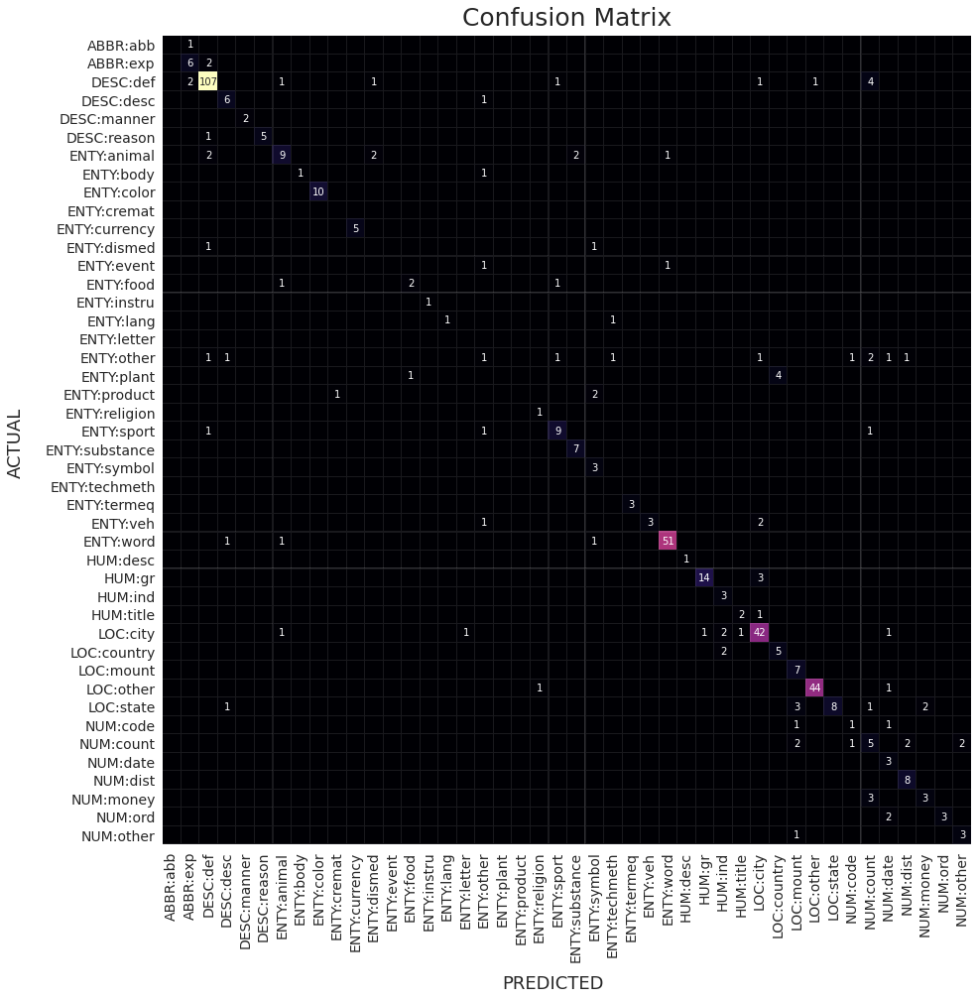

In [33]:
# Get state dictionary and load model
checkpoint = torch.load('models/xlgru.pt')
xlgru.load_state_dict(checkpoint['model_state_dict'])

# Test
cr = test_model(xlgru, criterion, test_loader, evaluation_step, BATCH_SIZE, MAX_LEN, return_cr=True)

Testing accuracy of 80.21% definitely isn't horrible! A more extensive grid search as well as longer training could possibly increase this. 

However, we may learn more about our model's performance by looking at the different metrics (precision, recall, f1-score) vs. the number of those labels in our training/testing set. In the exploratory data analysis, we saw that there was one label with a higher frequency than the others, so its worthwhile to ask if this was a factor in training.

In the following dataframe, 'count' will be used to represent the number of examples of that label in the training set (the full training set, before it was split into training/validation) and 'support' will be the number of examples of that label present in the testing set.


In [34]:
# Get classification report
report = pd.DataFrame(cr, dtype='int64')
report = report.set_index('id')
report.index.astype(int)

# Get label counts
counts = df_train['label'].value_counts().to_frame()
counts = counts.reset_index()
counts.columns = ['label', 'count']
counts['id'] = counts['label'].apply(lambda x: label_dict_stoi[x])
counts = counts.set_index('id')
counts = counts.sort_index()

# Concatenate and sort by f1-score
counts = counts.join(report, on='id', how='left')
counts.sort_values('f1-score')

/usr/local/lib/python3.7/dist-packages/numpy/core/numeric.py:2378: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


,label,count,precision,recall,f1-score,support
id,,,,,,
0,ABBR:abb,16,0.00,0.00,0.00,1.0
18,ENTY:plant,13,0.00,0.00,0.00,5.0
16,ENTY:letter,9,0.00,0.00,0.00,0.0
27,ENTY:word,26,0.00,0.00,0.00,0.0
9,ENTY:cremat,207,0.00,0.00,0.00,0.0
19,ENTY:product,42,0.00,0.00,0.00,3.0
11,ENTY:dismed,103,0.00,0.00,0.00,2.0
12,ENTY:event,56,0.00,0.00,0.00,2.0
17,ENTY:other,217,0.17,0.09,0.12,11.0


When looking at the f1-scores, which provide a better picture than just accuracy, we see a lot of 0 scores in subdivisions of the ENTY label, showing that our model has a tough time discerning questions about specific types of entities. Some of the NUM labels also have lower f1-scores, so the model isn't doing well at telling the difference between different types of numerical questions. Beyond that, we start to see the f1-scores rise, with a decent number of them at 0.67 and above. Let's investigate whether the distribution of labels plays a role in the f1-score.

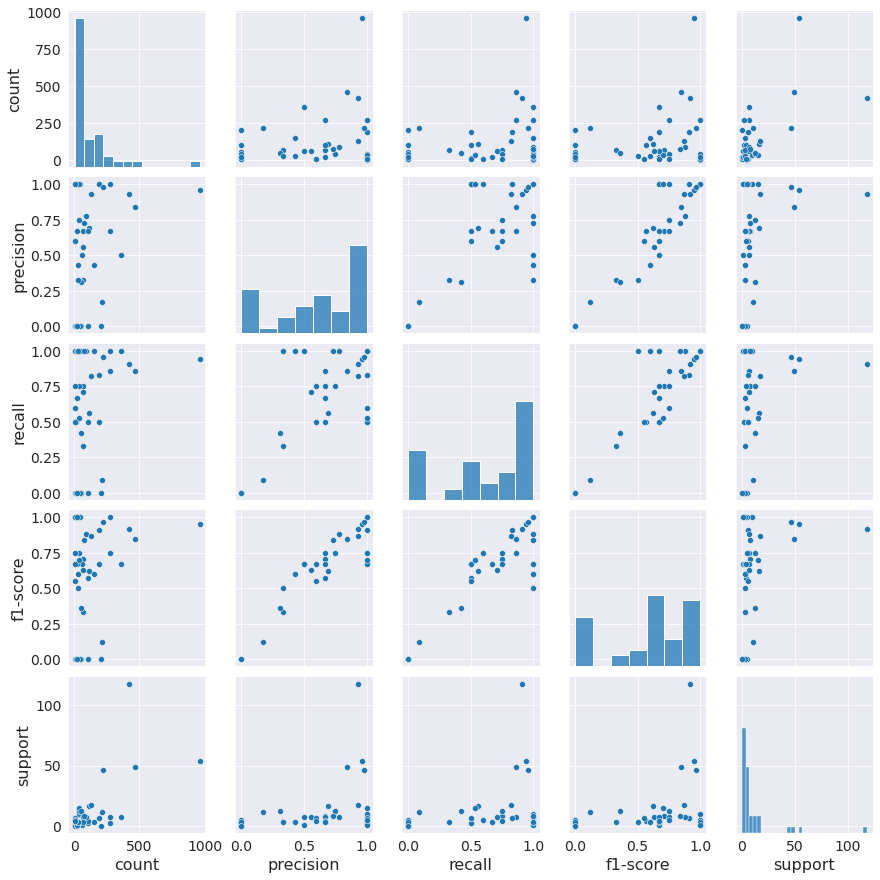

In [35]:
# Pair plot metrics and count/support
sns.pairplot(data=counts[['count', 'precision', 'recall', 'f1-score', 'support']].dropna().astype(float))

When we look at the number of labels present in training (count) vs. each of our metrics, it's not necessarily that case that more training examples correlates with a higher value of the metric. The same can be said when we look at the number of labels present in testing (support) vs. each metric. So while we may wonder if a lack of certain labels in our training set leads to the model not being able to recognize that label, we can't really say that this is the case.

Let's now normalize our count and support columns to proportions, so that we can visualize this data in another way.

In [36]:
counts['count_prop'] = counts['count'] / 5452
counts['support_prop'] = counts['support'] / 480
counts

,label,count,precision,recall,f1-score,support,count_prop,support_prop
id,,,,,,,,
0,ABBR:abb,16,0.00,0.00,0.00,1.0,0.002935,0.002083
1,ABBR:exp,70,0.67,0.75,0.71,8.0,0.012839,0.016667
2,DESC:def,421,0.93,0.91,0.92,118.0,0.077219,0.245833
3,DESC:desc,274,0.67,0.86,0.75,7.0,0.050257,0.014583
4,DESC:manner,276,1.00,1.00,1.00,2.0,0.050624,0.004167
5,DESC:reason,191,1.00,0.83,0.91,6.0,0.035033,0.012500
6,ENTY:animal,112,0.69,0.56,0.62,16.0,0.020543,0.033333
7,ENTY:body,16,1.00,0.50,0.67,2.0,0.002935,0.004167
8,ENTY:color,40,1.00,1.00,1.00,10.0,0.007337,0.020833


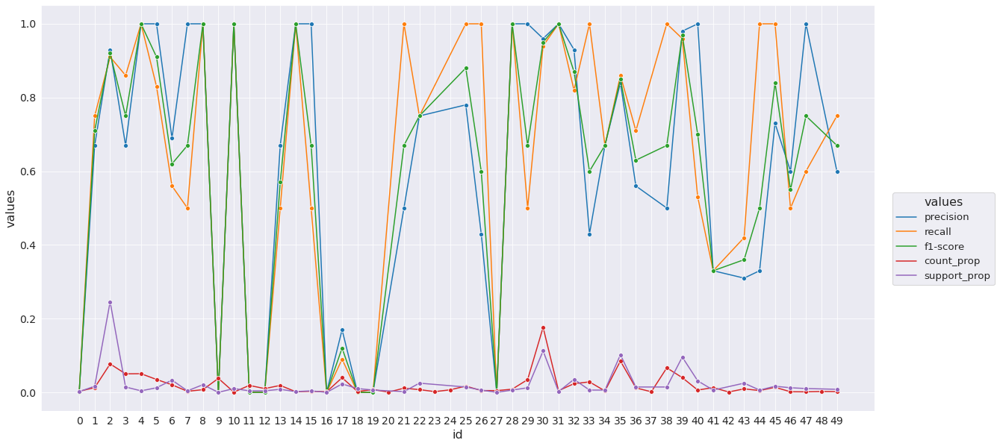

In [37]:
# Line plots
count2 = counts.reset_index().drop(['label', 'count', 'support'], axis=1)
count2 = count2.astype(float).melt('id', var_name='cols', value_name='values')
sns.lineplot(data=count2, x='id', y='values', hue='cols', marker='o')
plt.xticks([i for i in range(0, 50)])
plt.legend(title='values', bbox_to_anchor=(1.15, 0.55))

In the line plots (as opposed to the scatter plots), we can readily see that higher peaks in the count/support proportions do not correspond with higher peaks in precision/recall/f1-score.



---

## Making Predictions

We can now use our model to make a few predictions of our own and see how it performs!




### Prediction Utilities

Functions used for making predictions with a model.

In [40]:
def predict_label(model, question, labels_itos, p=True):
  """Predicts label for given question.

    Args:
        model: model to use for prediction.
        question: question to get label for.
        label_itos: label id to string dictionary.
        p: if True, prints results, returns otherwise.
    Returns:
        predicted label.
        
  """ 
  # Put model in evaluation mode
  model.eval()

  # Tokenize sentence
  tokenized = tokenizer.tokenize(question)

  # Change tokens to ids, then create tensor    
  indexed = [vocab[t] for t in tokenized]
  tensor = torch.LongTensor(indexed).to(device)
  tensor = tensor.unsqueeze(1)
  tensor = tensor.permute(1,0)

  # Get predictions from model
  preds = model(tensor)

  # Choose prediction with highest probability
  max_preds = preds.argmax(dim=1)
  id = max_preds.item()

  # Get label from predicted id
  label = labels_itos[id]

  # Get label description from label_refs dataframe
  desc = label_refs.loc[label]['description']

  # Print or return
  if p:
    print(f'ID:\t{id}')
    print(f'Label:\t{label} ({desc})')

  return label

In [41]:
def pred_generator(df=pd.DataFrame(columns=['question', 'label'])):
  """Lets user continuously enter questions to predict and print labels for.

    Args:
        df: dataframe to save input/output to dataframe.
    Returns:
        dataframe of questions and generated labels.
        
  """ 

  while True:
    # Clear display
    clear_output()

    # Get input
    q = str(input('Enter question to classify: '))

    # Get prediction
    label = predict_label(xlgru, q, label_dict_itos)

    # Add to dataframe
    df = df.append({'question': q, 'label': label}, ignore_index=True)

    # Ask user if they want to continue
    cont = str(input('\nPress any key to continue. \nType Q to quit.\n'))

    if cont.lower() == 'q':
      break
    else:
      df = pred_generator(df)
      break

  return df

### Implementation

Let's see how well our model does at generating labels from user defined questions.

In [42]:
# Single prediction
q = 'What temperature should I bake the cake at?'
predict_label(xlgru, q, label_dict_itos);

ID:	47
Label:	NUM:temp (numeric - temperature)


In [43]:
# Multiple predictions
d = pred_generator()

Enter question to classify: which breed of dog is best
ID:	6
Label:	ENTY:animal (entity - animals)

Press any key to continue. 
Type Q to quit.
q


In [44]:
# Overview of predictions made
d

,question,label
0,what color is the sky?,ENTY:color
1,how old am i?,DESC:manner
2,who is the president of the united states,HUM:ind
3,what is the primary language of Spain?,ENTY:lang
4,What currency is used in Mexico?,NUM:other
5,How much wood could a woodchuck chuck?,NUM:count
6,Why is a raven like a writing desk?,DESC:manner
7,which breed of dog is best,ENTY:animal


The model isn't perfect, but is performing pretty well overall!



---

## Concluding Remarks

There are a few things that could be done to try to improve performance of our model:

- Augmenting the data in a way that normalizes the distribution of labels.
- More experimentation with data processing/cleaning. In particular, nonsensical words can be removed.
- Longer training.
- Add bi/tri/n-grams as features for training.
- Experiment with different models.
- Get more data for training, specifically in the underperforming labels.



